<a href="https://colab.research.google.com/github/GuilhermeMBS/Cesarian-Data-Analysis/blob/main/ENG4040_Grupo04_33A.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

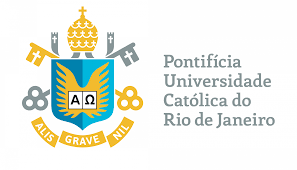

# Projeto Ciência de Dados – Análise de Risco em Cesarianas
*Grupo 4: Francisco Kurban, Guilherme Soares, João Pedro Cozac, Rafael Gama, Vinícius Coutinho*

---

## Descrição do Projeto
Este projeto analisa os partos no Brasil, com foco em:
- Identificar padrões nos partos que foram considerados procedimentos de **alto risco**;
- Criar um modelo comparativo para **quantificar o aumento no risco do parto em caso de cesariana**;  
- Estratificar **análise de risco** para apoiar decisões clínicas e políticas públicas.

## Bases de Dados
- **SIH-SUS (Sistema de Informações Hospitalares):** registros de internações e procedimentos.  
- **SINASC (Sistema de Informações sobre Nascidos Vivos):** informações demográficas e de saúde dos nascimentos.  

Essas bases são complementares:  
- O **SIH** traz dados sobre hospitalizações e procedimentos (incluindo cesarianas).  
- O **SINASC** descreve o perfil materno e neonatal, permitindo caracterizar os partos.

*Obs.: Dados obtidos no portal oficial do DataSUS.*

## Estrutura do Notebook
1. **Configuração do Ambiente** - Arquivos, bibliotecas e importações para a utilização dos códigos.
2. **Mapa de Variáveis** - códigos, significado e formatação das variáveis dos bancos de dados.
3. **Funções Auxiliares** - Funções recorrentemente utilizadas nos códigos
4. **Coleta de Dados** – Extração dos dados brutos e conversão para tabelas.  
5. **Tratamento de Dados** – Seleção das variáveis úteis e filtro dos dados para o objetivo do projeto.  
6. **Integração** – Padronização e unificação dos bancos de dados do SIH e do SINASC em uma única tabela.
7. **Análise dos Dados** – Análise exploratória dos dados e um novo tratamento com base nela.
8. **Machine Learning** – Seleção das features de treinamento para identificar o melhor modelo e teste prático com uma gestante arbitrária de baixo risco clínico.



---



## **1) Configuração do Ambiente**

**Conteúdo:**
*   Drive para baixar os arquivos usados no programa;
*   Código para limpar o ficheiro;
*   Instalações e importações das bibliotecas;
*   Carregamento dos arquivos baixados.

### 1.1) Download dos Arquivos

*Baixe todos os [arquivos](https://drive.google.com/drive/folders/1JWsNXTkWx6sKw0L91Ui-XLLsH-kqprmY?usp=sharing) da pasta*

### 1.2) Instalação dos Pacotes

In [ ]:
!pip install readdbc dbfread # Conversão dos arquivos

# Mapa interativo
!pip install -U plotly
!pip install -U kaleido
!plotly_get_chrome # Digite "y" para baixar quando for pedido

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 479.4/479.4 kB 18.6 MB/s eta 0:00:00
  Created wheel for simpledbf: filename=simpledbf-0.2.6-py3-none-any.whl size=13786 sha256=166e4d928c0d76ff22361cc8dd438f3065ed8306cad54239f65264a9f586987c
  Stored in directory: /root/.cache/pip/wheels/7d/53/e7/7002aa67a7d1ff157663e0009d2ff1735020a669a5034c7ba4
Successfully built simpledbf
  Attempting uninstall: cffi
    Found existing installation: cffi 2.0.0
    Uninstalling cffi-2.0.0:
      Successfully uninstalled cffi-2.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pygit2 1.19.0 requires cffi>=2.0, but you have cffi 1.17.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 82.1 MB/s eta 0:00:00
  Attempting uninstall: plotly
    Found existing installation: plotly 5.24.1
    Uninstalling plotly-5.24.1

### 1.3) Importação das Bibliotecas

In [ ]:
# Bibliotecas que serão usadas ao longo do código
from google.colab import files
import zipfile
import os
import readdbc
from dbfread import DBF
import pandas as pd
import shutil
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import geopandas as gpd
import plotly.express as px

# Bibliotecas usadas para os modelos de treinamento
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import roc_auc_score, classification_report
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.utils import resample

# Retirar warnings do treinamento
import warnings
from warnings import filterwarnings

filterwarnings('ignore', category=UserWarning, module='sklearn.preprocessing._encoders')
filterwarnings('ignore', category=UserWarning, module='xgboost.training')
filterwarnings('ignore', category=UserWarning, module='sklearn.utils.validation')

### 1.4) Organização dos Diretórios

In [ ]:
# Função que cria ou limpa os diretórios que serão usados
def reset_pasta(path):
    if os.path.exists(path):
        shutil.rmtree(path)  # Remove a pasta se existir
    os.makedirs(path, exist_ok=True) # Cria a pasta

# Diretórios que serão usados
reset_pasta("data")
reset_pasta("data/raw")
reset_pasta("data/interim")
reset_pasta("data/interim/dados_sinasc")
reset_pasta("data/interim/dados_sih")
reset_pasta("data/processed")
reset_pasta("data/reference")
reset_pasta("data/outputs")
reset_pasta("data/outputs/figs")
reset_pasta("data/outputs/tabelas")

### 1.5) Upload dos Arquivos

*PS.: Para fazer o upload de múltiplos arquivos em uma única seleção, basta segurar Ctrl e selecionar todos os arquivos desejados*

In [ ]:
# Faça upload de TODOS os arquivos do Drive
uploaded = files.upload()

# Confira se estão todos os arquivos do Drive
print(uploaded.keys())


Saving 2023-RJ-SIH.zip to 2023-RJ-SIH.zip
Saving 2023-RJ-SINASC.zip to 2023-RJ-SINASC.zip
Saving 2024_RJ_MUNICIPIOS.zip to 2024_RJ_MUNICIPIOS.zip
Saving mapping_sih_sinasc.csv to mapping_sih_sinasc.csv
dict_keys(['2023-RJ-SIH.zip', '2023-RJ-SINASC.zip', '2024_RJ_MUNICIPIOS.zip', 'mapping_sih_sinasc.csv'])


### 1.6) Alocação dos Arquivos

*Todos os arquivos devem ter sido importados na célula anterior!*

In [ ]:
# Mover arquivos para suas respectivas pastas
for filename in uploaded.keys():
    if ".zip" in filename:
        shutil.move(filename, os.path.join("data/raw", filename))
    elif "mapping" in filename:
        shutil.move(filename, os.path.join("data/reference", filename))
    else:
        print(f"Arquivo {filename} não reconhecido.")

## **2) Mapa de Variáveis**

| Variável | Significado                       | Valores possíveis                                                                    |
| ------- | --------------------------------- | -------------------------------- |
| **SIH**  |                   |                   |
| PROC\_REA    | Procedimento realizado            | Ex.: 0310010039 = Parto Normal                                                       |
| MORTE        | Óbito na internação               | 0 = Não, 1 = Sim                                                                     |
| GESTRISCO    | Gestação de risco                 | 1 = Sim, 2 = Não, 9 = Ignorado                                                       |
| CAR\_INT     | Caráter da internação             | 1 = Eletiva, 2 = Urgência, 3 = Outros                                                |
| COMPLEX      | Complexidade do procedimento      | 01 = Básica, 02 = Média, 03 = Alta                                                   |
| NUM\_FILHOS  | Número de filhos vivos            | Numérico                                                                             |
| INSTRU       | Escolaridade do paciente          | 0 = Sem instrução, 1–8 = níveis crescentes, 9 = Ignorado                             |
| NUM\_PROC    | Número de procedimentos           | Numérico                                                                             |
| DIAG\_PRINC  | Diagnóstico principal             | Código CID-10                                                                        |
| DIAG\_SECUN  | Diagnóstico secundário            | Código CID-10                                                                        |
| RACA\_COR    | Raça/Cor                          | 1 = Branca, 2 = Preta, 3 = Parda, 4 = Amarela, 5 = Indígena, 9 = Ignorado            |
| ETNIA        | Etnia indígena                    | Código numérico da etnia (FUNASA)                                                    |
| ------- | --------------------------------- | -------------------------------- |
| **SINASC** |  | |
| CODESTAB   | Código do estabelecimento onde ocorreu o parto (CNES) | Código CNES (7 dígitos)                                                                                  |
| DTNASCMAE  | Data de nascimento da mãe                             | DDMMAAAA                                                                                                 |
| DTNASC     | Data de nascimento do recém-nascido                   | DDMMAAAA                                                                                                 |
| IDADEMAE   | Idade da mãe em anos completos                        | Numérico                                                                                                 |
| QTDFILVIVO | Número de filhos vivos                                | Numérico                                                                                                 |
| QTDFILMORT | Número de filhos mortos                               | Numérico                                                                                                 |
| GESTACAO   | Duração da gestação (faixas)                          | 1 = <22 sem, 2 = 22–27, 3 = 28–31, 4 = 32–36, 5 = 37–41, 6 = 42+, 9 = Ignorado                           |
| GRAVIDEZ   | Tipo de gravidez                                      | 1 = Única, 2 = Dupla, 3 = Tripla+, 9 = Ignorado                                                          |
| PARTO      | Tipo de parto                                         | 1 = Vaginal, 2 = Cesáreo                                                                                 |
| CONSULTAS  | Nº de consultas pré-natal                             | 0 = Nenhuma, 1 = 1–3, 2 = 4–6, 3 = 7+, 9 = Ignorado                                                      |
| SEXO       | Sexo do recém-nascido                                 | 1 = Masculino, 2 = Feminino, 9 = Ignorado                                                                |
| APGAR1     | Apgar no 1º minuto                                    | 0–10                                                                                                     |
| APGAR5     | Apgar no 5º minuto                                    | 0–10                                                                                                     |
| RACACOR    | Raça/Cor do recém-nascido                             | 1 = Branca, 2 = Preta, 3 = Amarela, 4 = Parda, 5 = Indígena, 9 = Ignorado                                |
| PESO       | Peso ao nascer (g)                                    | Numérico                                                                                                 |
| IDANOMAL   | Existência de anomalia congênita                      | 1 = Sim, 2 = Não, 9 = Ignorado                                                                           |
| RACACORMAE | Raça/Cor da mãe                                       | 1 = Branca, 2 = Preta, 3 = Amarela, 4 = Parda, 5 = Indígena, 9 = Ignorado                                |
| QTDGESTANT | Total de gestações anteriores                         | Numérico                                                                                                 |
| QTDPARTNOR | Nº de partos normais anteriores                       | Numérico                                                                                                 |
| QTDPARTCES | Nº de partos cesáreos anteriores                      | Numérico                                                                                                 |
| DTULTMENST | Data da última menstruação                            | DDMMAAAA                                                                                                 |
| SEMAGESTAC | Idade gestacional em semanas (exata)                  | Numérico                                                                                                 |
| CONSPRENAT | Nº de consultas pré-natal (recodificada)              | 0 = Nenhuma, 1 = 1–3, 2 = 4–6, 3 = 7+, 9 = Ignorado                                                      |
| MESPRENAT  | Mês de início do pré-natal                            | 1–9 (em faixas, varia conforme ano), 9 = Ignorado                                                        |
| TPAPRESENT | Apresentação fetal                                    | 1 = Cefálica, 2 = Pélvica, 3 = Transversa, 9 = Ignorado                                                  |
| TPROBSON | Tipo de parto segundo a classificação de Robson         | Numérico de 1 a 10                                   |
| KOTELCHUCK | Índice de adequação do pré-natal (Kotelchuck)         | 1 = Inadequado, 2 = Intermediário, 3 = Adequado, 4 = Mais que adequado                                   |

[Mapeamento Completo](https://docs.google.com/spreadsheets/d/1wWlxSirqqwl2-YhH65RMZhCwM2-l5o45/edit?usp=drive_link&ouid=114120906508605822010&rtpof=true&sd=true)

## **3) Funções Auxiliares**

**Conteúdo:**
*   Extração de arquivo ZIP;
*   Conversão de DBC para CSV;
*   Verificação de Nulos;
*   Salvamento de Arquivos;
*   Treinamento do Pipeline;
*   Comparação de Modelos de Machine Learning;
*   Ajuste de Hiperparâmetros.

### 3.1) Extração do ZIP

In [ ]:
"""
Extrai arquivos ZIP de uma fonte de dados específica ('SIH' ou 'SINASC')
para o diretório intermediário correspondente.

Args:
  data_source (str): A fonte de dados ('SIH' ou 'SINASC') ou o mapa geográfico ('UF_MUNICIPIOS')
"""

def extract_zip(data_source):
    raw_dir = "data/raw"
    interim_dir = f"data/interim/dados_{data_source.lower()}" # Diretório onde dados serão enviados
    reference_dir = f"data/reference/mapa_{data_source.lower()}" # Diretório onde os mapas serão enviados

    # Padrão para encontrar o arquivo ZIP
    zip_pattern = f"{data_source.upper()}.zip" # Todos os anos e municípios terminam em SINASC.zip ou SIH.zip
    print(f"Procurando por arquivos ZIP com '{zip_pattern}' em {raw_dir}...")

    extracted_count = 0 # Contagem de arquivos extraídos
    for filename in os.listdir(raw_dir): # Percorre a pasta dos arquivos brutos (.zip do Drive)
        if zip_pattern in filename:
            zip_path = os.path.join(raw_dir, filename) # Nome completo do arquivo (com diretório)
            try:
                with zipfile.ZipFile(zip_path, 'r') as zip_ref:
                  if "municipios" in data_source.lower():
                    zip_ref.extractall(reference_dir) # Extração para o destino
                    print(f"Extraído {filename} para {reference_dir}")
                    extracted_count += 1
                  else:
                    zip_ref.extractall(interim_dir) # Extração para o destino
                    print(f"Extraído {filename} para {interim_dir}")
                    extracted_count += 1
            except zipfile.BadZipFile: # Caso ZIP ruim
                print(f"Erro: O arquivo {filename} não é um arquivo zip válido.") # Erro no ZIP
            except Exception as e: # Outros erros
                print(f"Ocorreu um erro ao extrair {filename}: {e}") # Erro no arquivo

    # Nenhum arquivo para extração
    if extracted_count == 0:
        print(f"Aviso: Nenhum arquivo ZIP contendo '{zip_pattern}' encontrado em {raw_dir}.")

### 3.2) Conversão de DBC para CSV

In [ ]:
"""
Converte todos os arquivos DBC de um diretório para arquivos DBF e
concatena todos eles em um único DataFrame, salvo como CSV.

Args:
  data_source (str): A fonte de dados ('sih' ou 'sinasc').
"""

def convert_dbc_to_single_csv(data_source):
    interim_dir = f"data/interim/dados_{data_source.lower()}" # Onde estão os DBC
    processed_dir = "data/processed" # Destino dos CSV
    dfs = []

    # Converter DBC para DBF e ler para DataFrame
    for filename in os.listdir(interim_dir):
        if filename.endswith(".dbc"):
            dbc_path = os.path.join(interim_dir, filename) # Nome completo do arquivo (com diretório)
            dbf_path = os.path.join(interim_dir, filename.replace(".dbc", ".dbf")) # Criar DBF tamporário no mesmo diretório
            if os.path.exists(dbc_path):
                try:
                    readdbc.dbc2dbf(dbc_path, dbf_path) # Converte DBC para DBF
                    print(f"Convertido {filename} para {os.path.basename(dbf_path)}")

                    table = DBF(dbf_path, encoding='latin1') # Ler DBF temporário em DataFrame
                    df_month = pd.DataFrame(iter(table))
                    dfs.append(df_month)
                    print(f"Lido {os.path.basename(dbf_path)}")

                    os.remove(dbf_path) # Remover DBF temporário
                    print(f"Removido arquivo temporário: {os.path.basename(dbf_path)}")

                except Exception as e: # Caso de erro
                    print(f"Ocorreu um erro ao processar {filename}: {e}")
            else: # Se não tiver .dbc na pasta
                print(f"Aviso: {filename} não encontrado em {interim_dir}.")


    # Concatenação de todos os meses dos arquivos DBF
    if dfs:
        df_combined = pd.concat(dfs, ignore_index=True)
        print("Shape do DataFrame combinado:")
        display(df_combined.shape)

        display(df_combined.head())

        # Converter DBF unificado para CSV
        combined_csv_filename = f"dados_unificados_{data_source.lower()}.csv"
        combined_csv_path = os.path.join(processed_dir, combined_csv_filename)
        try:
            df_combined.to_csv(combined_csv_path, index=False, encoding='latin1')
            print(f"\nDataFrame combinado salvo em {combined_csv_path}")
        except Exception as e:
            print(f"Ocorreu um erro ao salvar o arquivo CSV: {e}")

        return df_combined # Retorna o DataFrame combinado
    else:
        print(f"\nNenhum arquivo DBC encontrado em {interim_dir} para concatenar.")
        return None # Retorna None se nenhum arquivo foi processado

### 3.3) Verificação de Nulos

In [ ]:
"""
Verifica a contagem de valores nulos em um DataFrame e exibe as colunas
com nulos, bem como o total de nulos.

Args:
    df (pd.DataFrame): O DataFrame a ser verificado.
"""

def check_nulls(df):
    # Contagem de nulos por coluna (usando soma)
    null_counts = df.isnull().sum()

    # Mostrar colunas com nulos
    columns_with_nulls = null_counts[null_counts > 0]
    print("Colunas com valores nulos e suas contagens:")
    display(columns_with_nulls)

    # Total de nulos na tabela (só para verificação)
    print("\nTotal de valores nulos no DataFrame:")
    display(null_counts.sum())

### 3.4) Salvamento de Arquivo

In [ ]:
"""
Salva um objeto (DataFrame ou figura do matplotlib) em um arquivo especificado.

Args:
    data: O objeto a ser salvo (pd.DataFrame ou figura do matplotlib).
    filename (str): O nome do arquivo (sem extensão).
    file_type (str): O tipo do arquivo ('csv' ou 'png').
    output_dir (str): O diretório onde o arquivo será salvo.
"""

def save_file(data, filename, file_type, output_dir):
    # Garante que o diretório de saída existe
    os.makedirs(output_dir, exist_ok=True)

    file_path = os.path.join(output_dir, f"{filename}.{file_type}")

    try:
        if file_type.lower() == 'csv':
            if isinstance(data, pd.DataFrame):
                data.to_csv(file_path, index=False)
                print(f"DataFrame '{filename}.csv' salvo em {output_dir}")
            else:
                print(f"Erro: O objeto fornecido não é um DataFrame para o tipo CSV.")
        elif file_type.lower() == 'png':
            # Assume que 'data' é uma figura do matplotlib
            if isinstance(data, plt.Figure):
                 data.savefig(file_path)
                 print(f"Figura '{filename}.png' salvo em {output_dir}")
            else:
                 # Se não for uma figura explícita, tenta salvar a figura ativa
                 try:
                     plt.savefig(file_path)
                     print(f"Figura ativa '{filename}.png' salva em {output_dir}")
                 except Exception as e:
                      print(f"Erro: Não foi possível salvar o objeto como PNG. Certifique-se de que é uma figura do matplotlib ou que há uma figura ativa. Detalhes: {e}")

        else:
            print(f"Erro: Tipo de arquivo '{file_type}' não suportado. Use 'csv' ou 'png'.")

    except Exception as e:
        print(f"Ocorreu um erro ao salvar o arquivo {file_path}: {e}")

### 3.5) Treinamento do Pipeline

In [ ]:
"""
Prepara um DataFrame para treinamento de um modelo de aprendizado de máquina.

Args:
    df: DataFrame contendo os dados.
    feature_list (list): Lista de nomes de colunas a serem usadas como recursos.
    target_name (str): Nome da coluna alvo.
    test_size (float): Proporção dos dados a serem usados como conjunto de teste.
    random_state (int): Semente para a geração de números aleatórios.
"""

def prepare_pipeline(df, feature_list, target_name, test_size, random_state):
    print(f"Preparando dados para: {target_name}")

    X = df[feature_list]
    y = df[target_name]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state, stratify=y)
    print(f"Shape de X_train: {X_train.shape}")
    print(f"Shape de X_test: {X_test.shape}")

    # Pipeline de pré-processamento
    numeric_features = X_train.select_dtypes(include=np.number).columns.tolist()
    categorical_features = X_train.select_dtypes(exclude=np.number).columns.tolist()

    # Pipeline para dados numéricos
    numeric_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler())
    ])

    # Pipeline para dados categóricos
    categorical_transformer = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('onehot', OneHotEncoder(handle_unknown='ignore', drop='first'))
    ])

    # Combina os pipelines
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ],
        remainder='passthrough'
    )

    return X_train, X_test, y_train, y_test, preprocessor

### 3.6) Comparativo dos Modelos de Machine Learning

In [ ]:
"""
Compara e avalia diferentes modelos de aprendizado de máquina.

Args:
    X_train: Dados de treinamento.
    X_test: Dados de teste.
    y_train: Rótulos de treinamento.
    y_test: Rótulos de teste.
    preprocessor: Pré-processador.
    use_smote (bool): Indica se o SMOTE deve ser usado.
"""

def model_comparison(X_train, X_test, y_train, y_test, preprocessor, use_smote=False):
    trained_pipelines = {}

    try:
        scale_pos_weight = (len(y_train) - y_train.sum()) / y_train.sum()
    except ZeroDivisionError:
        scale_pos_weight = 1

    models = {
        "Regressão Logística": LogisticRegression(max_iter=2000, random_state=42, class_weight='balanced'),
        "Random Forest": RandomForestClassifier(random_state=42, class_weight='balanced'),
        "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss', scale_pos_weight=scale_pos_weight),
        "LightGBM": LGBMClassifier(random_state=42, class_weight='balanced', verbosity=-1)
    }

    results_list = []

    for name, model in models.items():
        print(f"\n--- Treinando e Avaliando: {name} ---")

        if use_smote:
            min_class_count = y_train.value_counts().min()
            model_pipeline = ImbPipeline(steps=[
                ('preprocessor', preprocessor),
                ('smote', SMOTE(random_state=42)),
                ('classifier', model)
            ])
        else:
            # Comportamento original: usa o pipeline padrão do sklearn
            model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                            ('classifier', model)])

        # Treina o pipeline
        model_pipeline.fit(X_train, y_train)
        trained_pipelines[name] = model_pipeline

        # Faz as previsões
        y_pred = model_pipeline.predict(X_test)
        y_pred_proba = model_pipeline.predict_proba(X_test)[:, 1]

        # Calcula e armazena as métricas
        auc = roc_auc_score(y_test, y_pred_proba)
        report = classification_report(y_test, y_pred, output_dict=True, zero_division=0)

        # Pega métricas da classe '1'. Se não houver, usa 0.
        recall_class_1 = report.get('1', {'recall': 0.0})['recall']
        precision_class_1 = report.get('1', {'precision': 0.0})['precision']

        results_list.append({
            'Modelo': name,
            'AUC': auc,
            'Recall (classe 1)': recall_class_1,
            'Precisão (classe 1)': precision_class_1
        })

        print(f"Resultado para {name}: AUC={auc:.3f}, Recall={recall_class_1:.3f}, Precisão={precision_class_1:.3f}")

    # Ranking Final
    results_df = pd.DataFrame(results_list)
    # print("\n--- Ranking Final dos Modelos ---")
    # display(results_df.sort_values(by='AUC', ascending=False))

    # Retorna o DataFrame de resultados
    return results_df, trained_pipelines

### 3.7) Hiperparâmetros do LGBM

In [ ]:
"""
Ajusta os hiperparâmetros de um pipeline de LGBM.

Args:
    X_train: Dados de treinamento.
    X_test: Dados de teste.
    y_train: Rótulos de treinamento.
    y_test: Rótulos de teste.
    preprocessor: Pré-processador.
    use_smote (bool): Indica se o SMOTE deve ser usado.
    n_iter (int): Número de iterações para a busca aleatória.
    cv (int): Número de folds para validação cruzada.
"""

def tune_lgbm_pipeline(X_train, X_test, y_train, y_test, preprocessor, use_smote=False, n_iter=25, cv=3):
    print(f"\n--- Iniciando Ajuste de Hiperparâmetros (Tuning) para LightGBM ---")
    print(f"Usando SMOTE: {use_smote}")
    print(f"Iterações: {n_iter}, Folds de CV: {cv}")

    # Define o classificador base (será configurado pelo RandomizedSearch)
    # Colocamos 'class_weight' aqui como um fallback, mas o search pode sobrepor
    lgbm = LGBMClassifier(random_state=42, class_weight='balanced', verbosity=-1)

    if use_smote:
        min_class_count = y_train.value_counts().min()
        if min_class_count < 6:
            print("AVISO (SMOTE): Classe minoritária tem < 6 amostras. SMOTE não será aplicado.")
            pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', lgbm)])
        else:
            print("Info: Pipeline será criado com SMOTE.")
            pipeline = ImbPipeline(steps=[
                ('preprocessor', preprocessor),
                ('smote', SMOTE(random_state=42)),
                ('classifier', lgbm)
            ])
    else:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', lgbm)])

    # Definir o "Grid" de Parâmetros para o Search
    param_dist = {
        'classifier__n_estimators': randint(100, 500), # Número de árvores
        'classifier__learning_rate': uniform(0.01, 0.2), # Taxa de aprendizado
        'classifier__num_leaves': randint(20, 50), # Número de folhas por árvore
        'classifier__max_depth': randint(5, 20), # Profundidade máxima
        'classifier__subsample': uniform(0.7, 0.3), # Amostragem de linhas (0.3 = 1.0 - 0.7)
        'classifier__colsample_bytree': uniform(0.7, 0.3) # Amostragem de colunas
    }

    # Configurar o RandomizedSearchCV otimizando pela AUC
    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_dist,
        n_iter=n_iter,       # Número de combinações a testar
        cv=cv,               # Número de folds de validação cruzada
        scoring='roc_auc',   # Métrica de otimização
        n_jobs=-1,           # Usar todos os processadores
        random_state=42,
        verbose=1            # Mostra o progresso
    )

    # Treinar
    print("\nIniciando o fit do RandomizedSearch (isso pode demorar)...")
    random_search.fit(X_train, y_train)

    print("\n--- Resultados do Tuning ---")
    print(f"Melhor Score (AUC) na validação cruzada: {random_search.best_score_:.4f}")
    print("Melhores Hiperparâmetros encontrados:")
    print(random_search.best_params_)

    # Retorna o MELHOR pipeline já treinado com os melhores parâmetros
    return random_search.best_estimator_

### 3.8) Hiperparâmetros do XGBoost

In [ ]:
"""
Ajusta os hiperparâmetros de um pipeline de XGBoost.

Args:
    X_train: Dados de treinamento.
    X_test: Dados de teste.
    y_train: Rótulos de treinamento.
    y_test: Rótulos de teste.
    preprocessor: Pré-processador.
    use_smote (bool): Indica se o SMOTE deve ser usado.
    n_iter (int): Número de iterações para a busca aleatória.
    cv (int): Número de folds para validação cruzada.
"""

def tune_xgboost_pipeline(X_train, X_test, y_train, y_test, preprocessor, use_smote=False, n_iter=25, cv=3):
    print(f"\n--- Iniciando Ajuste (Tuning) para XGBoost ---")
    print(f"Usando SMOTE: {use_smote}")
    print(f"Iterações: {n_iter}, Folds de CV: {cv}")

    # Definir o Pipeline (com ou sem SMOTE)
    if not use_smote:
        try:
            scale_pos_weight = (len(y_train) - y_train.sum()) / y_train.sum()
        except ZeroDivisionError:
            scale_pos_weight = 1
        print(f"Info: XGBoost (Base) usará scale_pos_weight = {scale_pos_weight:.2f}")
    else:
        scale_pos_weight = 1 # SMOTE já balanceou

    xgb_classifier = XGBClassifier(
        random_state=42,
        use_label_encoder=False,
        eval_metric='logloss',
        scale_pos_weight=scale_pos_weight
    )

    if use_smote:
        min_class_count = y_train.value_counts().min()
        if min_class_count < 6:
            print("AVISO (SMOTE): Classe minoritária tem < 6 amostras. SMOTE não será aplicado.")
            pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', xgb_classifier)])
        else:
            print("Info: Pipeline será criado com SMOTE.")
            pipeline = ImbPipeline(steps=[
                ('preprocessor', preprocessor),
                ('smote', SMOTE(random_state=42)),
                ('classifier', xgb_classifier)
            ])
    else:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', xgb_classifier)])

    # Definir o "Grid" de Parâmetros para o Search
    param_dist = {
        'classifier__n_estimators': randint(100, 500),
        'classifier__learning_rate': uniform(0.01, 0.2),
        'classifier__max_depth': randint(3, 10), # XGB costuma usar árvores mais rasas
        'classifier__subsample': uniform(0.7, 0.3),
        'classifier__colsample_bytree': uniform(0.7, 0.3),
        'classifier__gamma': uniform(0, 0.5) # Parâmetro de regularização
    }

    # Configurar o RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_dist,
        n_iter=n_iter,
        cv=cv,
        scoring='roc_auc',
        n_jobs=-1,
        random_state=42,
        verbose=1
    )

    # Treinar
    print("\nIniciando o fit do RandomizedSearch (isso pode demorar)...")
    random_search.fit(X_train, y_train)

    print("\n--- Resultados do Tuning (XGBoost) ---")
    print(f"Melhor Score (AUC) na validação cruzada: {random_search.best_score_:.4f}")
    print("Melhores Hiperparâmetros encontrados:")
    print(random_search.best_params_)

    # Retorna o MELHOR pipeline já treinado
    return random_search.best_estimator_

### 3.9) Hiperparâmetros da Regressão Logística

In [ ]:
"""
Ajusta os hiperparâmetros (focado no 'C') de um pipeline de
Regressão Logística.

Args:
    X_train: Dados de treinamento.
    X_test: Dados de teste.
    y_train: Rótulos de treinamento.
    y_test: Rótulos de teste.
    preprocessor: Pré-processador.
    use_smote (bool): Indica se o SMOTE deve ser usado.
    n_iter (int): Número de iterações para a busca aleatória.
    cv (int): Número de folds para validação cruzada.
"""

def tune_logistic_pipeline(X_train, X_test, y_train, y_test, preprocessor, use_smote=False, n_iter=15, cv=3):
    """
    Função dedicada para o ajuste fino (tuning) de um pipeline de Regressão Logística.
    O tuning é focado no hiperparâmetro 'C'.
    """

    print(f"\n--- Iniciando Ajuste (Tuning) para Regressão Logística ---")
    print(f"Usando SMOTE: {use_smote}")
    print(f"Iterações: {n_iter}, Folds de CV: {cv}")

    # Definir o Pipeline (com ou sem SMOTE)
    log_reg_classifier = LogisticRegression(
        random_state=42,
        max_iter=2000, # Max_iter alto para garantir convergência
        class_weight='balanced' if not use_smote else None,
        solver='lbfgs' # Solver padrão que suporta 'l2'
    )

    if use_smote:
        min_class_count = y_train.value_counts().min()
        if min_class_count < 6:
            print("AVISO (SMOTE): Classe minoritária tem < 6 amostras. SMOTE não será aplicado.")
            pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', log_reg_classifier)])
        else:
            print("Info: Pipeline será criado com SMOTE.")
            pipeline = ImbPipeline(steps=[
                ('preprocessor', preprocessor),
                ('smote', SMOTE(random_state=42)),
                ('classifier', log_reg_classifier)
            ])
    else:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor), ('classifier', log_reg_classifier)])

    # Definir o "Grid" de Parâmetros para o Search com o principal parâmetro 'C' (força da regularização)
    param_dist = {
        # 'C' é o inverso da força da regularização. Valores menores = mais regularização.
        # Um range uniforme de 0.01 a 20 é um bom começo.
        'classifier__C': uniform(0.01, 20)
    }

    # Configurar o RandomizedSearchCV
    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_dist,
        n_iter=n_iter,
        cv=cv,
        scoring='roc_auc',
        n_jobs=-1,
        random_state=42,
        verbose=1
    )

    # Treinar
    print("\nIniciando o fit do RandomizedSearch (deve ser rápido)...")
    random_search.fit(X_train, y_train)

    print("\n--- Resultados do Tuning (Regressão Logística) ---")
    print(f"Melhor Score (AUC) na validação cruzada: {random_search.best_score_:.4f}")
    print("Melhores Hiperparâmetros encontrados:")
    print(random_search.best_params_)

    # Retorna o MELHOR pipeline já treinado
    return random_search.best_estimator_

### 3.10) Teste de Hipótese

In [ ]:
"""
    Testa se o Modelo A é estatisticamente superior ao Modelo B
    usando Bootstrap Pareado.
    H0: A diferença de performance (AUC) entre A e B é zero.
    Args:
        modelo_A: Modelo de aprendizado de máquina A.
        modelo_B: Modelo de aprendizado de máquina B.
        X_test: Dados de teste.
        y_test: Rótulos de teste.
"""

def teste_hipotese_comparacao(modelo_A, modelo_B, X_test, y_test, nome_A="Modelo A", nome_B="Modelo B", n_iterations=1000):
    # Previsões originais
    preds_A = modelo_A.predict_proba(X_test)[:, 1]
    preds_B = modelo_B.predict_proba(X_test)[:, 1]

    # AUC original
    auc_A = roc_auc_score(y_test, preds_A)
    auc_B = roc_auc_score(y_test, preds_B)
    diff_original = auc_A - auc_B

    # Prints limpos usando apenas os nomes (strings) passados
    print(f"   -> AUC {nome_A}: {auc_A:.4f}")
    print(f"   -> AUC {nome_B}: {auc_B:.4f}")
    print(f"   -> Diferença Original: {diff_original:.4f}")

    differences = []

    # Bootstrap
    for i in range(n_iterations):
        indices = resample(np.arange(len(y_test)), replace=True, random_state=i)

        # Tratamento seguro para pandas series vs numpy array
        y_sample = y_test.iloc[indices] if hasattr(y_test, 'iloc') else y_test[indices]
        pred_A_sample = preds_A[indices]
        pred_B_sample = preds_B[indices]

        score_A = roc_auc_score(y_sample, pred_A_sample)
        score_B = roc_auc_score(y_sample, pred_B_sample)
        differences.append(score_A - score_B)

    # Intervalo de Confiança e P-Valor
    lower = np.percentile(differences, 2.5)
    upper = np.percentile(differences, 97.5)
    p_value = np.mean(np.array(differences) <= 0)

    return diff_original, differences, lower, upper, p_value

### 3.11) Intervalo de Confiança

In [ ]:
def calcular_intervalo_confianca(modelo, X_test, y_test, metric_func=roc_auc_score, n_iterations=1000):
    y_pred_proba = modelo.predict_proba(X_test)[:, 1]
    stats = []

    # Executa o bootstrap
    for i in range(n_iterations):
        # Amostra com reposição (mantém o mesmo tamanho do teste original)
        y_true_boot, y_pred_boot = resample(y_test, y_pred_proba, random_state=i)
        # Calcula a métrica para essa amostra
        score = metric_func(y_true_boot, y_pred_boot)
        stats.append(score)

    # Ordena as métricas e pega os percentis 2.5% e 97.5% (95% de confiança)
    alpha = 0.95
    p = ((1.0 - alpha) / 2.0) * 100
    lower = np.percentile(stats, p)
    upper = np.percentile(stats, 100 - p)

    print(f"Média da Métrica: {np.mean(stats):.4f}")
    print(f"Intervalo de Confiança (95%): [{lower:.4f}, {upper:.4f}]")

    return lower, upper, stats

## **4) Coleta de Dados**

**Conteúdo:**
*   Extração dos arquivos DBC da pasta ZIP;
*   Conversão de seus formatos para CSV, unificando em um único arquivo;
*   Verificação de dados nulos.

### 4.1) SIH

In [ ]:
source = "sih"
extract_zip(source) # Extração dos arquivos ZIP
df_sih = convert_dbc_to_single_csv(source) # Conversão para único CSV
check_nulls(df_sih) # Checagem de valores nulos

Procurando por arquivos ZIP com 'SIH.zip' em data/raw...
Extraído 2023-RJ-SIH.zip para data/interim/dados_sih
Convertido RDRJ2310.dbc para RDRJ2310.dbf
Lido RDRJ2310.dbf
Removido arquivo temporário: RDRJ2310.dbf
Convertido RDRJ2309.dbc para RDRJ2309.dbf
Lido RDRJ2309.dbf
Removido arquivo temporário: RDRJ2309.dbf
Convertido RDRJ2311.dbc para RDRJ2311.dbf
Lido RDRJ2311.dbf
Removido arquivo temporário: RDRJ2311.dbf
Convertido RDRJ2306.dbc para RDRJ2306.dbf
Lido RDRJ2306.dbf
Removido arquivo temporário: RDRJ2306.dbf
Convertido RDRJ2304.dbc para RDRJ2304.dbf
Lido RDRJ2304.dbf
Removido arquivo temporário: RDRJ2304.dbf
Convertido RDRJ2307.dbc para RDRJ2307.dbf
Lido RDRJ2307.dbf
Removido arquivo temporário: RDRJ2307.dbf
Convertido RDRJ2312.dbc para RDRJ2312.dbf
Lido RDRJ2312.dbf
Removido arquivo temporário: RDRJ2312.dbf
Convertido RDRJ2301.dbc para RDRJ2301.dbf
Lido RDRJ2301.dbf
Removido arquivo temporário: RDRJ2301.dbf
Convertido RDRJ2302.dbc para RDRJ2302.dbf
Lido RDRJ2302.dbf
Removido arqui

(889194, 113)

,UF_ZI,ANO_CMPT,MES_CMPT,ESPEC,CGC_HOSP,N_AIH,IDENT,CEP,MUNIC_RES,NASC,...,DIAGSEC9,TPDISEC1,TPDISEC2,TPDISEC3,TPDISEC4,TPDISEC5,TPDISEC6,TPDISEC7,TPDISEC8,TPDISEC9
0,330000,2023,10,03,42498717000236,3323108857783,1,21545300,330455,19650702,...,,1,1,1,0,0,0,0,0,0
1,330000,2023,10,03,33540014001714,3323104572656,1,26545600,330320,19970315,...,,0,0,0,0,0,0,0,0,0
2,330000,2023,10,03,33540014001714,3323104572690,1,26178280,330045,19580126,...,,0,0,0,0,0,0,0,0,0
3,330000,2023,10,03,33540014001714,3323104572733,1,23560241,330455,19660427,...,,0,0,0,0,0,0,0,0,0
4,330000,2023,10,03,33540014001714,3323104572800,1,25715250,330390,19511029,...,,0,0,0,0,0,0,0,0,0



DataFrame combinado salvo em data/processed/dados_unificados_sih.csv
Colunas com valores nulos e suas contagens:


,0



Total de valores nulos no DataFrame:


np.int64(0)

### 4.2) SINASC

In [ ]:
source = "sinasc"
extract_zip(source) # Extração dos arquivos ZIP
df_sinasc = convert_dbc_to_single_csv(source) # Conversão para único CSV
check_nulls(df_sinasc) # Checagem de valores nulos

Procurando por arquivos ZIP com 'SINASC.zip' em data/raw...
Extraído 2023-RJ-SINASC.zip para data/interim/dados_sinasc
Convertido DNRJ2023.dbc para DNRJ2023.dbf
Lido DNRJ2023.dbf
Removido arquivo temporário: DNRJ2023.dbf
Shape do DataFrame combinado:


(176145, 61)

,ORIGEM,CODESTAB,CODMUNNASC,LOCNASC,IDADEMAE,ESTCIVMAE,ESCMAE,CODOCUPMAE,QTDFILVIVO,QTDFILMORT,...,TPDOCRESP,DTDECLARAC,ESCMAEAGR1,STDNEPIDEM,STDNNOVA,CODPAISRES,TPROBSON,PARIDADE,KOTELCHUCK,CONTADOR
0,1,2012480,130260,1,25,9,4,999992,00,00,...,5,21022023,12,0,1,1,01,0,9,29015
1,1,2332671,150140,1,30,1,5,999992,02,00,...,4,19042023,07,0,1,1,05,1,5,79829
2,1,2611686,230440,1,38,2,5,241005,01,00,...,3,17032023,08,0,1,1,10,1,3,234509
3,1,3021114,231290,1,21,5,4,413205,00,00,...,4,02012023,06,1,1,1,01,0,5,264492
4,1,3021114,231290,1,20,1,4,999992,01,00,...,4,01042023,06,1,1,1,05,1,2,265301



DataFrame combinado salvo em data/processed/dados_unificados_sinasc.csv
Colunas com valores nulos e suas contagens:


,0



Total de valores nulos no DataFrame:


np.int64(0)

## **5) Tratamento de Dados**

**Conteúdo:**
*   Separação das variáveis importantes para a identificação dos indivíduos nos dois bancos de dados (chave de junção);
*   Filtragem das colunas relevantes e dados sobre partos;
*   Criação de novas features para as cesarianas de alto risco, partos normais de alto risco, grupos de risco (1-4 e 5-10 de Robson) e partos de alto risco em geral (target).

### 5.1) SIH


#### **A)** Separação das Colunas Relevantes

In [ ]:
# Identificação do indivíduo
ident_cols_sih = ['CNES', 'NASC', 'DT_INTER', 'DT_SAIDA']

# Colunas importantes do SIH
sih_cols = [
    'PROC_REA', 'MORTE', 'GESTRISCO', 'CAR_INT', 'DIAS_PERM', 'COMPLEX',
    'CONTRACEP1', 'CONTRACEP2', 'NUM_FILHOS', 'INSTRU', 'NUM_PROC',
    'DIAG_PRINC', 'DIAG_SECUN', 'INFEHOSP', 'RACA_COR', 'ETNIA', 'MUNIC_RES'
]

# Colunas relevantes
relevant_cols_sih = ident_cols_sih + sih_cols

# Identificar colunas não selecionadas
all_sih_cols = df_sih.columns.tolist()
unselected_cols_sih = [col for col in all_sih_cols if col not in relevant_cols_sih]

# Imprimir as colunas não selecionadas
print("Colunas do SIH não selecionadas para análise:")
print(unselected_cols_sih)

Colunas do SIH não selecionadas para análise:
['UF_ZI', 'ANO_CMPT', 'MES_CMPT', 'ESPEC', 'CGC_HOSP', 'N_AIH', 'IDENT', 'CEP', 'SEXO', 'UTI_MES_IN', 'UTI_MES_AN', 'UTI_MES_AL', 'UTI_MES_TO', 'MARCA_UTI', 'UTI_INT_IN', 'UTI_INT_AN', 'UTI_INT_AL', 'UTI_INT_TO', 'DIAR_ACOM', 'QT_DIARIAS', 'PROC_SOLIC', 'VAL_SH', 'VAL_SP', 'VAL_SADT', 'VAL_RN', 'VAL_ACOMP', 'VAL_ORTP', 'VAL_SANGUE', 'VAL_SADTSR', 'VAL_TRANSP', 'VAL_OBSANG', 'VAL_PED1AC', 'VAL_TOT', 'VAL_UTI', 'US_TOT', 'COBRANCA', 'NATUREZA', 'NAT_JUR', 'GESTAO', 'RUBRICA', 'IND_VDRL', 'MUNIC_MOV', 'COD_IDADE', 'IDADE', 'NACIONAL', 'TOT_PT_SP', 'CPF_AUT', 'HOMONIMO', 'CID_NOTIF', 'INSC_PN', 'SEQ_AIH5', 'CBOR', 'CNAER', 'VINCPREV', 'GESTOR_COD', 'GESTOR_TP', 'GESTOR_CPF', 'GESTOR_DT', 'CNPJ_MANT', 'CID_ASSO', 'CID_MORTE', 'FINANC', 'FAEC_TP', 'REGCT', 'SEQUENCIA', 'REMESSA', 'AUD_JUST', 'SIS_JUST', 'VAL_SH_FED', 'VAL_SP_FED', 'VAL_SH_GES', 'VAL_SP_GES', 'VAL_UCI', 'MARCA_UCI', 'DIAGSEC1', 'DIAGSEC2', 'DIAGSEC3', 'DIAGSEC4', 'DIAGSEC5', 'DIAG

#### **B)** Filtro das Colunas Relevantes e dos Procedimentos de Parto

In [ ]:
"""
0310010012 - ASSISTÊNCIA AO PARTO SEM DISTOCIA
0310010020 - ATENDIMENTO AO RECEM-NASCIDO NO MOMENTO DO NASCIMENTO
0310010039 - PARTO NORMAL
0310010047 - PARTO NORMAL EM GESTAÇÃO DE ALTO RISCO
0310010055 - PARTO NORMAL EM CENTRO DE PARTO NORMAL (CPN)
0411010018 - DESCOLAMENTO MANUAL DE PLACENTA
0411010026 - OPERAÇÃO CESARIANA EM GESTAÇÃO DE ALTO RISCO
0411010034 - OPERAÇÃO CESARIANA
0411010042 - OPERAÇÃO CESARIANA COM LAQUEADURA TUBARIA
0411010050 - REDUCAO MANUAL DE INVERSAO UTERINA AGUDA POS-PARTO
0411010069 - RESSUTURA DE EPISIORRAFIA POS-PARTO
0411010077 - SUTURA DE LACERACOES DE TRAJETO PELVICO
0411010085 - TRATAMENTO CIRURGICO DE INVERSAO UTERINA AGUDA POS PARTO
"""

df_sih_tratado = df_sih[relevant_cols_sih].copy() # Separação das colunas relevantes

# Códigos dos partos (normal e cesariana)
parto_norm_codes = ['0310010039', '0310010047', '0310010055']
parto_cesar_codes = ['0411010026', '0411010034', '0411010042']
parto_risco_codes = ['0310010047', '0411010026']
parto_codes = parto_norm_codes + parto_cesar_codes

df_sih_tratado = df_sih_tratado[df_sih_tratado['PROC_REA'].isin(parto_codes)].copy() # Filtrar partos

# Salvar o CSV dos dados tratados
save_file(df_sih_tratado, "dados_tratados_sih", 'csv', "data/processed")

print("Shape do DataFrame do SIH tratado:")
display(df_sih_tratado.shape)
display(df_sih_tratado.head())

DataFrame 'dados_tratados_sih.csv' salvo em data/processed
Shape do DataFrame do SIH tratado:


(117219, 21)

,CNES,NASC,DT_INTER,DT_SAIDA,PROC_REA,MORTE,GESTRISCO,CAR_INT,DIAS_PERM,COMPLEX,...,CONTRACEP2,NUM_FILHOS,INSTRU,NUM_PROC,DIAG_PRINC,DIAG_SECUN,INFEHOSP,RACA_COR,ETNIA,MUNIC_RES
29,7011857,20030417,20230728,20230730,0310010039,0,1,02,2,02,...,00,0,0,,O800,0000,,03,0000,330350
32,7011857,19991220,20230826,20230902,0310010039,0,1,02,7,02,...,00,0,0,,O800,0000,,03,0000,330350
35,7011857,19950225,20230910,20230912,0411010034,0,1,02,2,02,...,00,0,0,,O759,0000,,01,0000,330045
36,7011857,19891223,20230819,20230821,0310010039,0,1,02,2,02,...,00,0,0,,O800,0000,,03,0000,330045
37,7011857,20000101,20230825,20230828,0310010039,0,1,02,3,02,...,00,0,0,,O800,0000,,02,0000,330510


### 5.2) SINASC


#### **A)** Separação das Colunas Relevantes

In [ ]:
# Identificação do indivíduo
ident_cols_sinasc = ['CODESTAB', 'DTNASCMAE', 'DTNASC']

# Colunas importantes do SINASC
sinasc_cols = [
 'CODMUNNASC', 'LOCNASC', 'IDADEMAE', 'ESTCIVMAE', 'CODOCUPMAE',
 'QTDFILVIVO', 'QTDFILMORT', 'CODMUNRES', 'GESTACAO', 'GRAVIDEZ', 'PARTO',
 'CONSULTAS', 'SEXO', 'APGAR1', 'APGAR5', 'RACACOR', 'PESO', 'IDANOMAL',
 'CODANOMAL', 'CODMUNNATU', 'RACACORMAE', 'QTDGESTANT', 'QTDPARTNOR',
 'QTDPARTCES', 'IDADEPAI', 'DTULTMENST', 'SEMAGESTAC', 'TPMETESTIM',
 'CONSPRENAT', 'MESPRENAT', 'TPAPRESENT', 'STTRABPART', 'STCESPARTO',
 'TPNASCASSI', 'ESCMAEAGR1', 'CODPAISRES', 'TPROBSON', 'PARIDADE',
 'KOTELCHUCK', 'ESCMAE2010'
]

# Colunas relevantes
relevant_cols_sinasc = ident_cols_sinasc + sinasc_cols

# Identificar colunas não selecionadas
all_sinasc_cols = df_sinasc.columns.tolist()
unselected_cols_sinasc = [col for col in all_sinasc_cols if col not in relevant_cols_sinasc]

# Imprimir as colunas não selecionadas
print("Colunas do SINASC não selecionadas para análise:")
print(unselected_cols_sinasc)

Colunas do SINASC não selecionadas para análise:
['ORIGEM', 'ESCMAE', 'HORANASC', 'DTCADASTRO', 'NUMEROLOTE', 'VERSAOSIST', 'DTRECEBIM', 'DIFDATA', 'DTRECORIGA', 'NATURALMAE', 'CODUFNATU', 'SERIESCMAE', 'TPFUNCRESP', 'TPDOCRESP', 'DTDECLARAC', 'STDNEPIDEM', 'STDNNOVA', 'CONTADOR']


#### **B)** Filtro das Colunas Relevantes

In [ ]:
df_sinasc_tratado = df_sinasc[relevant_cols_sinasc].copy() # Separação das colunas relevantes

# Salvar o CSV dos dados tratados
save_file(df_sinasc_tratado, "dados_tratados_sinasc", 'csv', "data/processed")

print("Shape do DataFrame do SINASC tratado:")
display(df_sinasc_tratado.shape)
display(df_sinasc_tratado.head())

DataFrame 'dados_tratados_sinasc.csv' salvo em data/processed
Shape do DataFrame do SINASC tratado:


(176145, 43)

,CODESTAB,DTNASCMAE,DTNASC,CODMUNNASC,LOCNASC,IDADEMAE,ESTCIVMAE,CODOCUPMAE,QTDFILVIVO,QTDFILMORT,...,TPAPRESENT,STTRABPART,STCESPARTO,TPNASCASSI,ESCMAEAGR1,CODPAISRES,TPROBSON,PARIDADE,KOTELCHUCK,ESCMAE2010
0,2012480,31071997,21022023,130260,1,25,9,999992,00,00,...,1,9,9,1,12,1,01,0,9,3
1,2332671,17031993,18042023,150140,1,30,1,999992,02,00,...,1,2,2,1,07,1,05,1,5,4
2,2611686,28021985,16032023,230440,1,38,2,241005,01,00,...,1,2,1,1,08,1,10,1,3,5
3,3021114,26012001,02012023,231290,1,21,5,413205,00,00,...,1,2,3,1,06,1,01,0,5,3
4,3021114,29082002,31032023,231290,1,20,1,999992,01,00,...,1,2,3,1,06,1,05,1,2,3


### 5.3) Criação de Colunas Importantes







#### **A)** Categorização de Risco

In [ ]:
"""
Esta categorização será utilizada para analisar os casos de alta/baixa
indicação clínica para procedimentos de cesária.
"""

# Definir os grupos de risco com base na classificação de Robson
low_risk = ['01', '02', '03', '04']
high_risk = ['05', '06', '07', '08', '09', '10']
undef_risk = '11'

# Criar a nova coluna categórica para o risco
df_sinasc_tratado['RISCO_ROBSON'] = df_sinasc_tratado['TPROBSON'].apply(lambda x: 'Baixo Risco' if x in low_risk else ('Alto Risco' if x in high_risk else 'Não Classificado'))

# Verificar o resultado
print(df_sinasc_tratado['RISCO_ROBSON'].value_counts())

RISCO_ROBSON
Baixo Risco         104288
Alto Risco           69159
Não Classificado      2698
Name: count, dtype: int64


#### **B)** Colunas Sobre Riscos

In [ ]:
# Cria a nova feature 'CESAREA_ALTO_RISCO' (0 = não, 1 = sim)
df_sih_tratado['CESAREA_ALTO_RISCO'] = (df_sih_tratado['PROC_REA'] == '0411010026').astype(int)
# Cria a nova feature 'NORMAL_ALTO_RISCO' (0 = não, 1 = sim)
df_sih_tratado['NORMAL_ALTO_RISCO'] = (df_sih_tratado['PROC_REA'] == '0310010047').astype(int)
# Cria o nosso target 'PARTO_ALTO_RISCO' (0 = não, 1 = sim)
df_sih_tratado['PARTO_ALTO_RISCO'] = (df_sih_tratado['PROC_REA'].isin(parto_risco_codes)).astype(int)

# Verifica a contagem para ver quantos casos foram identificados (seu código de verificação está perfeito)
print("Contagem de partos classificados como 'Cesárea de Alto Risco':")
print(df_sih_tratado['CESAREA_ALTO_RISCO'].value_counts())
print("\nContagem de partos classificados como 'Normal de Alto Risco':")
print(df_sih_tratado['NORMAL_ALTO_RISCO'].value_counts())
print("\nContagem de partos classificados como 'Parto de Alto Risco' (Target):")
print(df_sih_tratado['PARTO_ALTO_RISCO'].value_counts())

Contagem de partos classificados como 'Cesárea de Alto Risco':
CESAREA_ALTO_RISCO
0    109476
1      7743
Name: count, dtype: int64

Contagem de partos classificados como 'Normal de Alto Risco':
NORMAL_ALTO_RISCO
0    112239
1      4980
Name: count, dtype: int64

Contagem de partos classificados como 'Parto de Alto Risco' (Target):
PARTO_ALTO_RISCO
0    104496
1     12723
Name: count, dtype: int64


## **6) Integração**

**Conteúdo:**
*   Padronização dos dados (como as datas);
*   Renomeação das colunas que serão chave de junção (para o merge);
*   Merge das tabelas com um inner join e verificação de integridade data do parto.

### 6.1) Padronização dos Dados

#### **A)** Padronização do SIH

In [ ]:
# DataFrame temporário para padronização dos dados
df_sih = df_sih_tratado.copy()

# Padronização das datas do SIH para formato datetime (AAAA-MM-DD)
df_sih['DT_INTER'] = pd.to_datetime(df_sih['DT_INTER'], format='%Y%m%d', errors='coerce')
df_sih['DT_SAIDA'] = pd.to_datetime(df_sih['DT_SAIDA'], format='%Y%m%d', errors='coerce')
df_sih['NASC'] = pd.to_datetime(df_sih['NASC'], format='%Y%m%d', errors='coerce')

# Renomear colunas para a futura junção
df_sih.rename(columns={'CNES': 'ID_ESTABELECIMENTO',
                       'NASC': 'DT_NASC_MAE',
                       'DT_INTER': 'DT_INTERNACAO',
                       'DT_SAIDA': 'DT_SAIDA_SIH'}, inplace=True)

print("Colunas padronizadas do SIH:")
display(df_sih[['ID_ESTABELECIMENTO', 'DT_NASC_MAE', 'DT_INTERNACAO', 'DT_SAIDA_SIH']].head())

Colunas padronizadas do SIH:


,ID_ESTABELECIMENTO,DT_NASC_MAE,DT_INTERNACAO,DT_SAIDA_SIH
29,7011857,2003-04-17,2023-07-28,2023-07-30
32,7011857,1999-12-20,2023-08-26,2023-09-02
35,7011857,1995-02-25,2023-09-10,2023-09-12
36,7011857,1989-12-23,2023-08-19,2023-08-21
37,7011857,2000-01-01,2023-08-25,2023-08-28


#### **B)** Padronização do SINASC

In [ ]:
# DataFrame temporário para padronização dos dados
df_sinasc = df_sinasc_tratado.copy()

# Padronização das datas do SINASC para formato datetime (AAAA-MM-DD)
df_sinasc['DTNASC'] = pd.to_datetime(df_sinasc['DTNASC'], format='%d%m%Y', errors='coerce')
df_sinasc['DTNASCMAE'] = pd.to_datetime(df_sinasc['DTNASCMAE'], format='%d%m%Y', errors='coerce')


# Renomear colunas para a futura junção
df_sinasc.rename(columns={'CODESTAB': 'ID_ESTABELECIMENTO',
                          'DTNASCMAE': 'DT_NASC_MAE',
                          'DTNASC': 'DT_NASC_BEBE'}, inplace=True)

print("Colunas padronizadas do SINASC:")
display(df_sinasc[['ID_ESTABELECIMENTO', 'DT_NASC_MAE', 'DT_NASC_BEBE']].head())

Colunas padronizadas do SINASC:


,ID_ESTABELECIMENTO,DT_NASC_MAE,DT_NASC_BEBE
0,2012480,1997-07-31,2023-02-21
1,2332671,1993-03-17,2023-04-18
2,2611686,1985-02-28,2023-03-16
3,3021114,2001-01-26,2023-01-02
4,3021114,2002-08-29,2023-03-31


### 6.2) Merge Das Tabelas

In [ ]:
# Merge com código do hospital e data de nascimento da mãe como chaves
df_merged = pd.merge(df_sih, df_sinasc, on=['ID_ESTABELECIMENTO', 'DT_NASC_MAE'], how='inner') # É feito um inner para evitar repetições

# Condição do parto estar dentro da data de internação (restrição de integridade)
df_merged = df_merged[(df_merged['DT_NASC_BEBE'] >= df_merged['DT_INTERNACAO']) & (df_merged['DT_NASC_BEBE'] <= df_merged['DT_SAIDA_SIH'])].copy() # Retira repetição de mães com mais de uma gestação no mesmo hospital

# Salvar o CSV dos dados tratados
save_file(df_merged, "df_merged", 'csv', "data/processed")

print("Shape do DataFrame final:")
display(df_merged.shape)
display(df_merged.head())

DataFrame 'df_merged.csv' salvo em data/processed
Shape do DataFrame final:


(99944, 66)

,ID_ESTABELECIMENTO,DT_NASC_MAE,DT_INTERNACAO,DT_SAIDA_SIH,PROC_REA,MORTE,GESTRISCO,CAR_INT,DIAS_PERM,COMPLEX,...,STTRABPART,STCESPARTO,TPNASCASSI,ESCMAEAGR1,CODPAISRES,TPROBSON,PARIDADE,KOTELCHUCK,ESCMAE2010,RISCO_ROBSON
0,7011857,2003-04-17,2023-07-28,2023-07-30,0310010039,0,1,02,2,02,...,2,3,2,06,1,03,1,3,3,Baixo Risco
2,7011857,1999-12-20,2023-08-26,2023-09-02,0310010039,0,1,02,7,02,...,2,3,2,07,1,01,0,5,4,Baixo Risco
3,7011857,1995-02-25,2023-09-10,2023-09-12,0411010034,0,1,02,2,02,...,2,1,1,06,1,05,1,3,3,Alto Risco
4,7011857,1989-12-23,2023-08-19,2023-08-21,0310010039,0,1,02,2,02,...,2,3,2,06,1,03,1,5,3,Baixo Risco
5,7011857,2000-01-01,2023-08-25,2023-08-28,0310010039,0,1,02,3,02,...,1,3,2,06,1,04,1,2,3,Baixo Risco


## **7) Análise Exploratória**

**Conteúdo:**
*   Classificação das Variáveis;
*   Tratamento dos dados;
*   Estatísticas Descritivas;
*   Visualizações de Distribuição;
*   Análise de Correlação;
*   Gráficos de Dispersão;
*   Análise de Dados Categóricos;
*   Análise Temporal;
*   Análise Geoespacial;
*   Insights Importantes.

In [ ]:
"""
Cópia do DataFrame merged para usar nas análises de dados.
Pode alterá-la caso queira analisar outros data frames.
"""

df = df_merged.copy() # Checkpoint para testes

### 7.1) Classificação das Variáveis

#### **A)** Separação

In [ ]:
# Identificar colunas numéricas e categóricas no DataFrame atual
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
date_cols = df.select_dtypes(include=['datetime64[ns]']).columns.tolist()

# Definição das variáveis nominais e ordinais
nominal_cols = [
    'ID_ESTABELECIMENTO', 'PROC_REA', 'CONTRACEP1', 'CONTRACEP2',
    'DIAG_PRINC', 'DIAG_SECUN', 'INFEHOSP', 'RACA_COR', 'ETNIA',
    'CODMUNNASC', 'LOCNASC', 'ESTCIVMAE', 'RACACOR', 'CODOCUPMAE',
    'CODMUNRES', 'GRAVIDEZ', 'PARTO', 'SEXO', 'IDANOMAL', 'CODANOMAL',
    'CODMUNNATU', 'RACACORMAE', 'TPMETESTIM', 'MESPRENAT', 'TPAPRESENT',
    'STTRABPART', 'MUNIC_RES', 'STCESPARTO', 'TPNASCASSI', 'CODPAISRES',
]

ordinal_cols = [
    'CAR_INT', 'INSTRU', 'GESTACAO', 'APGAR1', 'APGAR5', 'ESCMAE2010',
    'RISCO_ROBSON', 'CONSULTAS', 'TPROBSON', 'COMPLEX', 'CONSPRENAT',
    'KOTELCHUCK', 'ESCMAEAGR1', 'PARIDADE',
]

# Colunas numéricas não identificadas como tal pelo pandas
additional_numeric_cols = [
    'QTDGESTANT', 'QTDPARTNOR', 'QTDPARTCES', 'IDADEPAI', 'IDADEMAE',
    'QTDFILVIVO', 'QTDFILMORT', 'PESO', 'NUM_PROC', 'GESTRISCO', 'SEMAGESTAC'
]

for col in additional_numeric_cols:
  if col in categorical_cols: # Verificar se foi classificada erroneamente como categórica
      categorical_cols.remove(col)
  numeric_cols.append(col) # Colocá-las como numéricas

# Colunas de data não indentificadas pelo pandas como tal
additional_date_cols = ['DTULTMENST']
for col in additional_date_cols:
  if col in categorical_cols: # Verificar se foi classificada erroneamente como categórica
      categorical_cols.remove(col)
  date_cols.append(col) # Colocá-las como datas


# Garantir que todos os conjuntos de classificação sejam disjuntos
all_classified = numeric_cols + nominal_cols + ordinal_cols + date_cols
all_classified_unique = list(dict.fromkeys(all_classified)) # Retirada de duplicatas

# Identificar categóricas não presentes na categoria numérica ou ordinal
remaining_categorical = [col for col in categorical_cols if col not in nominal_cols and col not in ordinal_cols and col not in date_cols and col not in numeric_cols]
nominal_cols.extend(remaining_categorical)

# Conferência das colunas
print("\nColunas Numéricas:")
print(numeric_cols)
print("\nColunas Categóricas Nominais:")
print(nominal_cols)
print("\nColunas Categóricas Ordinais:")
print(ordinal_cols)
print("\nColunas de Data:")
print(date_cols)


Colunas Numéricas:
['MORTE', 'DIAS_PERM', 'NUM_FILHOS', 'CESAREA_ALTO_RISCO', 'NORMAL_ALTO_RISCO', 'PARTO_ALTO_RISCO', 'QTDGESTANT', 'QTDPARTNOR', 'QTDPARTCES', 'IDADEPAI', 'IDADEMAE', 'QTDFILVIVO', 'QTDFILMORT', 'PESO', 'NUM_PROC', 'GESTRISCO', 'SEMAGESTAC']

Colunas Categóricas Nominais:
['ID_ESTABELECIMENTO', 'PROC_REA', 'CONTRACEP1', 'CONTRACEP2', 'DIAG_PRINC', 'DIAG_SECUN', 'INFEHOSP', 'RACA_COR', 'ETNIA', 'CODMUNNASC', 'LOCNASC', 'ESTCIVMAE', 'RACACOR', 'CODOCUPMAE', 'CODMUNRES', 'GRAVIDEZ', 'PARTO', 'SEXO', 'IDANOMAL', 'CODANOMAL', 'CODMUNNATU', 'RACACORMAE', 'TPMETESTIM', 'MESPRENAT', 'TPAPRESENT', 'STTRABPART', 'MUNIC_RES', 'STCESPARTO', 'TPNASCASSI', 'CODPAISRES']

Colunas Categóricas Ordinais:
['CAR_INT', 'INSTRU', 'GESTACAO', 'APGAR1', 'APGAR5', 'ESCMAE2010', 'RISCO_ROBSON', 'CONSULTAS', 'TPROBSON', 'COMPLEX', 'CONSPRENAT', 'KOTELCHUCK', 'ESCMAEAGR1', 'PARIDADE']

Colunas de Data:
['DT_NASC_MAE', 'DT_INTERNACAO', 'DT_SAIDA_SIH', 'DT_NASC_BEBE', 'DTULTMENST']


#### **B)** Verificação

In [ ]:
# Verificação final: somar o total de colunas classificadas e comparar com o total de colunas no DataFrame
total_classified_cols = len(numeric_cols) + len(nominal_cols) + len(ordinal_cols) + len(date_cols)
total_df_cols = len(df.columns)
print(f"\nTotal de colunas no DataFrame: {total_df_cols}")
print(f"Total de colunas classificadas: {total_classified_cols}")

# Identificar colunas não classificadas
unclassified_cols = [col for col in df.columns.tolist() if col not in all_classified_unique]
if unclassified_cols:
    print("Atenção: As seguintes colunas não foram classificadas:")
    print(unclassified_cols)
else:
    print("Todas as colunas foram classificadas.")

# Verificação de classificadas fora do DataFrame original
classified_cols = set(numeric_cols + nominal_cols + ordinal_cols + date_cols)
missing_in_df = [c for c in classified_cols if c not in df.columns]

if missing_in_df:
    print("Colunas classificadas mas que não existem no DataFrame:")
    print(missing_in_df)
else:
    print("Todas as colunas classificadas existem no DataFrame.")


Total de colunas no DataFrame: 66
Total de colunas classificadas: 66
Todas as colunas foram classificadas.
Todas as colunas classificadas existem no DataFrame.


### 7.2) Tratamento dos Dados

#### **A)** Visualização dos Dados

In [ ]:
for col in df.columns:
    print(f"\nValores únicos na coluna '{col}':")
    unique_values = df[col].unique()

    # Conferir se não são datetime antes de ordenar
    if not pd.api.types.is_datetime64_any_dtype(unique_values):
        try:
            sorted_unique_values = sorted(unique_values, key=str) # Ordena os valores

            # Se tiverem muitos valores, mostrar somente os 5 primeiros e últimos
            if len(sorted_unique_values) > 20:  # Threshold can be adjusted
                display(sorted_unique_values[:5])
                print("...")
                display(sorted_unique_values[-5:])
            else:
                display(sorted_unique_values)
        except TypeError:
            display(unique_values) # Caso falhe a ordenação
    else:
        display(unique_values) # Caso seja datetime


Valores únicos na coluna 'ID_ESTABELECIMENTO':


['0012505', '0012521', '0025135', '0052825', '0155055']

...


['7011857', '7027397', '7041624', '7529384', '9491619']


Valores únicos na coluna 'DT_NASC_MAE':


<DatetimeArray>
['2003-04-17 00:00:00', '1999-12-20 00:00:00', '1995-02-25 00:00:00',
 '1989-12-23 00:00:00', '2000-01-01 00:00:00', '2002-11-05 00:00:00',
 '2007-08-09 00:00:00', '2005-08-22 00:00:00', '2003-05-15 00:00:00',
 '1992-05-21 00:00:00',
 ...
 '1982-11-26 00:00:00', '1992-10-03 00:00:00', '1979-10-18 00:00:00',
 '1981-01-11 00:00:00', '2007-04-05 00:00:00', '2008-04-10 00:00:00',
 '1978-02-09 00:00:00', '2010-07-17 00:00:00', '1979-02-01 00:00:00',
 '2009-12-16 00:00:00']
Length: 10966, dtype: datetime64[ns]


Valores únicos na coluna 'DT_INTERNACAO':


<DatetimeArray>
['2023-07-28 00:00:00', '2023-08-26 00:00:00', '2023-09-10 00:00:00',
 '2023-08-19 00:00:00', '2023-08-25 00:00:00', '2023-07-22 00:00:00',
 '2023-08-16 00:00:00', '2023-08-17 00:00:00', '2023-08-28 00:00:00',
 '2023-08-24 00:00:00',
 ...
 '2022-12-27 00:00:00', '2022-12-30 00:00:00', '2022-12-28 00:00:00',
 '2022-12-12 00:00:00', '2022-12-13 00:00:00', '2022-12-19 00:00:00',
 '2022-12-14 00:00:00', '2022-12-22 00:00:00', '2022-12-21 00:00:00',
 '2022-12-05 00:00:00']
Length: 377, dtype: datetime64[ns]


Valores únicos na coluna 'DT_SAIDA_SIH':


<DatetimeArray>
['2023-07-30 00:00:00', '2023-09-02 00:00:00', '2023-09-12 00:00:00',
 '2023-08-21 00:00:00', '2023-08-28 00:00:00', '2023-07-24 00:00:00',
 '2023-08-19 00:00:00', '2023-08-20 00:00:00', '2023-08-31 00:00:00',
 '2023-08-26 00:00:00',
 ...
 '2023-12-13 00:00:00', '2023-12-21 00:00:00', '2023-12-28 00:00:00',
 '2023-12-27 00:00:00', '2023-12-18 00:00:00', '2023-12-11 00:00:00',
 '2023-12-30 00:00:00', '2023-12-31 00:00:00', '2023-12-29 00:00:00',
 '2023-01-01 00:00:00']
Length: 365, dtype: datetime64[ns]


Valores únicos na coluna 'PROC_REA':


['0310010039', '0310010047', '0411010026', '0411010034', '0411010042']


Valores únicos na coluna 'MORTE':


[np.int64(0), np.int64(1)]


Valores únicos na coluna 'GESTRISCO':


['0', '1']


Valores únicos na coluna 'CAR_INT':


['01', '02']


Valores únicos na coluna 'DIAS_PERM':


[np.int64(0), np.int64(1), np.int64(10), np.int64(11), np.int64(12)]

...


[np.int64(75), np.int64(8), np.int64(9), np.int64(94), np.int64(98)]


Valores únicos na coluna 'COMPLEX':


['02']


Valores únicos na coluna 'CONTRACEP1':


['00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '13']


Valores únicos na coluna 'CONTRACEP2':


['00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '13']


Valores únicos na coluna 'NUM_FILHOS':


[np.int64(0),
 np.int64(1),
 np.int64(10),
 np.int64(11),
 np.int64(12),
 np.int64(2),
 np.int64(22),
 np.int64(3),
 np.int64(4),
 np.int64(5),
 np.int64(6),
 np.int64(7),
 np.int64(8),
 np.int64(9)]


Valores únicos na coluna 'INSTRU':


['0', '1', '2', '3', '4']


Valores únicos na coluna 'NUM_PROC':


['']


Valores únicos na coluna 'DIAG_PRINC':


['A013', 'A54', 'A60', 'B009', 'B200']

...


['Z383', 'Z762', 'Z864', 'Z875', 'Z905']


Valores únicos na coluna 'DIAG_SECUN':


['0000']


Valores únicos na coluna 'INFEHOSP':


['']


Valores únicos na coluna 'RACA_COR':


['01', '02', '03', '04', '05', '99']


Valores únicos na coluna 'ETNIA':


['0000', '0001', '0003', '0007', '0059', '0075']


Valores únicos na coluna 'MUNIC_RES':


['110020', '130260', '140010', '150140', '170210']

...


['420910', '431010', '432040', '520005', '520870']


Valores únicos na coluna 'CESAREA_ALTO_RISCO':


[np.int64(0), np.int64(1)]


Valores únicos na coluna 'NORMAL_ALTO_RISCO':


[np.int64(0), np.int64(1)]


Valores únicos na coluna 'PARTO_ALTO_RISCO':


[np.int64(0), np.int64(1)]


Valores únicos na coluna 'DT_NASC_BEBE':


<DatetimeArray>
['2023-07-28 00:00:00', '2023-08-26 00:00:00', '2023-09-10 00:00:00',
 '2023-08-19 00:00:00', '2023-07-22 00:00:00', '2023-08-16 00:00:00',
 '2023-08-18 00:00:00', '2023-08-29 00:00:00', '2023-08-24 00:00:00',
 '2023-08-28 00:00:00',
 ...
 '2023-12-11 00:00:00', '2023-12-26 00:00:00', '2023-12-25 00:00:00',
 '2023-12-18 00:00:00', '2023-12-15 00:00:00', '2023-12-28 00:00:00',
 '2023-12-29 00:00:00', '2023-12-27 00:00:00', '2023-12-30 00:00:00',
 '2023-12-31 00:00:00']
Length: 365, dtype: datetime64[ns]


Valores únicos na coluna 'CODMUNNASC':


['330010', '330015', '330020', '330023', '330025']

...


['330580', '330600', '330610', '330620', '330630']


Valores únicos na coluna 'LOCNASC':


['1', '2']


Valores únicos na coluna 'IDADEMAE':


['11', '12', '13', '14', '15']

...


['46', '47', '48', '49', '50']


Valores únicos na coluna 'ESTCIVMAE':


['', '1', '2', '3', '4', '5', '9']


Valores únicos na coluna 'CODOCUPMAE':


['', '010215', '021205', '021210', '031205']

...


['998999', '999991', '999992', '999993', '999994']


Valores únicos na coluna 'QTDFILVIVO':


['',
 '00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '14',
 '99']


Valores únicos na coluna 'QTDFILMORT':


['',
 '00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12',
 '28',
 '99']


Valores únicos na coluna 'CODMUNRES':


['330000', '330010', '330015', '330020', '330022']

...


['330600', '330610', '330615', '330620', '330630']


Valores únicos na coluna 'GESTACAO':


['', '1', '2', '3', '4', '5', '6']


Valores únicos na coluna 'GRAVIDEZ':


['', '1', '2', '3']


Valores únicos na coluna 'PARTO':


['', '1', '2']


Valores únicos na coluna 'CONSULTAS':


['1', '2', '3', '4', '9']


Valores únicos na coluna 'SEXO':


['0', '1', '2']


Valores únicos na coluna 'APGAR1':


['', '00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '99']


Valores únicos na coluna 'APGAR5':


['', '00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '99']


Valores únicos na coluna 'RACACOR':


['', '1', '2', '3', '4', '5']


Valores únicos na coluna 'PESO':


['0100', '0130', '0154', '0165', '0170']

...


['5480', '5506', '5530', '6320', '7000']


Valores únicos na coluna 'IDANOMAL':


['', '1', '2', '9']


Valores únicos na coluna 'CODANOMAL':


['', 'Q000', 'Q012', 'Q019Q02X', 'Q019Q031Q161Q270Q549']

...


['Q902', 'Q909', 'Q913', 'Q917', 'Q999']


Valores únicos na coluna 'CODMUNNATU':


['', '110000', '110002', '110005', '110011']

...


['521880', '521970', '521975', '522185', '530010']


Valores únicos na coluna 'RACACORMAE':


['', '1', '2', '3', '4', '5']


Valores únicos na coluna 'QTDGESTANT':


['', '00', '01', '02', '03']

...


['15', '16', '18', '20', '99']


Valores únicos na coluna 'QTDPARTNOR':


['', '00', '01', '02', '03']

...


['38', '40', '52', '60', '99']


Valores únicos na coluna 'QTDPARTCES':


['', '00', '01', '02', '03']

...


['22', '23', '30', '37', '99']


Valores únicos na coluna 'IDADEPAI':


['', '09', '10', '14', '15']

...


['74', '76', '79', '94', '95']


Valores únicos na coluna 'DTULTMENST':


['', '01012023', '01022023', '01032022', '01032023']

...


['31052022', '31072022', '31082022', '31102022', '31122022']


Valores únicos na coluna 'SEMAGESTAC':


['', '19', '20', '21', '22']

...


['41', '42', '43', '44', '45']


Valores únicos na coluna 'TPMETESTIM':


['', '1', '2', '8', '9']


Valores únicos na coluna 'CONSPRENAT':


['', '00', '01', '02', '03']

...


['39', '40', '41', '62', '99']


Valores únicos na coluna 'MESPRENAT':


['', '01', '02', '03', '04', '05', '06', '07', '08', '09', '99']


Valores únicos na coluna 'TPAPRESENT':


['', '1', '2', '3', '9']


Valores únicos na coluna 'STTRABPART':


['', '1', '2', '9']


Valores únicos na coluna 'STCESPARTO':


['', '1', '2', '3', '9']


Valores únicos na coluna 'TPNASCASSI':


['', '1', '2', '3', '4', '9']


Valores únicos na coluna 'ESCMAEAGR1':


['',
 '00',
 '01',
 '02',
 '03',
 '04',
 '05',
 '06',
 '07',
 '08',
 '09',
 '10',
 '11',
 '12']


Valores únicos na coluna 'CODPAISRES':


['1']


Valores únicos na coluna 'TPROBSON':


['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11']


Valores únicos na coluna 'PARIDADE':


['0', '1']


Valores únicos na coluna 'KOTELCHUCK':


['1', '2', '3', '4', '5', '9']


Valores únicos na coluna 'ESCMAE2010':


['', '0', '1', '2', '3', '4', '5', '9']


Valores únicos na coluna 'RISCO_ROBSON':


['Alto Risco', 'Baixo Risco', 'Não Classificado']

Observações Tiradas dos Dados:
| **Coluna** | **Observação** |
| --- | --- |
| QTDGESTANT, QTDPARTNOR, QTDPARTCES, QTDFILVIVO, QTDFILMORT, <br>APGAR 1, APGAR5, MESPRENAT, CONSPRENAT, RACA_COR | Possui o valor **99.0** *(considerado como indefinido)*. |
| IDADEPAI, IDADEMAE, PESO, CONSPRENAT | Possui valores estranhos *(outliers que precisam de tratamento).* |
| NUM_PROC, INFEHOSP | Não possui valor algum *(coluna vazia)*. |
| COMPLEX (2), DIAG_SECUN (0000) | Possui apenas **um valor**. |
| CODOCUPMAE, GESTACAO, GRAVIDEZ, APGAR1, APGAR5, RACACOR, <br>IDANOMAL, CODANOMAL, CODMUNNATU, RACACORMAE, DTULTMENST, <br>MESPRENAT, TPAPRESENT, STTRABPART, STCESPARTO, <br>TPNASCASSI, ESCMAEAGR1, ESCMAE2010, SEMANAGESTAC, <br>QTDPARTCES, QTDPARTNOR, QTDGESTANT, QTDFILMORT, QTTDILVIVO | Possui **valor nulo** *(' ')*. |


#### **B)** Tratamento das Inconsistências

In [ ]:
"""
I) Eliminaremos a coluna sem valores ou com valores únicos
II) Converteremos todas as strings para valores numéricos
III) Trocaremos os valores de 99 (indefinição) por NaN
IV) Para os valores estranhos, usaremos uma margem de tolerância para os limites, trocando os extremos por NaN
"""

# Remover coluna sem valores ou com valores únicos
df.drop(columns=['NUM_PROC', 'INFEHOSP', 'COMPLEX', 'DIAG_SECUN'], inplace=True)
# Atualizar listas
numeric_cols.remove('NUM_PROC')
ordinal_cols.remove('COMPLEX')
nominal_cols.remove('DIAG_SECUN')
nominal_cols.remove('INFEHOSP')

# Conversão das colunas numéricas não identificadas pelo pandas como numéricas (com verificação de erro)
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Trocar valor da indefinição
col_indef = [
    'MESPRENAT', 'CONSPRENAT', 'QTDPARTCES', 'QTDPARTNOR', 'QTDGESTANT',
    'APGAR1', 'APGAR5', 'QTDFILMORT', 'QTDFILVIVO', 'RACA_COR'
    ]
for col in col_indef:
  df[col] = df[col].replace([99.0, 99, '99'], np.nan) # Trocar por NaN

# Tratamento de valores estranhos
limites = {'IDADEMAE': (10, 59), 'IDADEPAI': (13, 80), 'PESO': (400, 6000)} # Margens plausíveis
for coluna, (min_val, max_val) in limites.items():
  df.loc[(df[coluna] < min_val) | (df[coluna] > max_val), coluna] = np.nan # Trocar por NaN

#### **C)** Restrições de Integridade

In [ ]:
"""
Regras para tratar dados absurdos:
I) Partos normais + Partos cesarianos <= gestações anteriores
II) Código do procedimento realizado deve condizer com o tipo de parto
"""

# Retirar números estranhos de gestações
inconsistencia_partos = (df['QTDPARTNOR'] + df['QTDPARTCES']) > df['QTDGESTANT'] # Máscara para a condição absurda
col_inval = ['QTDGESTANT', 'QTDPARTNOR', 'QTDPARTCES'] # Colunas a invalidar
df.loc[inconsistencia_partos, col_inval] = np.nan # Substituir por NaN

# Manter onde (PARTO == 1 E PROC_REA está na lista de normal) OU (PARTO == 2 E PROC_REA está na lista de cesárea)
condicao_consistente = ((df['PARTO'] == '1') & (df['PROC_REA'].isin(parto_norm_codes))) | ((df['PARTO'] == '2') & (df['PROC_REA'].isin(parto_cesar_codes)))

# Remover as linhas inconsistentes (mantendo apenas as consistentes)
print(f"Total de linhas antes da verificação de tipo de parto vs procedimento: {len(df)}")
df = df[condicao_consistente].copy()
print(f"Total de linhas após a verificação: {len(df)}")

Total de linhas antes da verificação de tipo de parto vs procedimento: 99944
Total de linhas após a verificação: 98105


#### **D)** Tratamento dos Nulos Numéricos

In [ ]:
check_nulls(df) # Verificação de dados nulos

# Colunas essenciais (não podem ter nulos)
colunas_essenciais = ['IDADEMAE', 'PESO', 'QTDGESTANT', 'SEMAGESTAC', 'QTDPARTCES']

# Remove as linhas que têm nulos APENAS nas colunas especificadas
df.dropna(subset=colunas_essenciais, inplace=True)

# Conferência visual dos valores aberrantes
for col in numeric_cols:
  print(df[col].value_counts().sort_index(ascending=False))

check_nulls(df) # Verificação de dados nulos

Colunas com valores nulos e suas contagens:


,0
RACA_COR,5698
QTDFILVIVO,1206
QTDFILMORT,2178
APGAR1,492
APGAR5,108
PESO,84
QTDGESTANT,978
QTDPARTNOR,1907
QTDPARTCES,2131
IDADEPAI,70491



Total de valores nulos no DataFrame:


np.int64(89046)

MORTE
1       20
0    95179
Name: count, dtype: int64
DIAS_PERM
215        1
185        1
183        1
155        1
154        2
       ...  
4       8808
3      26554
2      42574
1       5340
0        914
Name: count, Length: 67, dtype: int64
NUM_FILHOS
22        2
12        3
11        3
10       10
9        15
8        26
7        58
6       145
5       431
4       849
3      2516
2      3182
1      1283
0     86676
Name: count, dtype: int64
CESAREA_ALTO_RISCO
1     5523
0    89676
Name: count, dtype: int64
NORMAL_ALTO_RISCO
1     3362
0    91837
Name: count, dtype: int64
PARTO_ALTO_RISCO
1     8885
0    86314
Name: count, dtype: int64
QTDGESTANT
20.0        1
18.0        1
16.0        1
15.0        1
14.0        1
13.0        9
12.0        6
11.0       32
10.0       60
9.0       115
8.0       229
7.0       441
6.0       955
5.0      2029
4.0      4301
3.0      9380
2.0     17436
1.0     26632
0.0     33569
Name: count, dtype: int64
QTDPARTNOR
13.0        2
12.0        2
11.0      

,0
RACA_COR,5607
QTDFILVIVO,122
QTDFILMORT,671
APGAR1,488
APGAR5,105
QTDPARTNOR,534
IDADEPAI,68975
CONSPRENAT,427
MESPRENAT,2312



Total de valores nulos no DataFrame:


np.int64(79241)

### 7.3) Estatísticas Descritivas

#### **A)** Separação dos DataFrames de Risco

In [ ]:
# Apenas parto de alto risco
df_alto_risco = df[df['PARTO_ALTO_RISCO'] == 1].copy()

# Apenas parto de baixo risco
df_risco_normal = df[df['PARTO_ALTO_RISCO'] == 0].copy()

print(f"Total de partos de alto risco para análise: {len(df_alto_risco)}")
print(f"Total de partos de risco normal para análise: {len(df_risco_normal)}")

Total de partos de alto risco para análise: 8885
Total de partos de risco normal para análise: 86314


#### **B)** Visualização das Estatísticas

In [ ]:
print("Estatísticas Descritivas dos Partos de Alto Risco:")
display(df_alto_risco[numeric_cols].describe())

print("\nEstatísticas Descritivas dos Partos de Risco Normal:")
display(df_risco_normal[numeric_cols].describe())

Estatísticas Descritivas dos Partos de Alto Risco:


,MORTE,DIAS_PERM,NUM_FILHOS,CESAREA_ALTO_RISCO,NORMAL_ALTO_RISCO,PARTO_ALTO_RISCO,QTDGESTANT,QTDPARTNOR,QTDPARTCES,IDADEPAI,IDADEMAE,QTDFILVIVO,QTDFILMORT,PESO,GESTRISCO,SEMAGESTAC
count,8885.000000,8885.000000,8885.0,8885.000000,8885.000000,8885.0,8885.000000,8872.000000,8885.000000,3308.000000,8885.000000,8879.000000,8861.000000,8885.000000,8885.0,8885.000000
mean,0.000450,4.089364,0.0,0.621609,0.378391,1.0,1.267755,0.660054,0.316714,30.324970,27.253236,0.964073,0.310010,3014.616207,1.0,37.802589
std,0.021214,2.910047,0.0,0.485013,0.485013,0.0,1.494098,1.179271,0.614141,8.418873,6.804733,1.258158,0.658801,695.591453,0.0,2.715493
min,0.000000,0.000000,0.0,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,14.000000,11.000000,0.000000,0.000000,400.000000,1.0,21.000000
25%,0.000000,3.000000,0.0,0.000000,0.000000,1.0,0.000000,0.000000,0.000000,24.000000,22.000000,0.000000,0.000000,2665.000000,1.0,37.000000
50%,0.000000,3.000000,0.0,1.000000,0.000000,1.0,1.000000,0.000000,0.000000,29.000000,26.000000,1.000000,0.000000,3100.000000,1.0,38.000000
75%,0.000000,5.000000,0.0,1.000000,1.000000,1.0,2.000000,1.000000,1.000000,36.000000,32.000000,1.000000,0.000000,3470.000000,1.0,39.000000
max,1.000000,47.000000,0.0,1.000000,1.000000,1.0,15.000000,11.000000,5.000000,71.000000,49.000000,12.000000,11.000000,5440.000000,1.0,45.000000



Estatísticas Descritivas dos Partos de Risco Normal:


,MORTE,DIAS_PERM,NUM_FILHOS,CESAREA_ALTO_RISCO,NORMAL_ALTO_RISCO,PARTO_ALTO_RISCO,QTDGESTANT,QTDPARTNOR,QTDPARTCES,IDADEPAI,IDADEMAE,QTDFILVIVO,QTDFILMORT,PESO,GESTRISCO,SEMAGESTAC
count,86314.000000,86314.000000,86314.000000,86314.0,86314.0,86314.0,86314.000000,85793.000000,86314.000000,22916.000000,86314.000000,86198.000000,85667.000000,86314.000000,86314.000000,86314.000000
mean,0.000185,2.971974,0.261580,0.0,0.0,0.0,1.374482,0.758978,0.389543,29.988174,26.265391,1.111650,0.272369,3158.496408,0.972067,38.495991
std,0.013614,3.060267,0.892882,0.0,0.0,0.0,1.509909,1.222879,0.727880,8.122877,6.393147,1.292852,0.621672,556.960773,0.164782,2.177733
min,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,14.000000,12.000000,0.000000,0.000000,400.000000,0.000000,19.000000
25%,0.000000,2.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,24.000000,21.000000,0.000000,0.000000,2875.000000,1.000000,38.000000
50%,0.000000,2.000000,0.000000,0.0,0.0,0.0,1.000000,0.000000,0.000000,29.000000,25.000000,1.000000,0.000000,3192.000000,1.000000,39.000000
75%,0.000000,3.000000,0.000000,0.0,0.0,0.0,2.000000,1.000000,1.000000,35.000000,30.000000,2.000000,0.000000,3500.000000,1.000000,40.000000
max,1.000000,215.000000,22.000000,0.0,0.0,0.0,20.000000,13.000000,9.000000,79.000000,50.000000,12.000000,28.000000,5530.000000,1.000000,45.000000


#### **C)** Conferência de Valores

In [ ]:
"""
Veja que o NUM_FILHOS para partos de alto risco é sempre 0.
Vamos conferir para guardar este insight.
"""

# Filtrar o DataFrame para incluir apenas partos de alto risco
df_alto_risco = df[df['PARTO_ALTO_RISCO'] == 1]

# Obter e exibir os valores únicos da coluna 'NUM_FILHOS' para partos de alto risco
print("Valores únicos de 'NUM_FILHOS' para partos de alto risco:")
display(df_alto_risco['NUM_FILHOS'].unique())

Valores únicos de 'NUM_FILHOS' para partos de alto risco:


array([0])

### 7.4) Visualizações de Distribuição

#### **A)** Gráficos de Densidade (KDE)

Visualizações de Distribuição (Sem Outliers Extremos)


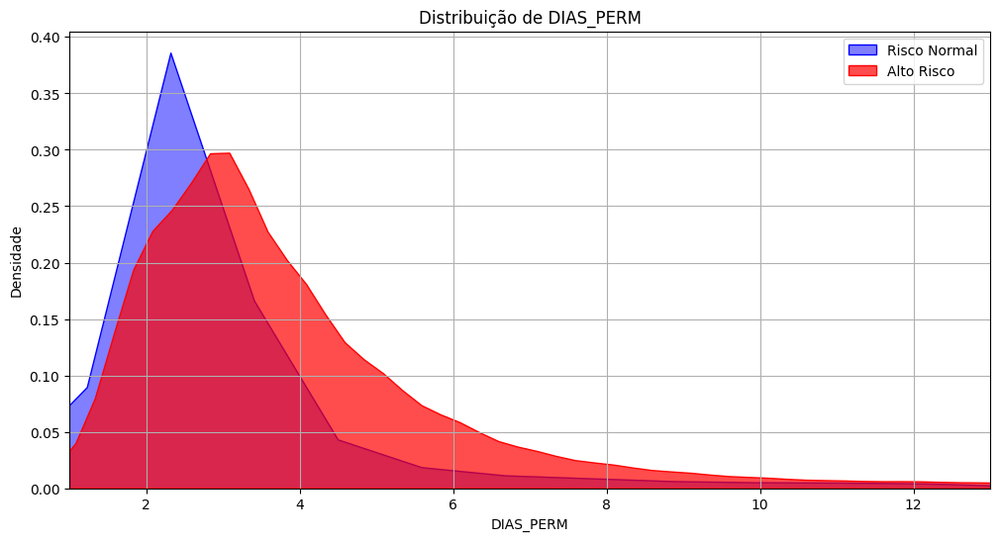

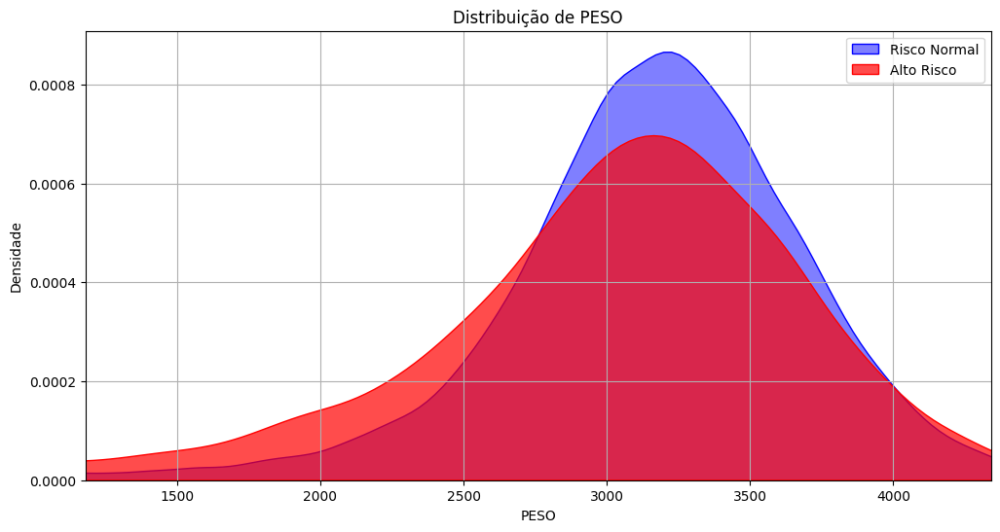

In [ ]:
print("Visualizações de Distribuição (Sem Outliers Extremos)")

# Selecionar colunas numéricas contínuas ou com muitos valores
graph_kde_cols = ['DIAS_PERM', 'PESO']

for col in graph_kde_cols:
    plt.figure(figsize=(12, 6))

    # Plota a curva de Risco Normal
    sns.kdeplot(data=df_risco_normal, x=col, label='Risco Normal', fill=True, color='blue', alpha=0.5)
    sns.kdeplot(data=df_alto_risco, x=col, label='Alto Risco', fill=True, color='red', alpha=0.7)

    # Retirada de outliers extremos do gráfico
    if df[col].nunique() > 1:
        q1 = df[col].quantile(0.01)
        q99 = df[col].quantile(0.99)
        if q1 < q99:
            plt.xlim(q1, q99)

    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Densidade')
    plt.legend()
    plt.grid(True)
    plt.show()

#### **B)** Histogramas

Visualizações de Distribuição (Histogramas)


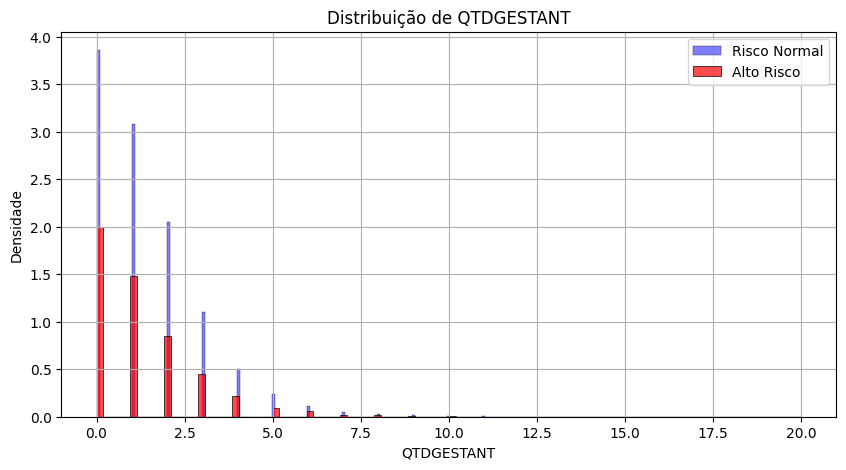

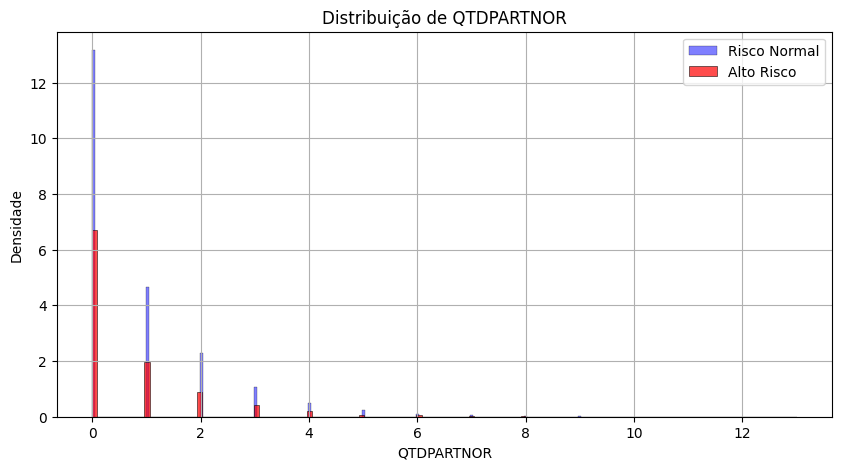

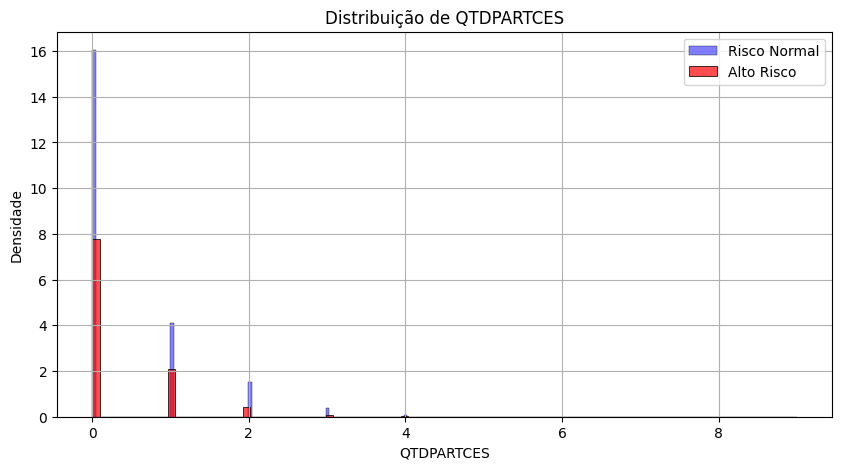

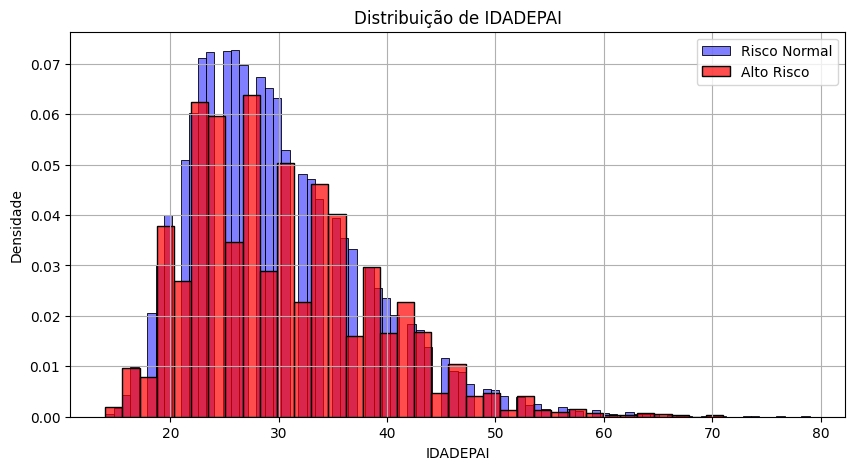

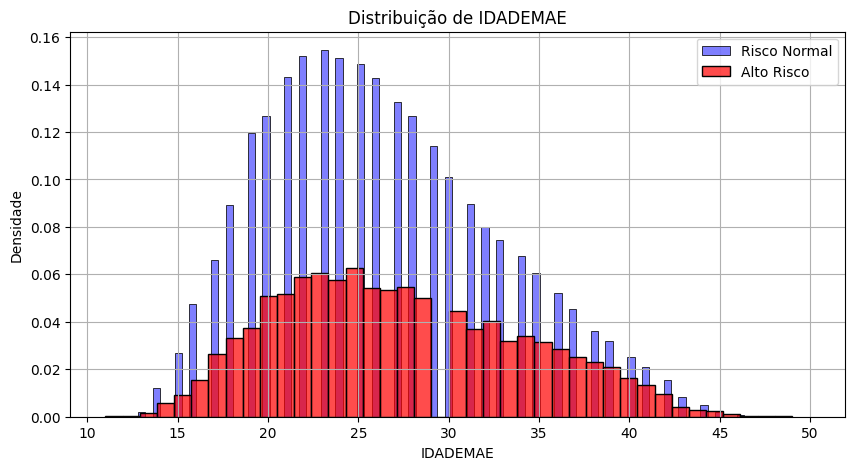

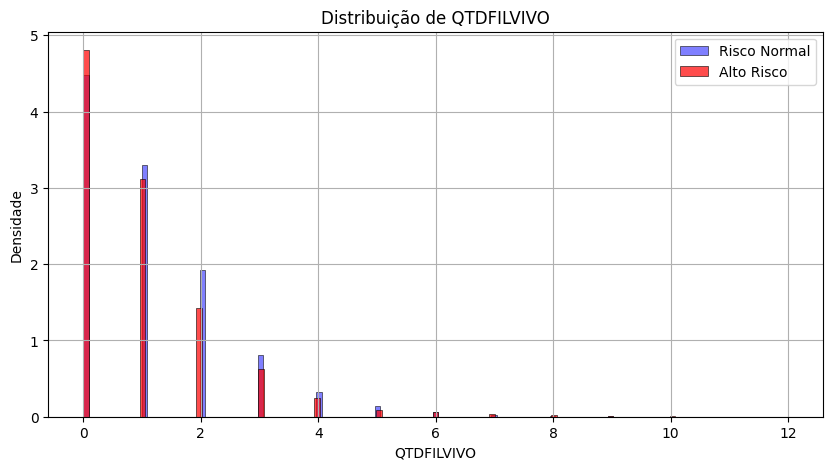

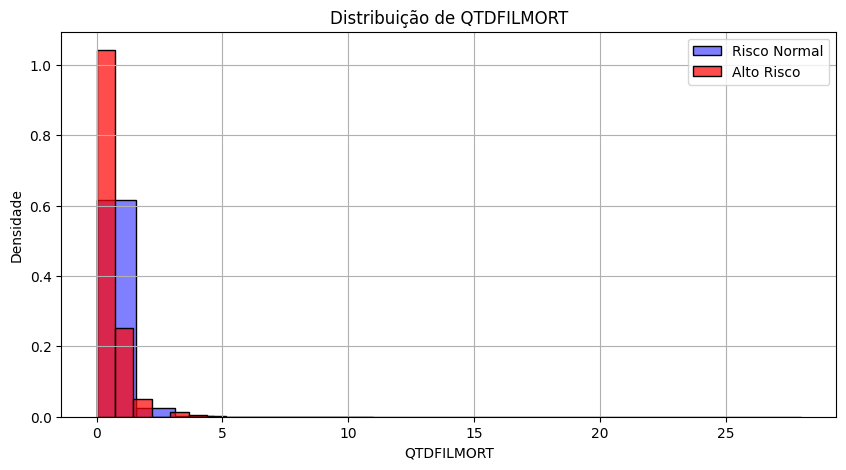

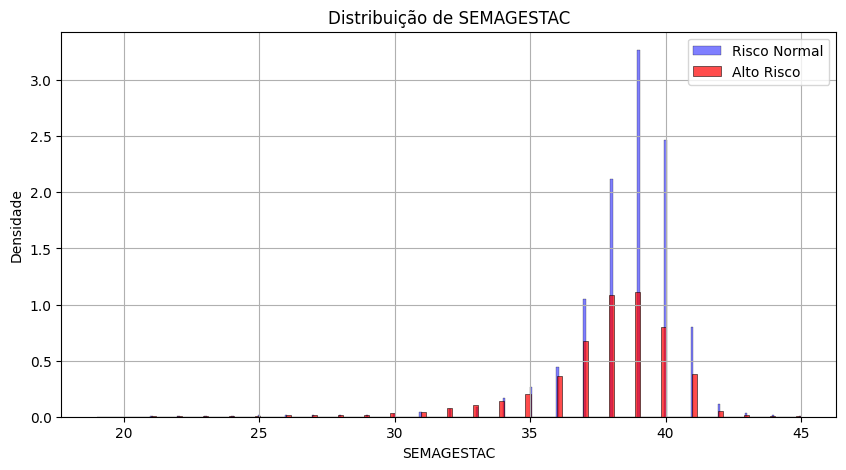

In [ ]:
print("Visualizações de Distribuição (Histogramas)")

# Selecionar colunas numéricas discretas com poucos valores
graph_hist_cols = [
    'QTDGESTANT', 'QTDPARTNOR', 'QTDPARTCES', 'IDADEPAI',
    'IDADEMAE', 'QTDFILVIVO', 'QTDFILMORT', 'SEMAGESTAC'
    ]

for col in graph_hist_cols:
    plt.figure(figsize=(10, 5))

    # Plota histogramas para Risco Normal e Alto Risco
    sns.histplot(data=df_risco_normal, x=col, label='Risco Normal', color='blue', alpha=0.5, kde=False, stat="density", common_norm=False)
    sns.histplot(data=df_alto_risco, x=col, label='Alto Risco', color='red', alpha=0.7, kde=False, stat="density", common_norm=False)

    plt.title(f'Distribuição de {col}')
    plt.xlabel(col)
    plt.ylabel('Densidade')
    plt.legend()
    plt.grid(True)
    plt.show()

#### **C)** Boxplots

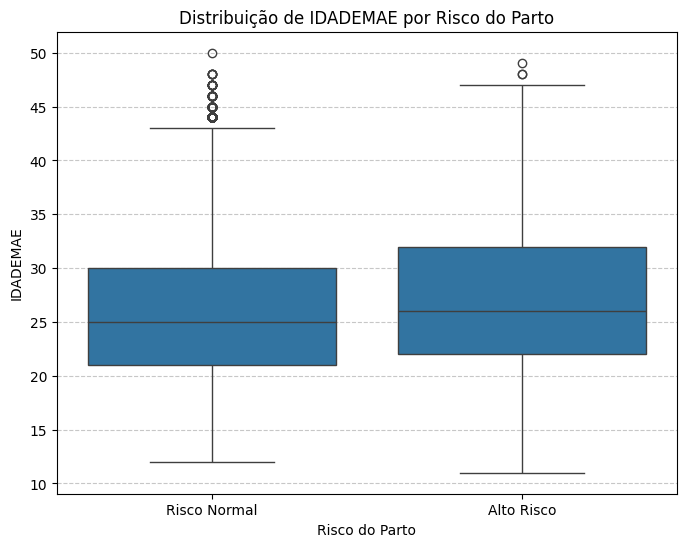

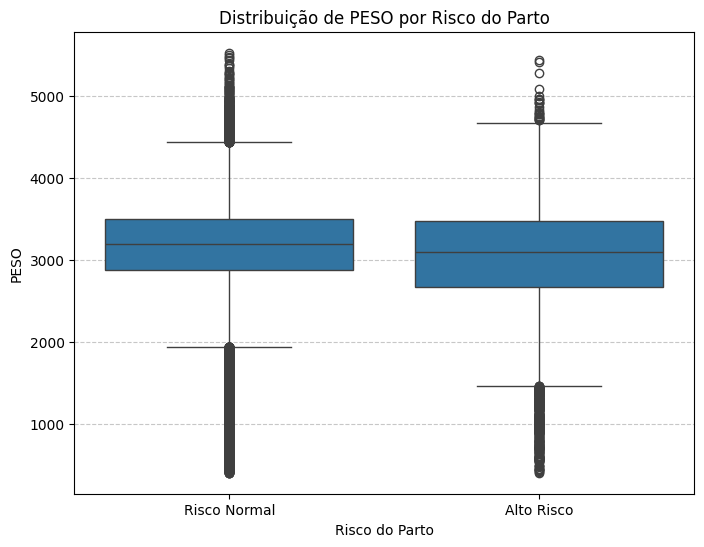

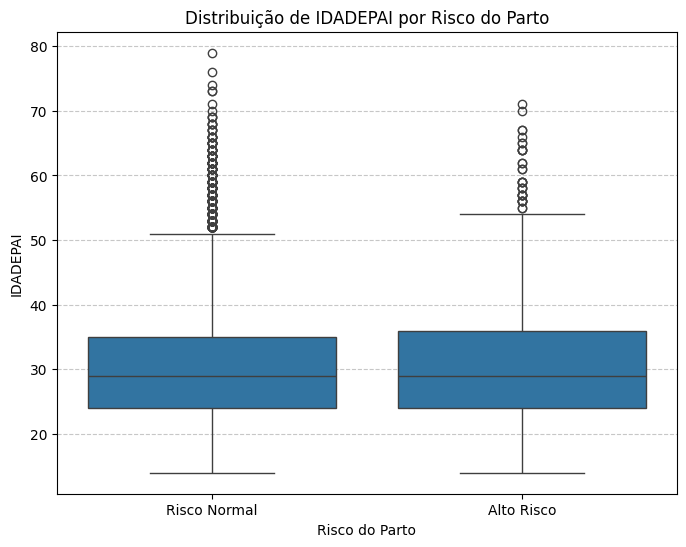

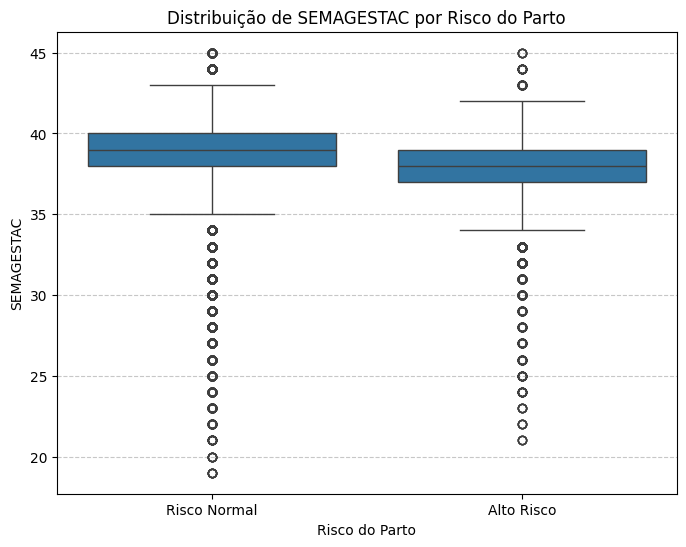

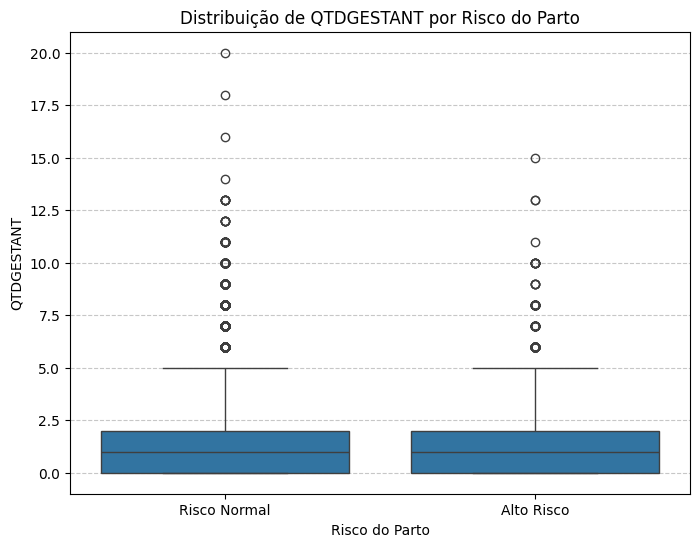

In [ ]:
# Lista de colunas para o boxplot
colunas_para_boxplot = ['IDADEMAE', 'PESO', 'IDADEPAI', 'SEMAGESTAC', 'QTDGESTANT']

for col in colunas_para_boxplot:
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df, x='PARTO_ALTO_RISCO', y=col)
    plt.title(f'Distribuição de {col} por Risco do Parto')
    plt.xlabel('Risco do Parto')
    plt.xticks([0, 1], ['Risco Normal', 'Alto Risco'])
    plt.ylabel(col)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

### 7.5) Análise de Correlação

Figura 'correlation_heatmap.png' salvo em data/outputs/figs


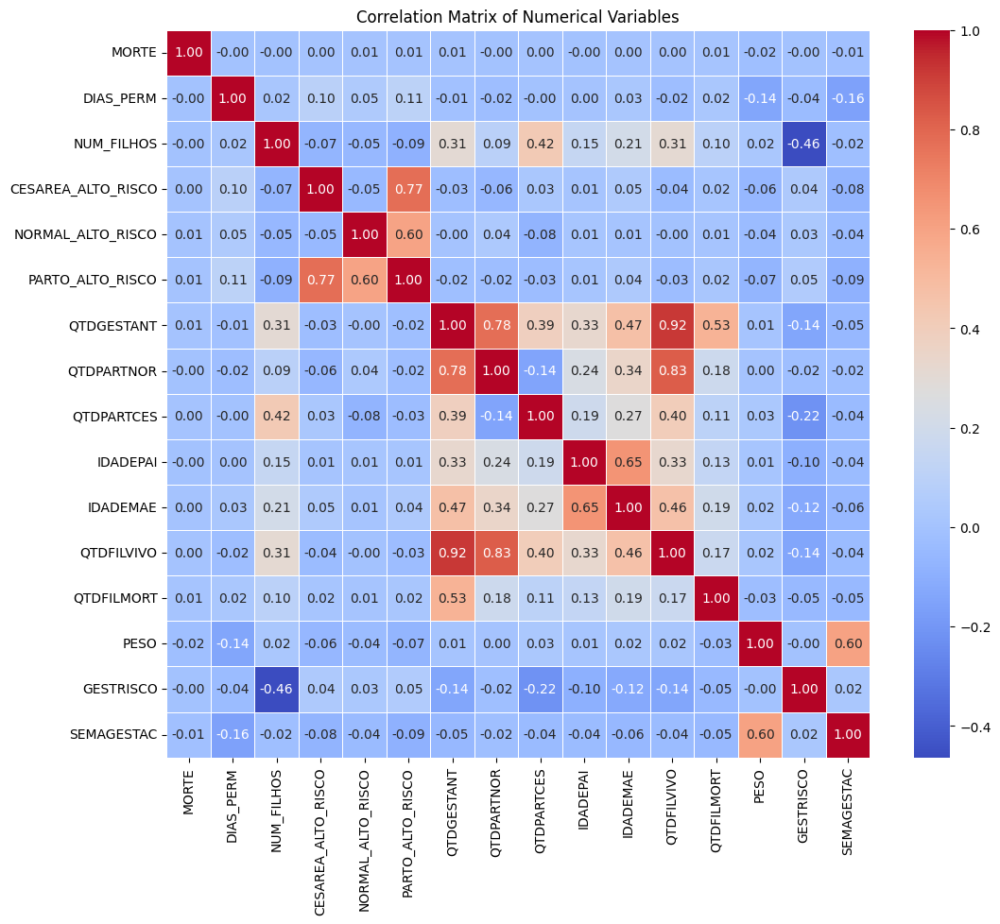

In [ ]:
# Calcular a matriz de correlação
correlation_matrix = df[numeric_cols].corr()

# Plotar o mapa de calor
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Numerical Variables')

save_file(plt.gcf(), 'correlation_heatmap', 'png', 'data/outputs/figs')
plt.show()

### 7.6) Gráficos de Dispersão

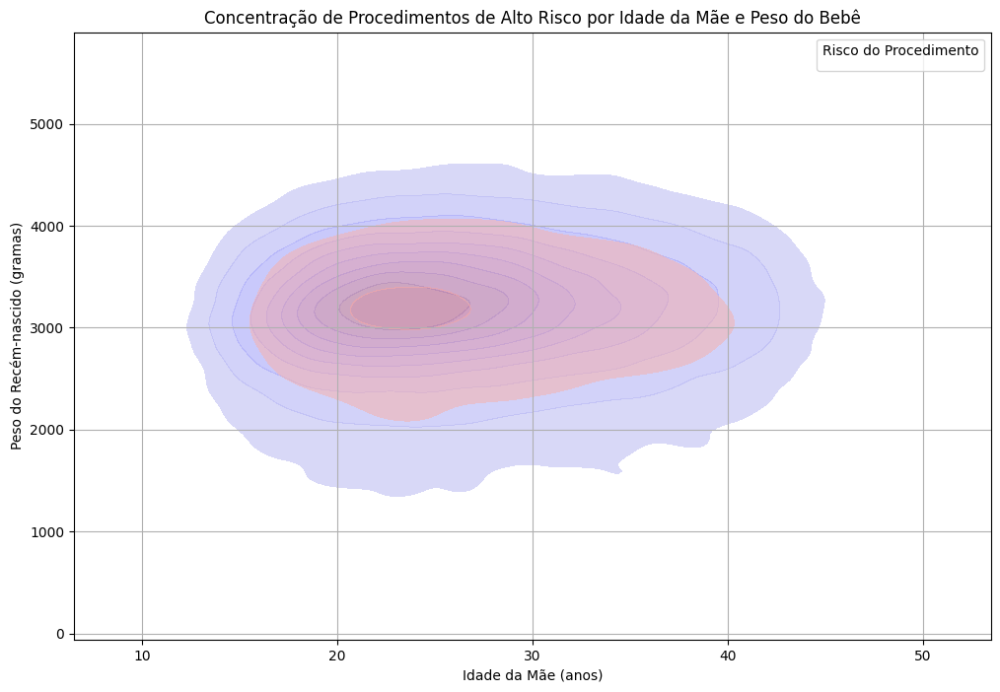

In [ ]:
plt.figure(figsize=(12, 8))
sns.kdeplot(data=df, x='IDADEMAE', y='PESO', hue='PARTO_ALTO_RISCO',
            fill=True, alpha=0.6, palette=['blue', 'red'])
plt.title('Concentração de Procedimentos de Alto Risco por Idade da Mãe e Peso do Bebê')
plt.xlabel('Idade da Mãe (anos)')
plt.ylabel('Peso do Recém-nascido (gramas)')
plt.legend(title='Risco do Procedimento', labels=['Alto Risco', 'Risco Normal'])
plt.grid(True)
plt.show()

### 7.7) Análise de Dados Categóricos

#### **A)** Comparativo de Complicação em Cesáreas

In [ ]:
print("\nRisco Relativo: Probabilidade de Procedimento de Alto Risco por Tipo de Parto")
risco_por_parto = pd.crosstab(df['PARTO'], df['PARTO_ALTO_RISCO'], normalize='index') * 100
risco_por_parto.rename(columns={0: 'Risco Normal (%)', 1: 'Alto Risco (%)'}, inplace=True)

risco_por_parto.rename(index={1: 'Parto Normal', 2: 'Parto Cesáreo'}, inplace=True)

display(risco_por_parto.round(2))


Risco Relativo: Probabilidade de Procedimento de Alto Risco por Tipo de Parto


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
PARTO,,
1,93.04,6.96
2,88.22,11.78


#### **B)** Análise Grupo Robson

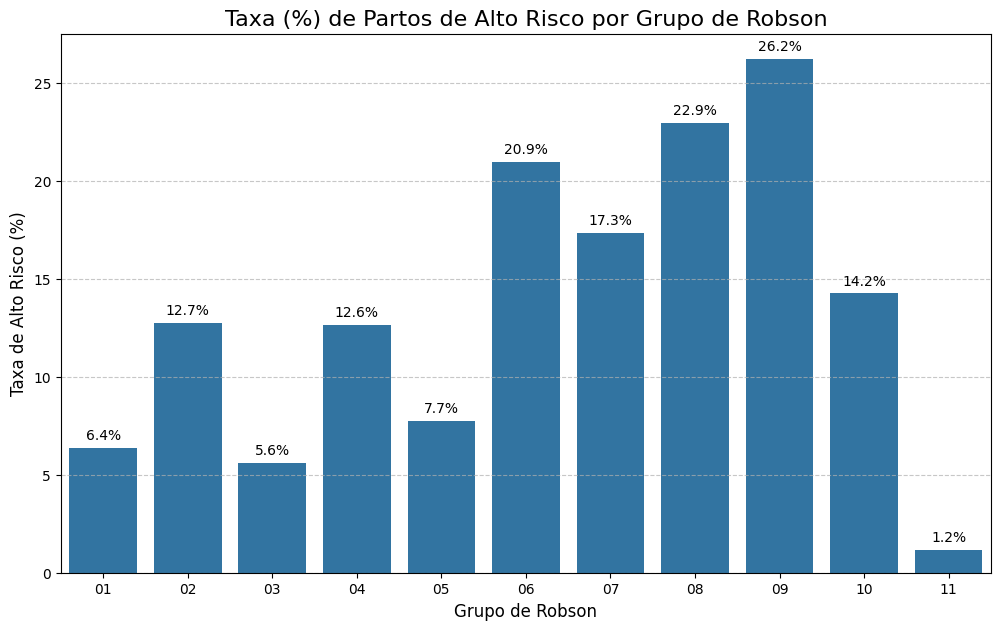

In [ ]:
"""
Porcentagem de Risco por Grupo Robson
"""

# Calcula a taxa de alto risco para cada grupo Robson
taxa_risco_por_robson = df.groupby('TPROBSON')['PARTO_ALTO_RISCO'].mean() * 100

# Ordena os grupos para uma visualização lógica
taxa_risco_por_robson = taxa_risco_por_robson.sort_index()

# Cria o gráfico de barras
plt.figure(figsize=(12, 7))
ax = sns.barplot(x=taxa_risco_por_robson.index, y=taxa_risco_por_robson.values)

plt.title('Taxa (%) de Partos de Alto Risco por Grupo de Robson', fontsize=16)
plt.xlabel('Grupo de Robson', fontsize=12)
plt.ylabel('Taxa de Alto Risco (%)', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adiciona os valores em cima das barras para clareza
for p in ax.patches:
    ax.annotate(f'{p.get_height():.1f}%',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.show()

Contagem das novas colunas de categoria de parto:


,0
Normal_Padrão,44946
Normal_Alto_Risco,3362
Cesarea_Padrão,41368
Cesarea_Alto_Risco,5523


Figura 'robson_analysis.png' salvo em data/outputs/figs


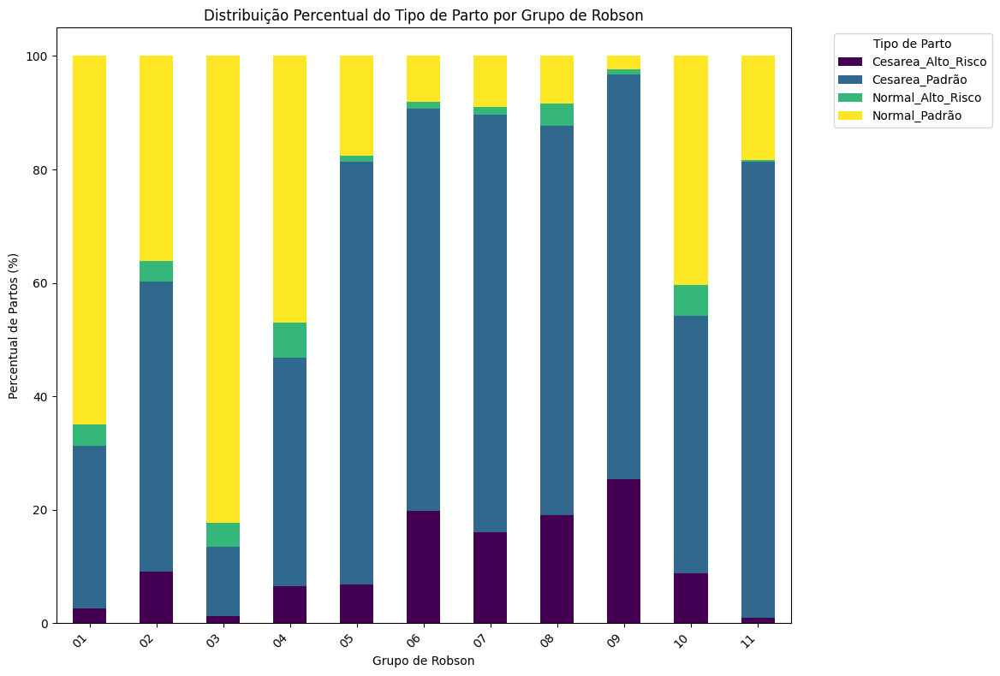

In [ ]:
"""
Risco por tipo de parto em Grupos Robson
"""

# Criar colunas para as quatro categorias de parto sem usar TIPO_PARTO
df['Normal_Padrão'] = ((df['PARTO'] == '1') & (df['NORMAL_ALTO_RISCO'] == 0)).astype(int)
df['Normal_Alto_Risco'] = ((df['PARTO'] == '1') & (df['NORMAL_ALTO_RISCO'] == 1)).astype(int)
df['Cesarea_Padrão'] = ((df['PARTO'] == '2') & (df['CESAREA_ALTO_RISCO'] == 0)).astype(int)
df['Cesarea_Alto_Risco'] = ((df['PARTO'] == '2') & (df['CESAREA_ALTO_RISCO'] == 1)).astype(int)

# Verificar se as novas colunas foram criadas corretamente
print("Contagem das novas colunas de categoria de parto:")
display(df[['Normal_Padrão', 'Normal_Alto_Risco', 'Cesarea_Padrão', 'Cesarea_Alto_Risco']].sum())

# Criar a tabela cruzada usando as novas colunas
tabela_robson = df.groupby('TPROBSON')[['Normal_Padrão', 'Normal_Alto_Risco', 'Cesarea_Padrão', 'Cesarea_Alto_Risco']].sum()
# Normalizar por linha para obter percentuais
tabela_robson_percent = tabela_robson.div(tabela_robson.sum(axis=1), axis=0) * 100

# Reordenar as colunas para controlar a ordem das barras empilhadas
ordem_colunas = ['Cesarea_Alto_Risco', 'Cesarea_Padrão', 'Normal_Alto_Risco', 'Normal_Padrão']
tabela_robson_percent = tabela_robson_percent[ordem_colunas]

tabela_robson_percent.plot(kind='bar', stacked=True, figsize=(14, 8), colormap='viridis')
plt.title('Distribuição Percentual do Tipo de Parto por Grupo de Robson')
plt.xlabel('Grupo de Robson')
plt.ylabel('Percentual de Partos (%)')
plt.legend(title='Tipo de Parto', bbox_to_anchor=(1.05, 1), loc='upper left') # Ajusta posição da legenda
plt.xticks(rotation=45, ha='right')
plt.tight_layout(rect=[0, 0, 0.85, 1])

save_file(plt.gcf(), 'robson_analysis', 'png', 'data/outputs/figs')
plt.show()

#### **C)** Hospitais de Maior Risco

Dados em 87 hospitais únicos.
Hospitais com mais de 50 partos de baixo risco: 74 hospitais.

Top hospitais com maior taxa de risco para pacientes de 'Baixo Risco':
   ID_ESTABELECIMENTO  total_partos  taxa_alto_risco
67            2708353           365        96.986301
17            2269945          2235        56.912752
19            2270021           692        55.924855
62            2298317          2219        35.105904
22            2270609          3047        33.639646
23            2270714          1940        32.938144
34            2280248          1812        24.006623
27            2273748           201         6.467662
56            2295407          1701         1.704879
50            2288907           497         1.609658




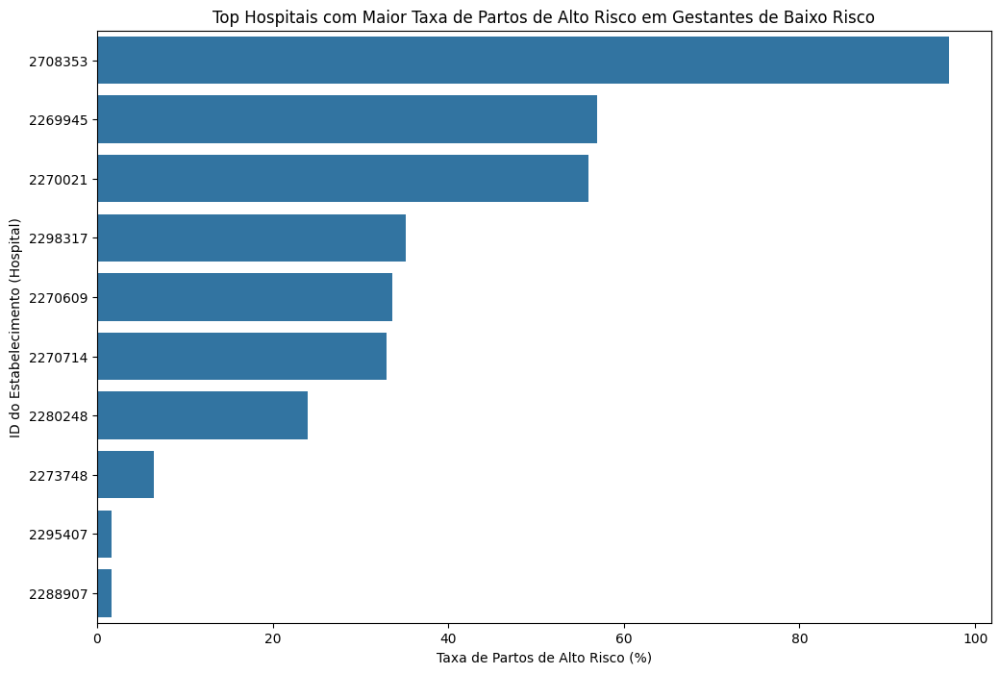

In [ ]:
"""
Análise dos hospitais em que há uma gestante de baixo risco clínico,
porém onde o procedimento se desenvolveu em alto risco.
"""

df_escopo = df[df['RISCO_ROBSON'] == 'Baixo Risco'].copy() # Baixo risco

# Agrupar hospitais para contar o total de partos e os de alto risco
analise_hospital = df_escopo.groupby('ID_ESTABELECIMENTO')['PARTO_ALTO_RISCO'].agg(['count', 'sum']).reset_index()
analise_hospital.rename(columns={'count': 'total_partos', 'sum': 'partos_alto_risco'}, inplace=True)
print(f"Dados em {analise_hospital.shape[0]} hospitais únicos.")

# Filtrar mínimo de partos de baixo risco
volume_minimo = 50
analise_hospital_relevante = analise_hospital[analise_hospital['total_partos'] > volume_minimo].copy()
print(f"Hospitais com mais de {volume_minimo} partos de baixo risco: {analise_hospital_relevante.shape[0]} hospitais.")

# Calcular a taxa de risco
analise_hospital_relevante['taxa_alto_risco'] = (analise_hospital_relevante['partos_alto_risco'] / analise_hospital_relevante['total_partos']) * 100

# Selecionar os 10 hospitais com maior taxa de risco.
top_hospitais = analise_hospital_relevante.sort_values(by='taxa_alto_risco', ascending=False).head(10)

print("\nTop hospitais com maior taxa de risco para pacientes de 'Baixo Risco':")
print(top_hospitais[['ID_ESTABELECIMENTO', 'total_partos', 'taxa_alto_risco']])
print('\n')

# Plotar o gráfico
plt.figure(figsize=(12, 8))
top_hospitais['ID_ESTABELECIMENTO'] = top_hospitais['ID_ESTABELECIMENTO'].astype(str)

sns.barplot(data=top_hospitais, x='taxa_alto_risco', y='ID_ESTABELECIMENTO', orient='h')
plt.title(f'Top Hospitais com Maior Taxa de Partos de Alto Risco em Gestantes de Baixo Risco')
plt.xlabel('Taxa de Partos de Alto Risco (%)')
plt.ylabel('ID do Estabelecimento (Hospital)')
plt.show()

#### **D)** Análises de Desfecho

Tabela de Frequência Comparativa (% por categoria):


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
APGAR1,,
,97.71,2.29
00,84.00,16.00
01,76.82,23.18
02,78.85,21.15
03,82.18,17.82
04,84.39,15.61
05,85.45,14.55
06,86.43,13.57
07,88.11,11.89


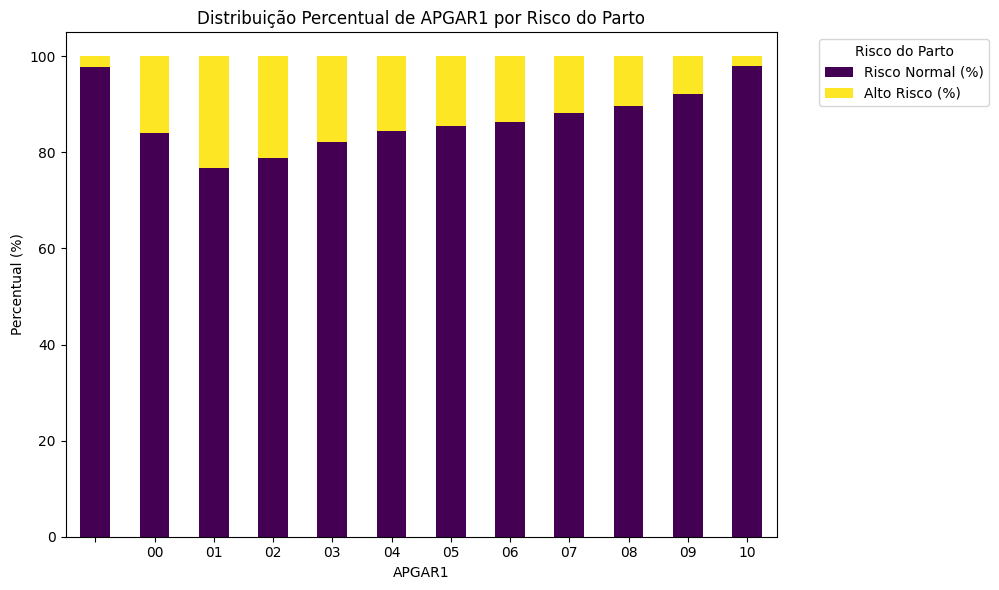

Tabela de Frequência Comparativa (% por categoria):


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
APGAR5,,
,97.67,2.33
00,80.85,19.15
01,80.28,19.72
02,82.43,17.57
03,78.31,21.69
04,71.90,28.10
05,80.00,20.00
06,84.79,15.21
07,85.60,14.40


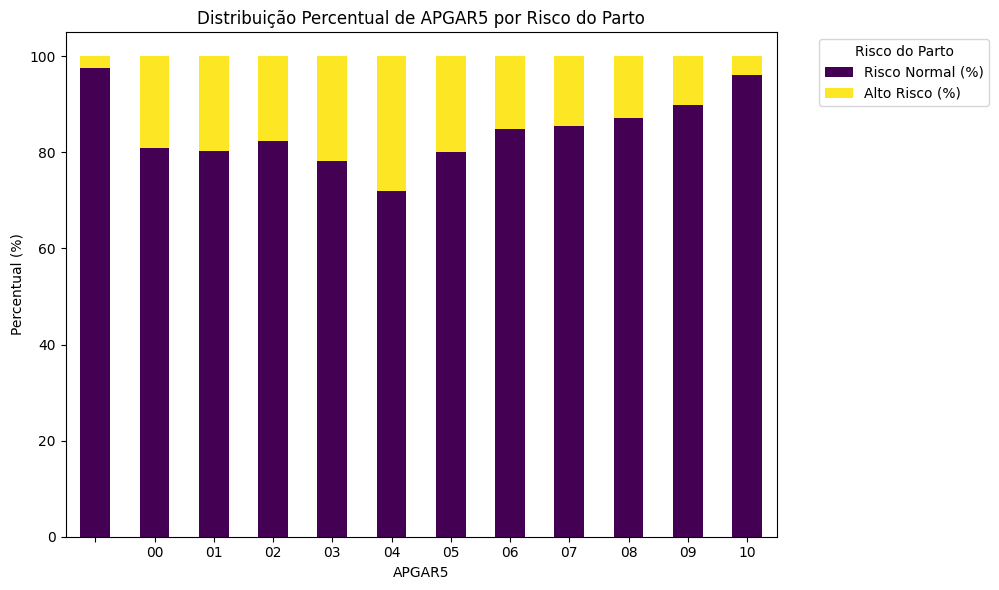

Tabela de Frequência Comparativa (% por categoria):


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
GESTACAO,,
1,88.57,11.43
2,83.25,16.75
3,80.24,19.76
4,84.05,15.95
5,91.61,8.39
6,90.67,9.33


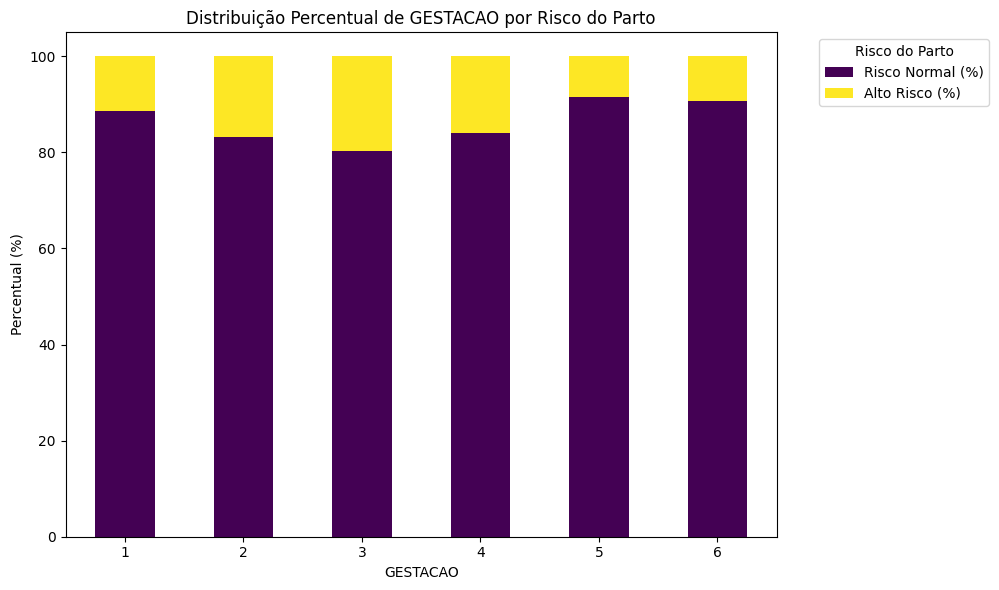

In [ ]:
# Variáveis de resultado para análise comparativa
colunas_para_comparar = ['APGAR1', 'APGAR5', 'GESTACAO']

for col in colunas_para_comparar:
    # Para variáveis ordinais/categóricas como APGAR: Tabela de Frequência Cruzada (em %) e Gráfico de Barras Empilhadas
    tabela_cruzada = pd.crosstab(df[col], df['PARTO_ALTO_RISCO'], normalize='index') * 100
    tabela_cruzada.rename(columns={0: 'Risco Normal (%)', 1: 'Alto Risco (%)'}, inplace=True)
    print("Tabela de Frequência Comparativa (% por categoria):")
    display(tabela_cruzada.round(2))

    # Gráfico de barras empilhadas
    tabela_cruzada.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
    plt.title(f'Distribuição Percentual de {col} por Risco do Parto')
    plt.xlabel(col)
    plt.ylabel('Percentual (%)')
    # Adjust legend position and use tight_layout
    plt.legend(title='Risco do Parto', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.xticks(rotation=0)
    plt.tight_layout(rect=[0, 0, 0.85, 1]) # Adjust rect to make space for the legend
    plt.show()

#### **E)** Possíveis Variáveis de Alto Impacto

In [ ]:
colunas_preditivas_adicionais = [
    'GESTRISCO',  # A gestação JÁ FOI classificada como de risco no pré-natal?
    'GRAVIDEZ',   # Tipo de gravidez (Única, Dupla, etc.)
    'LOCNASC',    # Onde ocorreu o nascimento (1: Hospital; 2: Outro estabelecimento de saúde)
    'ESTCIVMAE',  # Estado civil da mãe (um forte proxy socioeconômico)
    'TPNASCASSI'  # Tipo de assistência ao parto (Médico, Enfermeira, Parteira)
]

for coluna in colunas_preditivas_adicionais:
  df_comparativo = pd.crosstab(df[coluna], df['PARTO_ALTO_RISCO'], normalize='index') * 100
  df_comparativo.rename(columns={0: 'Risco Normal (%)', 1: 'Alto Risco (%)'}, inplace=True)
  display(df_comparativo.round(2))

PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
GESTRISCO,,
0,100.00,0.00
1,90.42,9.58


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
GRAVIDEZ,,
,94.74,5.26
1,90.97,9.03
2,76.87,23.13
3,66.67,33.33


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
LOCNASC,,
1,90.66,9.34
2,98.10,1.90


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
ESTCIVMAE,,
,91.12,8.88
1,90.43,9.57
2,91.36,8.64
3,94.74,5.26
4,91.84,8.16
5,91.73,8.27
9,97.04,2.96


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
TPNASCASSI,,
,91.43,8.57
1,89.51,10.49
2,97.97,2.03
3,96.97,3.03
4,90.48,9.52
9,100.00,0.00


#### **F)** Outras Variáveis Categóricas

In [ ]:
# Lista de colunas categóricas ampliada
colunas_categoricas = [
    'RACACORMAE', 'ESCMAE2010', 'TPAPRESENT', 'IDANOMAL', 'GESTACAO',
    'STTRABPART', 'CONSPRENAT', 'MESPRENAT', 'KOTELCHUCK', 'CAR_INT',
]

for coluna in colunas_categoricas:
  df_comparativo = pd.crosstab(df[coluna], df['PARTO_ALTO_RISCO'], normalize='index') * 100
  df_comparativo.rename(columns={0: 'Risco Normal (%)', 1: 'Alto Risco (%)'}, inplace=True)
  display(df_comparativo.round(2))

PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
RACACORMAE,,
,91.99,8.01
1,90.15,9.85
2,90.29,9.71
3,88.30,11.70
4,91.03,8.97
5,95.00,5.00


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
ESCMAE2010,,
,98.08,1.92
0,88.28,11.72
1,91.65,8.35
2,90.76,9.24
3,90.70,9.30
4,89.84,10.16
5,89.42,10.58
9,90.95,9.05


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
TPAPRESENT,,
,87.50,12.50
1,90.99,9.01
2,79.58,20.42
3,73.81,26.19
9,99.87,0.13


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
IDANOMAL,,
,97.83,2.17
1,78.35,21.65
2,90.54,9.46
9,99.76,0.24


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
GESTACAO,,
1,88.57,11.43
2,83.25,16.75
3,80.24,19.76
4,84.05,15.95
5,91.61,8.39
6,90.67,9.33


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
STTRABPART,,
,87.86,12.14
1,87.37,12.63
2,91.19,8.81
9,96.93,3.07


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
CONSPRENAT,,
,98.82,1.18
00,86.18,13.82
01,93.84,6.16
02,91.77,8.23
03,92.15,7.85
04,91.91,8.09
05,91.69,8.31
06,92.50,7.50
07,92.27,7.73


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
MESPRENAT,,
,95.37,4.63
01,93.37,6.63
02,89.43,10.57
03,89.82,10.18
04,90.35,9.65
05,91.05,8.95
06,90.74,9.26
07,91.50,8.50
08,91.10,8.90


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
KOTELCHUCK,,
1,86.18,13.82
2,90.85,9.15
3,92.47,7.53
4,92.81,7.19
5,90.28,9.72
9,91.53,8.47


PARTO_ALTO_RISCO,Risco Normal (%),Alto Risco (%)
CAR_INT,,
01,97.80,2.20
02,90.32,9.68


#### **G)** Análises de Tipos de Parto

In [ ]:
# Lista das novas variáveis para análise cruzada com o tipo de parto
variaveis_para_cruzar = [
    'TPAPRESENT', 'STTRABPART', 'IDANOMAL', 'KOTELCHUCK', 'CAR_INT',
    'TPROBSON'
    ]

for coluna in variaveis_para_cruzar:
    tabela_taxas = pd.crosstab(df[coluna], df['PARTO'], normalize='index') * 100

    # Renomeia as colunas para clareza (ajuste os números se o seu código for diferente)
    tabela_taxas.rename(columns={1: 'Normal (%)', 2: 'Cesárea (%)'}, inplace=True)

    display(tabela_taxas.round(2))
    print("\n")

PARTO,1,2
TPAPRESENT,,
,29.69,70.31
1,52.51,47.49
2,9.74,90.26
3,3.17,96.83
9,17.15,82.85


PARTO,1,2
STTRABPART,,
,61.43,38.57
1,67.33,32.67
2,47.36,52.64
9,42.39,57.61


PARTO,1,2
IDANOMAL,,
,53.62,46.38
1,38.67,61.33
2,51.14,48.86
9,37.31,62.69


PARTO,1,2
KOTELCHUCK,,
1,67.41,32.59
2,55.60,44.40
3,53.98,46.02
4,48.15,51.85
5,49.00,51.00
9,49.22,50.78


PARTO,1,2
CAR_INT,,
01,21.06,78.94
02,52.20,47.80


PARTO,1,2
TPROBSON,,
01,68.77,31.23
02,39.72,60.28
03,86.58,13.42
04,53.11,46.89
05,18.58,81.42
06,9.21,90.79
07,10.27,89.73
08,12.34,87.66
09,3.17,96.83


### 7.8) Análise Temporal

Figura 'temporal_analysis.png' salvo em data/outputs/figs


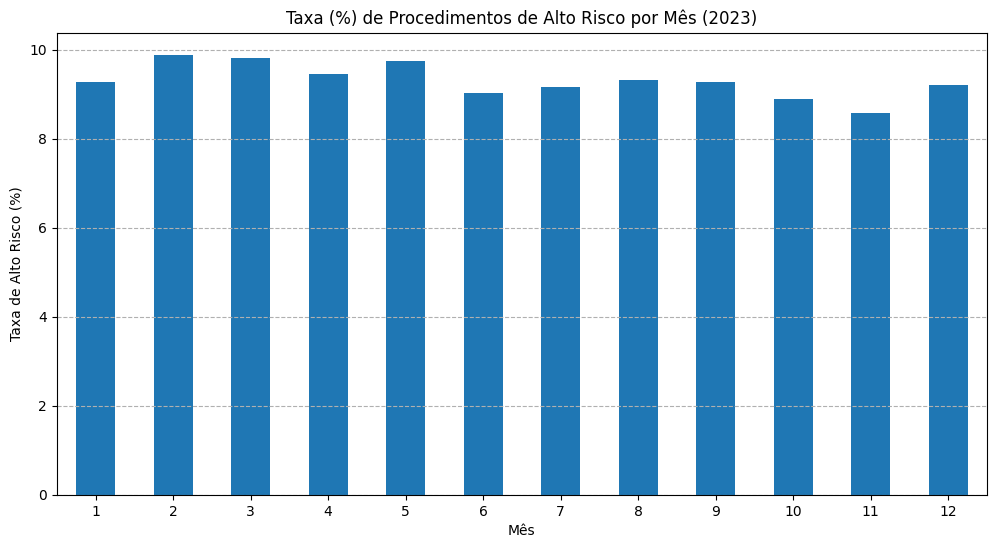

In [ ]:
df['MES_NASCIMENTO'] = pd.to_datetime(df['DT_NASC_BEBE']).dt.month
risco_por_mes = df.groupby('MES_NASCIMENTO')['PARTO_ALTO_RISCO'].mean() * 100

plt.figure(figsize=(12, 6))
risco_por_mes.plot(kind='bar')
plt.title('Taxa (%) de Procedimentos de Alto Risco por Mês (2023)')
plt.xlabel('Mês')
plt.ylabel('Taxa de Alto Risco (%)')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--')

save_file(plt.gcf(), 'temporal_analysis', 'png', 'data/outputs/figs')
plt.show()

### 7.9) Análise Geoespacial

#### **A)** Extração do Mapa Zippado

In [ ]:
source = "rj_municipios"
extract_zip(source) # Extração dos arquivos ZIP

Procurando por arquivos ZIP com 'RJ_MUNICIPIOS.zip' em data/raw...
Extraído 2024_RJ_MUNICIPIOS.zip para data/reference/mapa_rj_municipios


#### **B)** Mapa Interativo

In [ ]:
try:
    # Pegar arquivo dos municípios do RJ
    caminho_mapa = 'data/reference/mapa_rj_municipios/RJ_Municipios_2024.shp'
    mapa_rj = gpd.read_file(caminho_mapa)

    dados_geo = df.groupby('MUNIC_RES')['PARTO_ALTO_RISCO'].agg(
        Taxa_Alto_Risco='mean',
        Total_Partos='size'
    ).reset_index()
    dados_geo['Taxa_Alto_Risco'] *= 100

    # Padronização das chaves de junção (ambas como string, 6 dígitos)
    mapa_rj['chave_merge'] = mapa_rj['CD_MUN'].astype(str).str[:6]
    dados_geo['MUNIC_RES'] = dados_geo['MUNIC_RES'].astype(str)

    mapa_com_dados = mapa_rj.merge(dados_geo, left_on='chave_merge', right_on='MUNIC_RES')

    if len(mapa_com_dados) > 0:
        print(f"SUCESSO: A junção encontrou {len(mapa_com_dados)} municípios em comum. Gerando mapa interativo...")

        fig = px.choropleth_map(
            mapa_com_dados,
            geojson=mapa_com_dados.geometry,
            locations=mapa_com_dados.index, # Usa o índice do GeoDataFrame
            color="Taxa_Alto_Risco",
            hover_name="NM_MUN", # Coluna com o nome do município para mostrar no hover
            hover_data={ # Informações extras que aparecerão no hover
                "Taxa_Alto_Risco": ":.2f%",
                "Total_Partos": True
            },
            map_style="carto-positron", # Estilo do mapa de fundo
            center={"lat": -22.4, "lon": -42.8}, # Centraliza o mapa no RJ
            zoom=6,
            opacity=0.6,
            labels={'Taxa_Alto_Risco': 'Taxa de Alto Risco (%)'}
        )

        fig.update_layout(
            margin={"r":0,"t":0,"l":0,"b":0},
            title_text='Taxa (%) de Partos de Alto Risco por Município de Residência no RJ',
            title_x=0.5
        )
        fig.show()

        # Salvamento do mapa
        output_dir_figs = "data/outputs/figs"
        filepath = os.path.join(output_dir_figs, 'mapa_risco_por_municipio.png')

        try:
            fig.write_image(filepath)
            print(f"\nMapa salvo como PNG em: {filepath}")
        except ImportError:
            print("\nAviso: A biblioteca 'kaleido' é necessária para salvar figuras Plotly como imagem estática.")
            print("Por favor, instale-a rodando: !pip install kaleido")
        except Exception as e:
            print(f"\nOcorreu um erro ao salvar o mapa como imagem: {e}")


    else:
        print("\nERRO CRÍTICO: A junção ('merge') falhou. Nenhum município em comum foi encontrado.")

except Exception as e:
    print(f"Ocorreu um erro: {e}. Certifique-se de ter as bibliotecas 'geopandas' e 'plotly' instaladas.")

SUCESSO: A junção encontrou 90 municípios em comum. Gerando mapa interativo...



Ocorreu um erro ao salvar o mapa como imagem: It seems like you are running a slim version of your operating system and are missing some common dependencies. The following command should install the required dependencies on most systems:

$ sudo apt update && sudo apt-get install libnss3 libatk-bridge2.0-0 libcups2 libxcomposite1 libxdamage1 libxfixes3 libxrandr2 libgbm1 libxkbcommon0 libpango-1.0-0 libcairo2 libasound2

If you have already run the above command and are still seeing this error, or the above command fails, consult the Kaleido documentation for operating system to install chromium dependencies.

For support, run the command `choreo_diagnose` and create an issue with its output.


#### **C)** Verificação de Municípios Ausentes

In [ ]:
print("Verificando quais municípios do Rio de Janeiro ficaram de fora do mapa...")

# 1. Pega a lista de TODOS os municípios do mapa original do RJ
# (A coluna com o nome do município no seu shapefile provavelmente se chama 'NM_MUN')
todos_municipios_mapa = set(mapa_rj['NM_MUN'])

# 2. Pega a lista de municípios que foram plotados (que tinham dados)
municipios_com_dados = set(mapa_com_dados['NM_MUN'])

# 3. Compara as duas listas para encontrar os que estão no mapa, mas não tinham dados
municipios_faltantes = todos_municipios_mapa - municipios_com_dados

if municipios_faltantes:
    print(f"\nForam encontrados {len(municipios_faltantes)} municípios que não tinham dados de nascimentos no seu DataFrame:")
    for i, municipio in enumerate(sorted(list(municipios_faltantes))):
        print(f"{i+1}. {municipio}")

    print("\nMotivo provável: Não houve registros de nascimentos em 2023 com mães residentes nesses municípios no seu conjunto de dados.")
else:
    print("\nTodos os municípios do mapa do Rio de Janeiro foram encontrados nos dados.")

Verificando quais municípios do Rio de Janeiro ficaram de fora do mapa...

Foram encontrados 2 municípios que não tinham dados de nascimentos no seu DataFrame:
1. Italva
2. Santa Maria Madalena

Motivo provável: Não houve registros de nascimentos em 2023 com mães residentes nesses municípios no seu conjunto de dados.


### 7.10) Insights

- Todos os partos de alto risco possuem 0 filhos em NUM_FILHOS. Acaba por ser uma constatação sem muita justificativa, mas de relevância;
- Todo procedimento de alto risco foi classificado como GESTRISCO = 1, ou seja, nosso target é um subconjunto de GESTRISCO = 1. Com isso, podemos enxugar nosso dataframe;
- O hospital de CNES 2708353, que possui cerca de 97% de partos de alto risco, é o IFF FIOCRUZ. Ele é especializado em partos de alto risco. Gestantes são enviadas para lá em casos complicados, por isso a taxa elevadíssima;
- Partos cesarianos têm cerca de 1,7x mais chances de se desenvolverem em procedimentos e alto risco;
- Quanto maior a multiplicidade da gravidez (gêmeos, trigêmeos), maior o risco;
- A apresentação cefálica (TPAPRESENT = 1) é grande indicativo de baixo risco. Já as outras apresentações aumentam bastante o risco do procedimento;
- Existência de anomalia congênita mais que duplica as chances de ser um parto de alto risco;
- Internações de urgência possuem 4,4x mais chances de serem de alto risco;
- KOTELCHUCKS mais baixos possuem taxa de cesárias menores que os altos (apesar de o risco do parto diminuir). Isso é um grande indicativo de que cesárias são realizadas em cenários sem indicação clínica clara;
- Insight da classificação de Robson para baixo risco (intervenção).
- O perfil de um parto que se torna de alto risco é marcadamente diferente. As gestantes tendem a ser ligeiramente mais velhas, mas a diferença mais dramática está no peso do bebê, que é significativamente menor.
- Mesmo em grupos de baixo risco, as taxas de cesárea são altas, especialmente nos grupos 2 (60%) e 4 (47%), que envolvem uma decisão de induzir ou agendar o parto.
- O risco de complicação não é homogêneo. Ele é mínimo nos grupos de parto espontâneo (1 e 3), mas salta nos grupos de intervenção (2 e 4) e é altíssimo nos grupos com complicações clínicas claras (5 a 10).
- Mesmo quando o bebê está na posição ideal para um parto normal (apresentação Cefálica), a taxa de cesáreas é altíssima (47,5%).
- O gráfico mostra que a taxa de cesáreas é muito maior (52,6%) para quem não entrou em trabalho de parto, o que é esperado, pois inclui as cesáreas eletivas. O número mais interessante é o de 32.7%, que é a taxa de cesáreas intraparto, ou seja, decididas após o início do trabalho de parto, muitas vezes por complicações.
- Para mulheres de baixo risco, a decisão de intervir (Grupos 2 e 4) está associada a uma taxa de complicações (procedimento de alto risco) 2 a 3 vezes maior do que a das mulheres que iniciam o parto espontaneamente (Grupos 1 e 3).

## **8) Machine Learning**

**Conteúdo:**
*   Tratamento do Dataframe de Teste;
*   Comparativo de Métodos;
*   Ajuste dos Hiperparâmetros.

### 8.1) Preparação dos Dados

#### **A)** Seleção de Variáveis

In [ ]:
# Salvar DataFrame da análise exploratória
df_treino = df.copy()

# Filtrar o DataFrame de treino para incluir apenas gestações de alto risco (GESTRISCO == 1)
df_treino = df_treino[df_treino['GESTRISCO'] == 1].copy()

# DataFrames para o T-Learner
df_normal = df_treino[df_treino['PARTO'] == '1'].copy()
df_cesarea = df_treino[df_treino['PARTO'] == '2'].copy()

# Dicionários para os DataFrames de métricas
results_base = {}
results_smote = {}

# Dicionários para salvar os modelos e dados para análise
storage_data = {}              # Para salvar (X_train, X_test, y_train, y_test, preprocessor)
storage_pipelines_BASE = {}    # Para salvar os Modelos (Sem SMOTE)
storage_pipelines_SMOTE = {}   # Para salvar os Modelos (Com SMOTE)

# Remoção de nulos
# Código...

# Conversão para numérico
# Código...

#### **B)** Especificações dos Modelos

In [ ]:
cenarios = [
    ("Modelo Geral", df_treino, 'PARTO_ALTO_RISCO'),
    ("T-Learner Normal", df_normal, 'NORMAL_ALTO_RISCO'),
    ("T-Learner Cesarea", df_cesarea, 'CESAREA_ALTO_RISCO')
]

features = [
    'QTDGESTANT', 'QTDPARTNOR', 'QTDPARTCES', 'IDADEMAE',
    'QTDFILVIVO', 'QTDFILMORT', 'PESO', 'RACA_COR', 'GRAVIDEZ', 'ESCMAE2010',
    'CONSPRENAT', 'ESTCIVMAE', 'TPAPRESENT', 'PARIDADE', 'CAR_INT',
    'SEMAGESTAC', 'INSTRU', 'ESCMAEAGR1', 'GESTACAO', 'CONSULTAS',
    'IDANOMAL', 'KOTELCHUCK', 'SEXO', 'ID_ESTABELECIMENTO',
]

### 8.2) Comparação de Modelos

#### **A)** Modelos Ponderados

In [ ]:
for nome_cenario, df_cenario, target_cenario in cenarios:
    print(f"\n----- EXECUTANDO CENÁRIO (BASE): {nome_cenario} -----\n")

    # Prepara os dados
    dados_processados = prepare_pipeline(df_cenario, features, target_cenario, 0.3, 42)

    if dados_processados is None:
        print(f"Cenário '{nome_cenario}' pulado.")
        continue

    X_train, X_test, y_train, y_test, preprocessor = dados_processados
    storage_data[nome_cenario] = (X_train, X_test, y_train, y_test, preprocessor)

    df_resultados_base, pipelines_treinados = model_comparison(
        X_train, X_test, y_train, y_test, preprocessor, use_smote=False
    )

    results_base[nome_cenario] = df_resultados_base
    storage_pipelines_BASE[nome_cenario] = pipelines_treinados


----- EXECUTANDO CENÁRIO (BASE): Modelo Geral -----

Preparando dados para: PARTO_ALTO_RISCO
Shape de X_train: (64951, 24)
Shape de X_test: (27837, 24)

--- Treinando e Avaliando: Regressão Logística ---
Resultado para Regressão Logística: AUC=0.972, Recall=0.984, Precisão=0.485

--- Treinando e Avaliando: Random Forest ---
Resultado para Random Forest: AUC=0.968, Recall=0.549, Precisão=0.712

--- Treinando e Avaliando: XGBoost ---
Resultado para XGBoost: AUC=0.973, Recall=0.969, Precisão=0.504

--- Treinando e Avaliando: LightGBM ---
Resultado para LightGBM: AUC=0.973, Recall=0.976, Precisão=0.500

----- EXECUTANDO CENÁRIO (BASE): T-Learner Normal -----

Preparando dados para: NORMAL_ALTO_RISCO
Shape de X_train: (33815, 24)
Shape de X_test: (14493, 24)

--- Treinando e Avaliando: Regressão Logística ---
Resultado para Regressão Logística: AUC=0.959, Recall=0.986, Precisão=0.312

--- Treinando e Avaliando: Random Forest ---
Resultado para Random Forest: AUC=0.955, Recall=0.305, Precis

#### **B)** Modelos com SMOTE

In [ ]:
for nome_cenario, df_cenario, target_cenario in cenarios:
    print(f"\n----- EXECUTANDO CENÁRIO (SMOTE): {nome_cenario} -----\n")

    try:
        X_train, X_test, y_train, y_test, preprocessor = storage_data[nome_cenario]
    except KeyError:
        print(f"ERRO: Dados para o cenário '{nome_cenario}' não foram preparados. Pulando.")
        continue

    df_resultados_smote, pipelines_treinados_smote = model_comparison(
        X_train, X_test, y_train, y_test, preprocessor, use_smote=True
    )

    results_smote[nome_cenario] = df_resultados_smote
    storage_pipelines_SMOTE[nome_cenario] = pipelines_treinados_smote


----- EXECUTANDO CENÁRIO (SMOTE): Modelo Geral -----


--- Treinando e Avaliando: Regressão Logística ---
Resultado para Regressão Logística: AUC=0.971, Recall=0.979, Precisão=0.492

--- Treinando e Avaliando: Random Forest ---
Resultado para Random Forest: AUC=0.964, Recall=0.613, Precisão=0.662

--- Treinando e Avaliando: XGBoost ---
Resultado para XGBoost: AUC=0.972, Recall=0.973, Precisão=0.498

--- Treinando e Avaliando: LightGBM ---
Resultado para LightGBM: AUC=0.974, Recall=0.735, Precisão=0.657

----- EXECUTANDO CENÁRIO (SMOTE): T-Learner Normal -----


--- Treinando e Avaliando: Regressão Logística ---
Resultado para Regressão Logística: AUC=0.959, Recall=0.969, Precisão=0.324

--- Treinando e Avaliando: Random Forest ---
Resultado para Random Forest: AUC=0.953, Recall=0.396, Precisão=0.602

--- Treinando e Avaliando: XGBoost ---
Resultado para XGBoost: AUC=0.957, Recall=0.944, Precisão=0.348

--- Treinando e Avaliando: LightGBM ---
Resultado para LightGBM: AUC=0.960, Recall=

#### **C)** Análise dos Resultados

In [ ]:
for cenario_tuple in cenarios:
    # Pega o nome do cenário (o primeiro item do tuple)
    name = cenario_tuple[0]

    print(f"\n===== Cenário: {name} =====")

    # Get results for the current scenario from both dictionaries
    results_base_scenario = results_base.get(name)
    results_smote_scenario = results_smote.get(name)

    if results_base_scenario is not None and results_smote_scenario is not None:
        # Renomeia colunas para clareza
        results_base_renamed = results_base_scenario.rename(
            columns={'AUC': 'AUC (Base)', 'Recall (classe 1)': 'Recall (Base)', 'Precisão (classe 1)': 'Precisão (Base)'}
        ).set_index('Modelo')

        results_smote_renamed = results_smote_scenario.rename(
            columns={'AUC': 'AUC (SMOTE)', 'Recall (classe 1)': 'Recall (SMOTE)', 'Precisão (classe 1)': 'Precisão (SMOTE)'}
        ).set_index('Modelo')

        # Combina os DataFrames
        comparison_scenario_df = results_base_renamed.join(results_smote_renamed, how='outer')

        # Tenta reordenar colunas para melhor legibilidade
        try:
            ordered_cols = []
            # Usar 'AUC (Base)' etc. que são os nomes *depois* do rename
            for metric_base_name in ['AUC (Base)', 'Recall (Base)', 'Precisão (Base)']:
                metric_smote_name = metric_base_name.replace('Base', 'SMOTE')

                if metric_base_name in comparison_scenario_df.columns:
                    ordered_cols.append(metric_base_name)
                if metric_smote_name in comparison_scenario_df.columns:
                    ordered_cols.append(metric_smote_name)

            comparison_final_df = comparison_scenario_df[ordered_cols]
        except KeyError:
            # Se falhar, apenas usa o DF concatenado
            print("Aviso: Falha ao reordenar colunas, exibindo na ordem padrão.")
            comparison_final_df = comparison_scenario_df

        # Exibe a tabela de comparação
        display(comparison_final_df.sort_values(by='AUC (Base)', ascending=False))

    else:
        print(f"Não foi possível encontrar resultados para o cenário '{name}' em um ou ambos os dicionários.")


===== Cenário: Modelo Geral =====


,AUC (Base),AUC (SMOTE),Recall (Base),Recall (SMOTE),Precisão (Base),Precisão (SMOTE)
Modelo,,,,,,
LightGBM,0.973424,0.973639,0.975994,0.734809,0.500096,0.657383
XGBoost,0.972660,0.971655,0.968867,0.972993,0.504000,0.497698
Regressão Logística,0.971515,0.970898,0.983871,0.978995,0.485202,0.492360
Random Forest,0.967954,0.964124,0.549137,0.612903,0.712409,0.661806



===== Cenário: T-Learner Normal =====


,AUC (Base),AUC (SMOTE),Recall (Base),Recall (SMOTE),Precisão (Base),Precisão (SMOTE)
Modelo,,,,,,
Regressão Logística,0.959212,0.959049,0.986125,0.969277,0.312402,0.324271
LightGBM,0.959140,0.959857,0.934589,0.509415,0.355849,0.594907
XGBoost,0.957885,0.957220,0.914767,0.944500,0.358865,0.348191
Random Forest,0.954984,0.952836,0.305253,0.396432,0.700000,0.602410



===== Cenário: T-Learner Cesarea =====


,AUC (Base),AUC (SMOTE),Recall (Base),Recall (SMOTE),Precisão (Base),Precisão (SMOTE)
Modelo,,,,,,
LightGBM,0.991639,0.991720,0.978274,0.931804,0.774486,0.826552
Regressão Logística,0.990804,0.990702,0.985516,0.979481,0.757421,0.769559
XGBoost,0.990673,0.991088,0.966807,0.975256,0.779183,0.776923
Random Forest,0.987326,0.985309,0.878696,0.894991,0.851462,0.841180


Com a análise comparativa dos modelos, podemos inferir algumas conclusões muito relevantes:

- A presença do ID_ESTABELECIMENTO nas features dispara todas as métricas, com o AUC saindo de 74% para 97% em média;

- Nosso resultado com o ID_ESTABELECIMENTO é extraordinário, garantindo uma ótima triagem da gestante;

- O modelo ainda erra cerca de metade dos casos em que considera de alto risco (precision);

- O modelo identifica quase a totalidade de casos de alto risco (recall);

- A priori, o método de melhor performance para nosso propósito (AUC) é o LightGBM com SMOTE para as cesáreas e a Regressão Logística com SMOTE para os partos normais;

- Apesar disso, outros modelos ficaram muito próximos em performance e, por isso, serão reavaliados no ajuste de hiperparâmetros.

### 8.3) Ajustes de Hiperparâmetros

#### **A)** Cesáreas

In [ ]:
CENARIO_FOCO = "T-Learner Cesarea" # Escolha do cenário
tuned_cesarea_models = {} # Dicionário para salvar os 4 modelos otimizados

print(f"\n===== Otimizando Modelos para {CENARIO_FOCO} =====")

# Recuperar os dados de treino/teste para esse cenário
try:
    X_train, X_test, y_train, y_test, preprocessor = storage_data[CENARIO_FOCO]
    print(f"Dados do cenário '{CENARIO_FOCO}' carregados.")
    print(f"Treino: {len(X_train)} amostras | Teste: {len(X_test)} amostras.")
except KeyError:
    print(f"ERRO: Dados para o cenário '{CENARIO_FOCO}' não encontrados no storage_data.")

# Definir parâmetros de tuning
N_ITER_BOOSTING = 25  # 25 iterações para LGBM e XGB
N_ITER_LOGREG = 15    # 15 iterações para LogReg (mais rápido)
CV_FOLDS = 3

# LightGBM (Base)
tuned_cesarea_models['LGBM_Base_Tuned'] = tune_lgbm_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False,
    n_iter=N_ITER_BOOSTING,
    cv=CV_FOLDS
)

# LightGBM (SMOTE)
tuned_cesarea_models['LGBM_SMOTE_Tuned'] = tune_lgbm_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True,
    n_iter=N_ITER_BOOSTING,
    cv=CV_FOLDS
)

# XGBoost (Base)
tuned_cesarea_models['XGB_Base_Tuned'] = tune_xgboost_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False,
    n_iter=N_ITER_BOOSTING,
    cv=CV_FOLDS
)

# XGBoost (SMOTE)
tuned_cesarea_models['XGB_SMOTE_Tuned'] = tune_xgboost_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True,
    n_iter=N_ITER_BOOSTING,
    cv=CV_FOLDS
)

# Regressão Logística (Base)
tuned_cesarea_models['LogReg_Base_Tuned'] = tune_logistic_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False, n_iter=N_ITER_LOGREG, cv=CV_FOLDS
)

# Regressão Logística (SMOTE)
tuned_cesarea_models['LogReg_SMOTE_Tuned'] = tune_logistic_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True, n_iter=N_ITER_LOGREG, cv=CV_FOLDS
)


===== Otimizando Modelos para T-Learner Cesarea =====
Dados do cenário 'T-Learner Cesarea' carregados.
Treino: 31136 amostras | Teste: 13344 amostras.

--- Iniciando Ajuste de Hiperparâmetros (Tuning) para LightGBM ---
Usando SMOTE: False
Iterações: 25, Folds de CV: 3

Iniciando o fit do RandomizedSearch (isso pode demorar)...
Fitting 3 folds for each of 25 candidates, totalling 75 fits

--- Resultados do Tuning ---
Melhor Score (AUC) na validação cruzada: 0.9917
Melhores Hiperparâmetros encontrados:
{'classifier__colsample_bytree': np.float64(0.722213395520227), 'classifier__learning_rate': np.float64(0.08169314570885453), 'classifier__max_depth': 13, 'classifier__n_estimators': 127, 'classifier__num_leaves': 26, 'classifier__subsample': np.float64(0.9550115733369398)}

--- Iniciando Ajuste de Hiperparâmetros (Tuning) para LightGBM ---
Usando SMOTE: True
Iterações: 25, Folds de CV: 3
Info: Pipeline será criado com SMOTE.

Iniciando o fit do RandomizedSearch (isso pode demorar)...
Fit

#### **B)** Normal

In [ ]:
CENARIO_FOCO = "T-Learner Normal" # Escolha do cenário
tuned_normal_models = {} # Dicionário para salvar os 4 modelos otimizados

print(f"\n===== Otimizando Modelos para {CENARIO_FOCO} =====")

# Recuperar os dados de treino/teste para esse cenário
try:
    X_train, X_test, y_train, y_test, preprocessor = storage_data[CENARIO_FOCO]
    print(f"Dados do cenário '{CENARIO_FOCO}' carregados.")
    print(f"Treino: {len(X_train)} amostras | Teste: {len(X_test)} amostras.")
except KeyError:
    print(f"ERRO: Dados para o cenário '{CENARIO_FOCO}' não encontrados no storage_data.")

# Definir parâmetros de tuning (para ser mais rápido)
N_ITER_BOOSTING = 25  # 25 iterações para LGBM e XGB
N_ITER_LOGREG = 15    # 15 iterações para LogReg (mais rápido)
CV_FOLDS = 3

# LightGBM (Base)
tuned_normal_models['LGBM_Base_Tuned'] = tune_lgbm_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False, n_iter=N_ITER_BOOSTING, cv=CV_FOLDS
)

# LightGBM (SMOTE)
tuned_normal_models['LGBM_SMOTE_Tuned'] = tune_lgbm_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True, n_iter=N_ITER_BOOSTING, cv=CV_FOLDS
)

# XGBoost (Base)
tuned_normal_models['XGB_Base_Tuned'] = tune_xgboost_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False, n_iter=N_ITER_BOOSTING, cv=CV_FOLDS
)

# XGBoost (SMOTE)
tuned_normal_models['XGB_SMOTE_Tuned'] = tune_xgboost_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True, n_iter=N_ITER_BOOSTING, cv=CV_FOLDS
)

# Regressão Logística (Base)
tuned_normal_models['LogReg_Base_Tuned'] = tune_logistic_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=False, n_iter=N_ITER_LOGREG, cv=CV_FOLDS
)

# Regressão Logística (SMOTE)
tuned_normal_models['LogReg_SMOTE_Tuned'] = tune_logistic_pipeline(
    X_train, X_test, y_train, y_test, preprocessor,
    use_smote=True, n_iter=N_ITER_LOGREG, cv=CV_FOLDS
)


===== Otimizando Modelos para T-Learner Normal =====
Dados do cenário 'T-Learner Normal' carregados.
Treino: 33815 amostras | Teste: 14493 amostras.

--- Iniciando Ajuste de Hiperparâmetros (Tuning) para LightGBM ---
Usando SMOTE: False
Iterações: 25, Folds de CV: 3

Iniciando o fit do RandomizedSearch (isso pode demorar)...
Fitting 3 folds for each of 25 candidates, totalling 75 fits

--- Resultados do Tuning ---
Melhor Score (AUC) na validação cruzada: 0.9595
Melhores Hiperparâmetros encontrados:
{'classifier__colsample_bytree': np.float64(0.722213395520227), 'classifier__learning_rate': np.float64(0.08169314570885453), 'classifier__max_depth': 13, 'classifier__n_estimators': 127, 'classifier__num_leaves': 26, 'classifier__subsample': np.float64(0.9550115733369398)}

--- Iniciando Ajuste de Hiperparâmetros (Tuning) para LightGBM ---
Usando SMOTE: True
Iterações: 25, Folds de CV: 3
Info: Pipeline será criado com SMOTE.

Iniciando o fit do RandomizedSearch (isso pode demorar)...
Fitti

#### **C)** Avaliação dos Cenários

In [ ]:
all_tuned_results_df = {} # Salvar os resultados de cada cenário
best_model_names = {} # Salvar o nome do melhor modelo de cada cenário

# Lista dos cenários otimizados e onde os modelos estão
cenarios_otimizados = [
    ("T-Learner Cesarea", tuned_cesarea_models),
    ("T-Learner Normal", tuned_normal_models)
]

# Loop sobre os 2 cenários (Cesarea e Normal)
for nome_cenario, tuned_model_dict in cenarios_otimizados:

    print(f"\n" + "="*70)
    print(f" Cenário: {nome_cenario} ")
    print("="*70)

    # Recuperar os dados de TESTE para este cenário
    try:
        X_test_cenario = storage_data[nome_cenario][1] # X_test
        y_test_cenario = storage_data[nome_cenario][3] # y_test
    except KeyError:
        print(f"ERRO: Dados de teste para o cenário '{nome_cenario}' não encontrados. Pulando.")
        continue

    # Loop sobre todos os modelos otimizados para este cenário (ex: LGBM_Base, LGBM_SMOTE, etc.)
    results_list_tuned = []
    for model_name, model_pipeline in tuned_model_dict.items():
        y_pred_tuned = model_pipeline.predict(X_test_cenario)
        y_prob_tuned = model_pipeline.predict_proba(X_test_cenario)[:, 1]

        auc_tuned = roc_auc_score(y_test_cenario, y_prob_tuned)
        report = classification_report(y_test_cenario, y_pred_tuned, output_dict=True, zero_division=0)
        recall_class_1 = report.get('1', {'recall': 0.0})['recall']
        precision_class_1 = report.get('1', {'precision': 0.0})['precision']

        results_list_tuned.append({
            'Modelo Otimizado': model_name,
            'AUC': auc_tuned,
            'Recall (classe 1)': recall_class_1,
            'Precisão (classe 1)': precision_class_1
        })

    # Tabela de Comparação Final para este cenário
    results_df_tuned = pd.DataFrame(results_list_tuned).set_index('Modelo Otimizado')
    results_df_sorted = results_df_tuned.sort_values(by='AUC', ascending=False)

    # Salva o DataFrame de resultados
    all_tuned_results_df[nome_cenario] = results_df_sorted

    display(results_df_sorted)


 Cenário: T-Learner Cesarea 


,AUC,Recall (classe 1),Precisão (classe 1)
Modelo Otimizado,,,
XGB_Base_Tuned,0.991874,0.983705,0.768868
LGBM_SMOTE_Tuned,0.991842,0.930597,0.826810
XGB_SMOTE_Tuned,0.991753,0.928787,0.828756
LGBM_Base_Tuned,0.991495,0.983102,0.773504
LogReg_Base_Tuned,0.990930,0.984912,0.756606
LogReg_SMOTE_Tuned,0.990780,0.978274,0.768975



 Cenário: T-Learner Normal 


,AUC,Recall (classe 1),Precisão (classe 1)
Modelo Otimizado,,,
XGB_SMOTE_Tuned,0.961187,0.472745,0.620286
XGB_Base_Tuned,0.961006,0.968285,0.334131
LGBM_Base_Tuned,0.960648,0.953419,0.346168
LGBM_SMOTE_Tuned,0.960401,0.507433,0.593968
LogReg_Base_Tuned,0.959255,0.987116,0.312422
LogReg_SMOTE_Tuned,0.959103,0.967294,0.324792


## **9) Validação Estatística**

### 9.1) Teste de Hipótese


TESTE DE HIPÓTESE: T-Learner Cesarea
Modelo Referência: XGB_Base_Tuned

   -> AUC XGB_Base_Tuned: 0.9919
   -> AUC LGBM_SMOTE_Tuned: 0.9918
   -> Diferença Original: 0.0000
P-Valor: 0.4100 | IC 95%: [-0.0003, 0.0003]

EQUIVALENTE: Não há diferença significativa. Adicionado à lista de melhores.

   -> AUC XGB_Base_Tuned: 0.9919
   -> AUC XGB_SMOTE_Tuned: 0.9918
   -> Diferença Original: 0.0001
P-Valor: 0.1420 | IC 95%: [-0.0001, 0.0004]

EQUIVALENTE: Não há diferença significativa. Adicionado à lista de melhores.

   -> AUC XGB_Base_Tuned: 0.9919
   -> AUC LGBM_Base_Tuned: 0.9915
   -> Diferença Original: 0.0004
P-Valor: 0.0060 | IC 95%: [0.0001, 0.0007]

PIOR: Diferença estatisticamente significativa detectada.


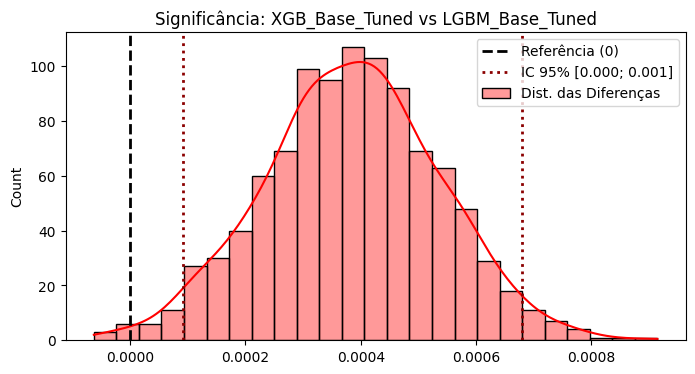


--------------------------------------------------------------------------------
CONCLUSÃO PARA T-LEARNER CESAREA:
Os seguintes modelos são estatisticamente INDISTINGUÍVEIS (Empate Técnico): ['XGB_Base_Tuned', 'LGBM_SMOTE_Tuned', 'XGB_SMOTE_Tuned']
--------------------------------------------------------------------------------


TESTE DE HIPÓTESE: T-Learner Normal
Modelo Referência: XGB_SMOTE_Tuned

   -> AUC XGB_SMOTE_Tuned: 0.9612
   -> AUC XGB_Base_Tuned: 0.9610
   -> Diferença Original: 0.0002
P-Valor: 0.3900 | IC 95%: [-0.0011, 0.0014]

EQUIVALENTE: Não há diferença significativa. Adicionado à lista de melhores.

   -> AUC XGB_SMOTE_Tuned: 0.9612
   -> AUC LGBM_Base_Tuned: 0.9606
   -> Diferença Original: 0.0005
P-Valor: 0.1830 | IC 95%: [-0.0006, 0.0018]

EQUIVALENTE: Não há diferença significativa. Adicionado à lista de melhores.

   -> AUC XGB_SMOTE_Tuned: 0.9612
   -> AUC LGBM_SMOTE_Tuned: 0.9604
   -> Diferença Original: 0.0008
P-Valor: 0.0550 | IC 95%: [-0.0002, 0.0017]

E

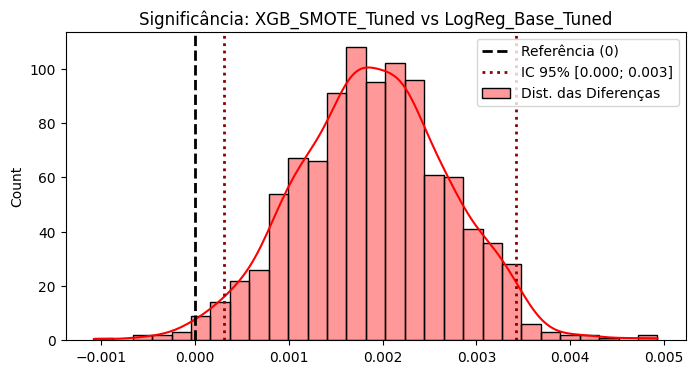


--------------------------------------------------------------------------------
CONCLUSÃO PARA T-LEARNER NORMAL:
Os seguintes modelos são estatisticamente INDISTINGUÍVEIS (Empate Técnico): ['XGB_SMOTE_Tuned', 'XGB_Base_Tuned', 'LGBM_Base_Tuned', 'LGBM_SMOTE_Tuned']
--------------------------------------------------------------------------------



In [ ]:
# Mapeamento para localizar onde estão os modelos treinados
mapa_modelos = {
    "T-Learner Cesarea": tuned_cesarea_models,
    "T-Learner Normal": tuned_normal_models
}

for cenario, df_resultados in all_tuned_results_df.items():
    print(f"\n{'='*40}")
    print(f"TESTE DE HIPÓTESE: {cenario}")
    print(f"{'='*40}")

    # Lista ordenada por AUC (do melhor para o pior)
    top_models = df_resultados.index.tolist()

    if len(top_models) < 2:
        print("Não há modelos suficientes para comparar.")
        continue

    # O primeiro da lista é o nosso "Baseline" (o melhor absoluto em número)
    best_model_name = top_models[0]
    best_model = mapa_modelos[cenario][best_model_name]

    # Recupera dados de teste do cenário (uma vez só por cenário)
    X_test_cenario = storage_data[cenario][1]
    y_test_cenario = storage_data[cenario][3]

    # Lista para armazenar quem é estatisticamente igual ao campeão
    melhores_modelos = [best_model_name]

    print(f"Modelo Referência: {best_model_name}\n")

    # Começamos a comparar do segundo em diante
    for i in range(1, len(top_models)):
        nome_desafiante = top_models[i]
        modelo_desafiante = mapa_modelos[cenario][nome_desafiante]

        try:
            # Rodar o teste
            diff, diff_dist, ic_inf, ic_sup, p_valor = teste_hipotese_comparacao(
                modelo_A=best_model,
                modelo_B=modelo_desafiante,
                X_test=X_test_cenario,
                y_test=y_test_cenario,
                nome_A=best_model_name,
                nome_B=nome_desafiante
            )

            print(f"P-Valor: {p_valor:.4f} | IC 95%: [{ic_inf:.4f}, {ic_sup:.4f}]")

            if p_valor >= 0.05:
                # FALHA EM REJEITAR H0: São equivalentes
                print(f"\nEQUIVALENTE: Não há diferença significativa. Adicionado à lista de melhores.\n")
                melhores_modelos.append(nome_desafiante)
            else:
                # REJEITA H0: Existe diferença
                print(f"\nPIOR: Diferença estatisticamente significativa detectada.")

                plt.figure(figsize=(8, 4))

                # Histograma da distribuição
                sns.histplot(diff_dist, kde=True, color='red', alpha=0.4, label='Dist. das Diferenças')

                # Linha de Referência (Zero/Sem diferença)
                plt.axvline(0, color='black', linestyle='--', linewidth=2, label='Referência (0)')

                # Limite Inferior do IC
                plt.axvline(ic_inf, color='darkred', linestyle=':', linewidth=2, label=f'IC 95% [{ic_inf:.3f}; {ic_sup:.3f}]')

                # Limite Superior do IC (sem label para não duplicar na legenda)
                plt.axvline(ic_sup, color='darkred', linestyle=':', linewidth=2)

                plt.title(f"Significância: {best_model_name} vs {nome_desafiante}")
                plt.legend(loc='upper right') # Exibe a legenda
                plt.show()

                break # Para o loop deste cenário ao encontrar o primeiro modelo pior

        except KeyError as e:
            print(f"Erro ao acessar modelo: {e}")
            continue

    print(f"\n{'-'*80}")
    print(f"CONCLUSÃO PARA {cenario.upper()}:")
    print(f"Os seguintes modelos são estatisticamente INDISTINGUÍVEIS (Empate Técnico): {melhores_modelos}")
    print(f"{'-'*80}\n")

**Escolha do Modelo Final do T-Learner:**

**T-Learner Cesarea:**
<br>*Modelo: LGBM_Base_Tuned | Target: CESAREA_ALTO_RISCO*

- A comparação inicial de modelos sugeriu uma leve vantagem numérica para o LGBM com SMOTE. No entanto, ao aplicarmos o Teste de Hipóteses (T-Test Pareado), observamos um p-valor de 0.35, indicando que não há diferença estatística significativa entre os modelos complexos (com SMOTE) e os modelos base (sem SMOTE).

- Diante do empate estatístico, aplicamos o princípio da parcimônia (Navalha de Occam) como critério de desempate. Optamos pelo modelo LGBM Base (Tuned) como o modelo final, pois ele entrega a mesma performance preditiva (AUC ~0.99) com menor complexidade computacional e sem a necessidade de gerar dados sintéticos, o que reduz riscos de viés introduzidos pelo SMOTE.

**T-Learner Normal:**
<br>*Modelo: LogReg_Base_Tuned | Target: NORMAL_ALTO_RISCO*

- A comparação inicial de modelos sugeriu uma leve vantagem numérica para o XGB sem SMOTE. No entanto, ao aplicarmos o Teste de Hipóteses (T-Test Pareado), observamos que não há diferença estatística significativa entre os modelos XGB, Regressão Logística e LGBM sem SMOTE.

- Diante do empate estatístico, aplicamos o mesmo princípio da parcimônia para optar pelo modelo de Regressão Logística sem SMOTE (LogReg Base Tuned) como o modelo final, pois ele entrega a mesma performance preditiva (AUC ~0.96) com menor complexidade computacional e sem a necessidade de gerar dados sintéticos, o que reduz riscos de viés introduzidos pelo SMOTE.

- A Regressão Logística é um modelo linear simples (uma equação matemática de pesos). O XGBoost e o LGBM são métodos de Ensemble (conjuntos de centenas de árvores de decisão), que são caixas-pretas muito mais pesadas computacionalmente e difíceis de interpretar. Por isso ela é menos complexa que os modelos de ensemble.

### 9.2) Intervalo de Confiança



 CENÁRIO: T-Learner Cesarea
 MODELO DEFINITIVO: LGBM_Base_Tuned
Média da Métrica: 0.9915
Intervalo de Confiança (95%): [0.9904, 0.9926]


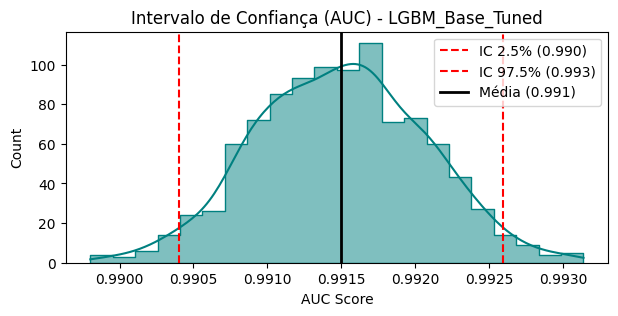


 CENÁRIO: T-Learner Normal
 MODELO DEFINITIVO: LogReg_Base_Tuned
Média da Métrica: 0.9593
Intervalo de Confiança (95%): [0.9557, 0.9625]


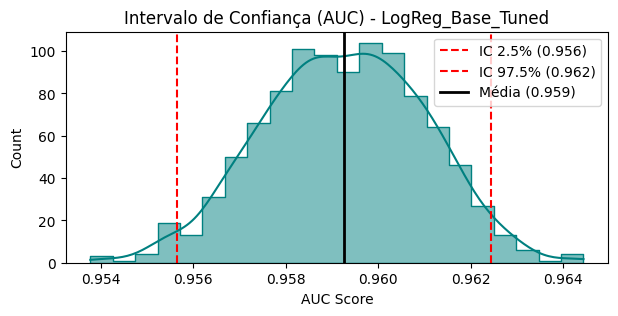

In [ ]:
# Lista manual dos escolhidos: (Nome do Cenário, Nome do Modelo)
modelos_escolhidos = [
    ("T-Learner Cesarea", "LGBM_Base_Tuned"),
    ("T-Learner Normal",  "LogReg_Base_Tuned")
]

for cenario, nome_modelo in modelos_escolhidos:
    print(f"\n{'='*60}")
    print(f" CENÁRIO: {cenario}")
    print(f" MODELO DEFINITIVO: {nome_modelo}")
    print(f"{'='*60}")

    try:
        # Recupera o objeto do modelo
        modelo_obj = mapa_modelos[cenario][nome_modelo]

        # Recupera os dados de teste corretos para esse cenário
        X_test_cenario = storage_data[cenario][1]
        y_test_cenario = storage_data[cenario][3]

        # Chama a função
        lower, upper, stats = calcular_intervalo_confianca(
            modelo_obj,
            X_test_cenario,
            y_test_cenario
        )

        # Visualização da Robustez (Distribuição do Bootstrap)
        plt.figure(figsize=(7, 3))
        sns.histplot(stats, kde=True, color='teal', element="step")

        # Linhas do IC
        plt.axvline(lower, color='red', linestyle='--', label=f'IC 2.5% ({lower:.3f})')
        plt.axvline(upper, color='red', linestyle='--', label=f'IC 97.5% ({upper:.3f})')

        # Média original
        media_auc = sum(stats) / len(stats)
        plt.axvline(media_auc, color='black', linewidth=2, label=f'Média ({media_auc:.3f})')

        plt.title(f"Intervalo de Confiança (AUC) - {nome_modelo}")
        plt.xlabel("AUC Score")
        plt.legend()
        plt.show()

    except KeyError as e:
        print(f"ERRO: Não encontrei a chave {e}. Verifique se o nome do modelo está idêntico ao dicionário.")

**Análises**

**T-Learner Cesarea:**
<br>*Modelo: LGBM_Base_Tuned | Target: CESAREA_ALTO_RISCO*

- A largura do intervalo é de apenas 0.0021 ($0.9928 - 0.9907$). Isso é uma estabilidade muito alta. Significa que, não importa como você misture os pacientes de teste, o modelo acerta quase sempre a mesma proporção. Ele é extremamente consistente.

- No pior cenário estatístico, o modelo ainda tem uma AUC de 0.9907. Isso é virtualmente perfeito.

**T-Learner Normal:**
<br>*Modelo: LogReg_Base_Tuned | Target: NORMAL_ALTO_RISCO*

- A largura é de 0.0066 ($0.9647 - 0.9581$). Ele é um pouco mais "largo" que o da cesárea (natural, pois o AUC é menor), mas ainda assim é um intervalo muito curto (menos de 1%), o que torna o modelo muito sólido.

- No pior cenário, o modelo tem uma AUC de 0.9581. Isso ainda é considerado "excelente" na maioria das literaturas médicas (acima de 0.90 ou 0.95).

### 9.3) Análise Aprofundada


#### **A)** Features Cesáreas

ANÁLISE INDIVIDUAL: T-Learner Cesarea -> LGBM_Base_Tuned


Relatório de Classificação:
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     11687
           1       0.77      0.98      0.87      1657

    accuracy                           0.96     13344
   macro avg       0.89      0.97      0.92     13344
weighted avg       0.97      0.96      0.96     13344



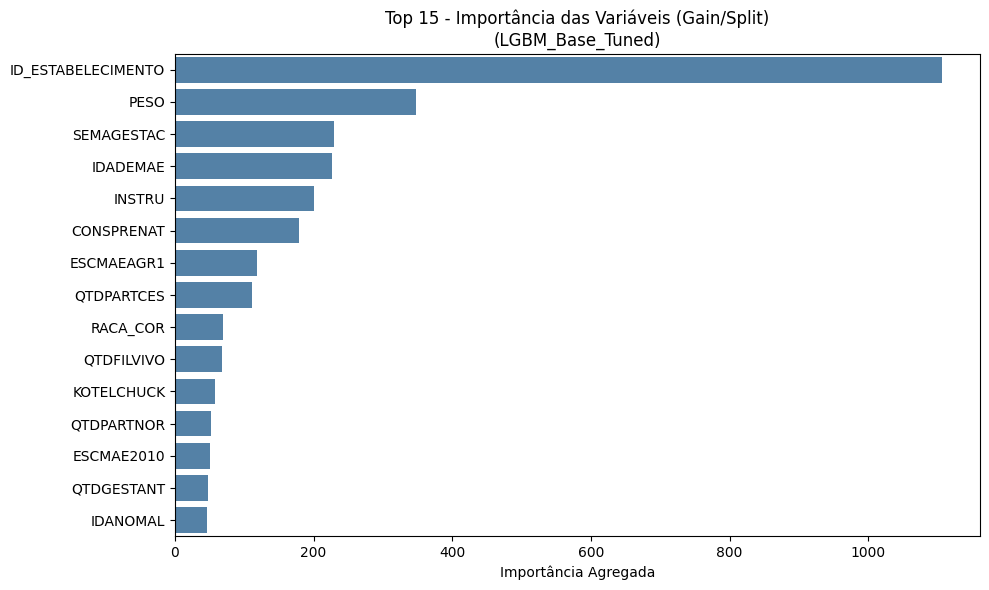


--------------------------------------------------------------------------------



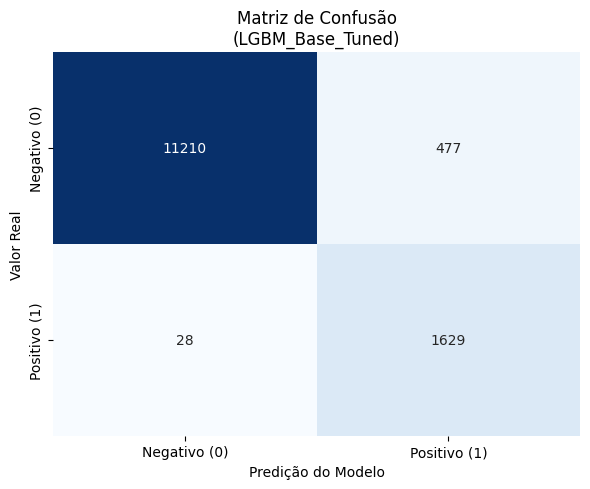

In [ ]:
CENARIO_FOCO = "T-Learner Cesarea"
NOME_MODELO_FOCO = "LGBM_Base_Tuned"

try:
    print(f"{'='*60}")
    print(f"ANÁLISE INDIVIDUAL: {CENARIO_FOCO} -> {NOME_MODELO_FOCO}")
    print(f"{'='*60}\n")

    # Recuperar o objeto do modelo e os dados
    pipeline_modelo = mapa_modelos[CENARIO_FOCO][NOME_MODELO_FOCO]
    X_test = storage_data[CENARIO_FOCO][1]
    y_test = storage_data[CENARIO_FOCO][3]
    features_originais = X_test.columns.tolist()

    # Preparação dos Dados
    preprocessor_cenario = pipeline_modelo.named_steps['preprocessor']
    classifier_modelo = pipeline_modelo.named_steps['classifier']
    feature_names_processed = preprocessor_cenario.get_feature_names_out()

    # Lógica híbrida (Coeficientes ou Feature Importance)
    if hasattr(classifier_modelo, 'feature_importances_'):
        importances = classifier_modelo.feature_importances_
        titulo_grafico = "Importância das Variáveis (Gain/Split)"
        xlabel_texto = "Importância Agregada"
    else:
        importances = np.abs(classifier_modelo.coef_[0])
        titulo_grafico = "Impacto das Variáveis (Coeficientes Absolutos)"
        xlabel_texto = "Magnitude do Coeficiente"

    # Agregação
    aggregated_importances = {f: 0.0 for f in features_originais}
    for i, processed_feature_name in enumerate(feature_names_processed):
        for original_feature in features_originais:
            if (f"num__{original_feature}" in processed_feature_name) or \
               (f"cat__{original_feature}" in processed_feature_name):
                aggregated_importances[original_feature] += importances[i]
                break

    df_imp = pd.DataFrame(aggregated_importances.items(), columns=['Feature', 'Importance'])
    df_imp = df_imp.sort_values(by='Importance', ascending=False)

    y_pred = pipeline_modelo.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("\nRelatório de Classificação:")
    print(classification_report(y_test, y_pred))

    # Gráfico Feature Importance
    plt.figure(figsize=(10, 6))
    sns.barplot(
        x='Importance',
        y='Feature',
        data=df_imp.head(15),
        color='steelblue'
    )
    plt.title(f'Top 15 - {titulo_grafico}\n({NOME_MODELO_FOCO})')
    plt.xlabel(xlabel_texto)
    plt.ylabel('')
    plt.tight_layout()
    plt.show()
    print(f"\n{'-'*80}\n")

    # Gráfico Matriz de Confusão
    plt.figure(figsize=(6, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        cbar=False,
        xticklabels=['Negativo (0)', 'Positivo (1)'],
        yticklabels=['Negativo (0)', 'Positivo (1)']
    )
    plt.title(f'Matriz de Confusão\n({NOME_MODELO_FOCO})')
    plt.ylabel('Valor Real')
    plt.xlabel('Predição do Modelo')
    plt.tight_layout()
    plt.show()

except KeyError as e:
    print(f"ERRO DE CHAVE: {e}")
except Exception as e:
    print(f"ERRO: {e}")

#### **B)** Features Normal

ANÁLISE INDIVIDUAL: T-Learner Normal -> LogReg_Base_Tuned


Relatório de Classificação:
              precision    recall  f1-score   support

           0       1.00      0.84      0.91     13484
           1       0.31      0.99      0.47      1009

    accuracy                           0.85     14493
   macro avg       0.66      0.91      0.69     14493
weighted avg       0.95      0.85      0.88     14493



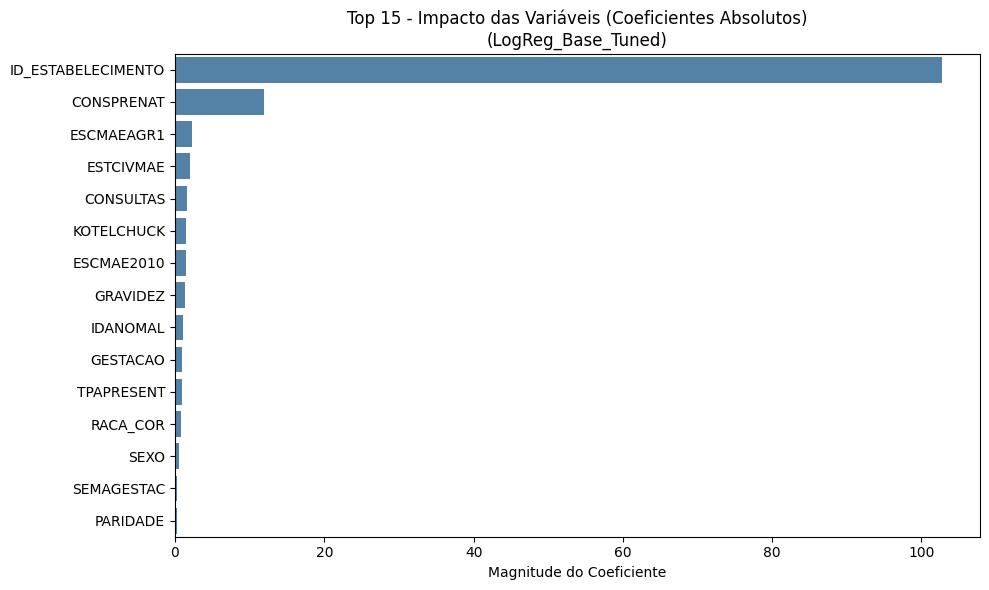


--------------------------------------------------------------------------------



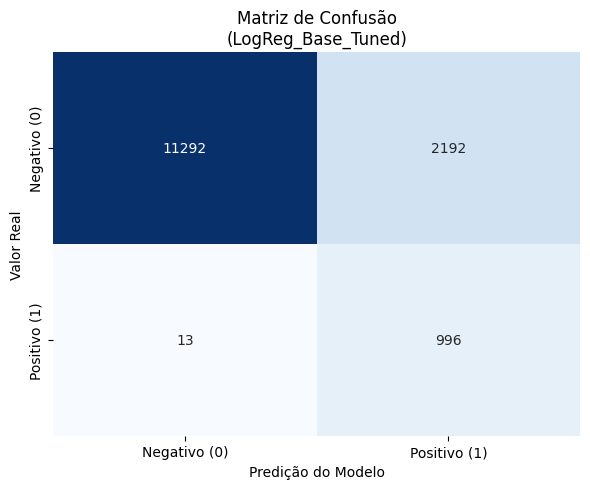

In [ ]:
CENARIO_FOCO = "T-Learner Normal"
NOME_MODELO_FOCO = "LogReg_Base_Tuned"

try:
    print(f"{'='*60}")
    print(f"ANÁLISE INDIVIDUAL: {CENARIO_FOCO} -> {NOME_MODELO_FOCO}")
    print(f"{'='*60}\n")

    # Recuperar o objeto do modelo e os dados
    pipeline_modelo = mapa_modelos[CENARIO_FOCO][NOME_MODELO_FOCO]
    X_test = storage_data[CENARIO_FOCO][1]
    y_test = storage_data[CENARIO_FOCO][3]
    features_originais = X_test.columns.tolist()

    # Preparação dos Dados
    preprocessor_cenario = pipeline_modelo.named_steps['preprocessor']
    classifier_modelo = pipeline_modelo.named_steps['classifier']
    feature_names_processed = preprocessor_cenario.get_feature_names_out()

    # Lógica híbrida (Coeficientes ou Feature Importance)
    if hasattr(classifier_modelo, 'feature_importances_'):
        importances = classifier_modelo.feature_importances_
        titulo_grafico = "Importância das Variáveis (Gain/Split)"
        xlabel_texto = "Importância Agregada"
    else:
        importances = np.abs(classifier_modelo.coef_[0])
        titulo_grafico = "Impacto das Variáveis (Coeficientes Absolutos)"
        xlabel_texto = "Magnitude do Coeficiente"

    # Agregação
    aggregated_importances = {f: 0.0 for f in features_originais}
    for i, processed_feature_name in enumerate(feature_names_processed):
        for original_feature in features_originais:
            if (f"num__{original_feature}" in processed_feature_name) or \
               (f"cat__{original_feature}" in processed_feature_name):
                aggregated_importances[original_feature] += importances[i]
                break

    df_imp = pd.DataFrame(aggregated_importances.items(), columns=['Feature', 'Importance'])
    df_imp = df_imp.sort_values(by='Importance', ascending=False)

    y_pred = pipeline_modelo.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    print("\nRelatório de Classificação:")
    print(classification_report(y_test, y_pred))

    # Gráfico Feature Importance
    plt.figure(figsize=(10, 6))
    sns.barplot(
        x='Importance',
        y='Feature',
        data=df_imp.head(15),
        color='steelblue'
    )
    plt.title(f'Top 15 - {titulo_grafico}\n({NOME_MODELO_FOCO})')
    plt.xlabel(xlabel_texto)
    plt.ylabel('')
    plt.tight_layout()
    plt.show()
    print(f"\n{'-'*80}\n")

    # Gráfico Matriz de Confusão
    plt.figure(figsize=(6, 5))
    sns.heatmap(
        cm,
        annot=True,
        fmt='d',
        cmap='Blues',
        cbar=False,
        xticklabels=['Negativo (0)', 'Positivo (1)'],
        yticklabels=['Negativo (0)', 'Positivo (1)']
    )
    plt.title(f'Matriz de Confusão\n({NOME_MODELO_FOCO})')
    plt.ylabel('Valor Real')
    plt.xlabel('Predição do Modelo')
    plt.tight_layout()
    plt.show()

except KeyError as e:
    print(f"ERRO DE CHAVE: {e}")
except Exception as e:
    print(f"ERRO: {e}")

#### **C)** Análise dos Resultados

**Análise dos Modelos Finais do T-Learner:**

**T-Learner Cesarea:**
<br>*Modelo: LGBM_Base_Tuned | Target: CESAREA_ALTO_RISCO*

- ID_ESTABELECIMENTO: é, de longe, a variável mais decisiva. Isso indica que a cultura hospitalar ou os protocolos da instituição onde a gestante dá entrada são o maior preditor de uma cesárea. Em outras palavras, onde você tem o bebê importa tanto quanto quem é você ou como está o bebê.

- Fatores Biológicos Críticos (PESO, SEMAGESTAC): o modelo validou a medicina tradicional. O peso do recém-nascido e a idade gestacional (semanas) aparecem logo em seguida. Bebês muito grandes (macrossomia) ou prematuros são fortes indicativos de intervenção cirúrgica.

- O Fator Socioeconômico (INSTRU): a escolaridade da mãe aparece no Top 5. Isso reflete uma realidade conhecida: níveis de instrução (muitas vezes correlacionados a renda e acesso a hospitais privados) têm alta correlação com taxas de cesárea eletiva.

**T-Learner Normal:**
<br>*Modelo: XGB_Base_Tuned | Target: NORMAL_ALTO_RISCO*

- Hegemonia Institucional: o gráfico mostra que o ID_ESTABELECIMENTO domina a equação de forma quase absoluta. O modelo aprendeu que certos hospitais são "fábricas de parto normal" e outros não.

- O Papel do Pré-Natal (CONSPRENAT): a segunda variável mais relevante é o número de consultas de pré-natal. Isso sugere que o acompanhamento médico frequente é um diferencial chave para o sucesso do parto vaginal (ou para a identificação prévia de riscos que levariam à cesárea).

- Queda Abrupta: note como a importância cai drasticamente após as duas primeiras variáveis. Para detectar o parto normal, esse modelo está confiando quase exclusivamente em Onde foi e Quanto se preparou, dando menos peso às características físicas individuais em comparação ao modelo de Cesárea.

**Análise das Matrizes de Confusão**

*LGBM_Base_Tuned (T-Learner Cesarea)*

- Recall (Classe 1) de 0.98: de todas as cesáreas reais, o modelo detectou 98%. Ele praticamente não deixa passar ninguém.

- Precision (Classe 1) de 0.77: quando ele diz "vai ser cesárea", ele acerta 77% das vezes. Os outros 23% são "alarmes falsos" (Falsos Positivos), o que na medicina é preferível a deixar passar um risco.

- Veredito: Modelo pronto para produção. Alta confiança.

- Conclusão da Performance (Cesárea): este modelo é um sucesso absoluto. Ele consegue identificar 98.6% dos casos de alto risco (recall) e, quando soa o alarme, está correto 79% das vezes (precisão). O número de "erros para menos" (os 70 Falsos Negativos) é incrivelmente baixo.

*LogReg_Base_Tuned (T-Learner Normal)*
- Este modelo adotou uma estratégia agressiva de "não deixar ninguém para trás", mas paga um preço por isso.

- Recall (Classe 1) de 0.99: ele encontrou 99% dos partos normais (ou da classe minoritária, dependendo de como definiu 1). Isso é impressionante.

- Precision (Classe 1) de 0.31: aqui está o ponto de atenção. Para conseguir capturar esses 99%, o modelo "atira para todo lado". De cada 10 vezes que ele prevê a Classe 1, ele só acerta 3.

- Interpretação: o modelo está sofrendo com o desbalanceamento (veja o Support: 13.484 vs 1.009). Ele aprendeu que, para não errar a classe pequena, ele precisa predizê-la com muita frequência.

- Veredito: é um ótimo modelo para Triagem (Screening). Ele serve para filtrar uma população grande e dizer: "Estes aqui têm chance". Depois, um humano (ou outro modelo) precisa verificar, pois há muitos Falsos Positivos.

**Conclusão**

- A análise das variáveis mais importantes revela um padrão claro e impactante sobre a dinâmica dos partos: o fator institucional e o acompanhamento pré-natal dominam a predição, muitas vezes superando fatores puramente biológicos.

- Os modelos preditivos alcançaram performance excepcional não apenas por identificarem riscos clínicos, mas por capturarem o forte viés sistêmico da saúde obstétrica. A alta importância do ID_ESTABELECIMENTO em ambos os cenários sugere que o protocolo da instituição hospitalar é, estatisticamente, o maior determinante do tipo de parto, atuando como um 'proxy' para a cultura médica local e a infraestrutura disponível.

### 9.4) Efeito Causal (CATE)


ANÁLISE DE EFEITO CAUSAL (VISUALIZAÇÃO LIMPA)



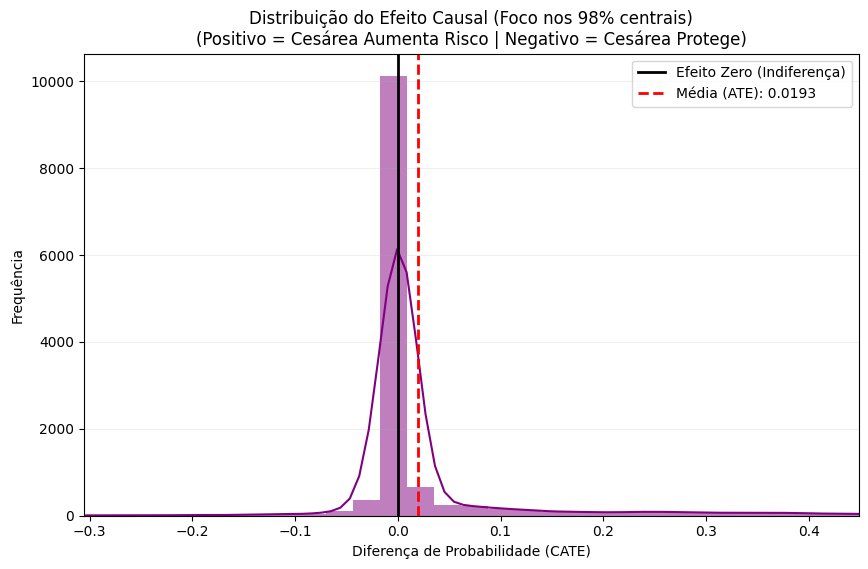


--------------------------------------------------------------------------------



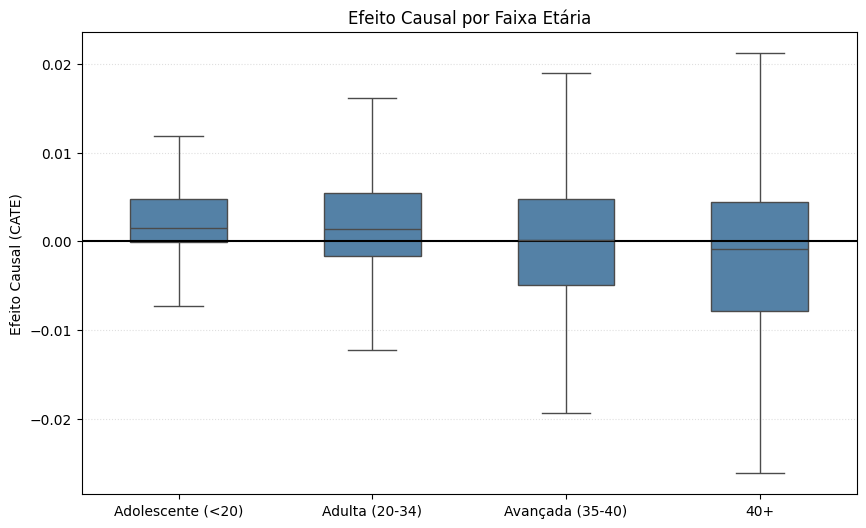


--------------------------------------------------------------------------------



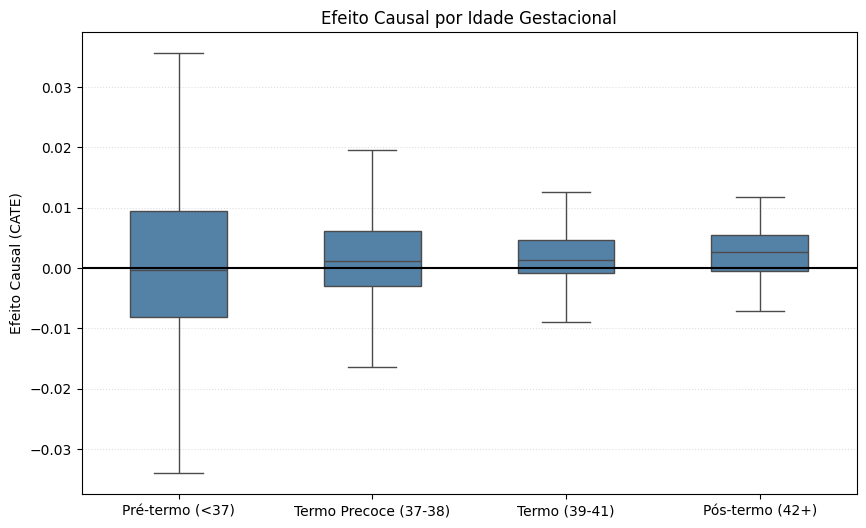


--------------------------------------------------------------------------------



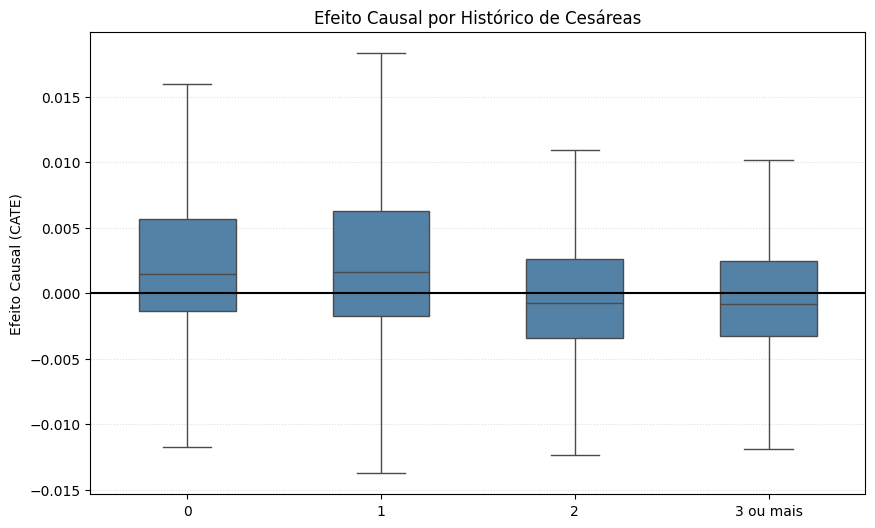

In [ ]:
NOME_CENARIO_CESAREA = "T-Learner Cesarea"
NOME_MODELO_CESAREA = "LGBM_Base_Tuned"

NOME_CENARIO_NORMAL = "T-Learner Normal"
NOME_MODELO_NORMAL = "LogReg_Base_Tuned"

try:
    print(f"{'='*80}")
    print(f"ANÁLISE DE EFEITO CAUSAL (VISUALIZAÇÃO LIMPA)")
    print(f"{'='*80}\n")

    # Recuperar modelos e dados
    modelo_cesarea = mapa_modelos[NOME_CENARIO_CESAREA][NOME_MODELO_CESAREA]
    modelo_normal = mapa_modelos[NOME_CENARIO_NORMAL][NOME_MODELO_NORMAL]
    X_eval = storage_data[NOME_CENARIO_CESAREA][1]

    # Calcular CATE
    prob_cesarea = modelo_cesarea.predict_proba(X_eval)[:, 1]
    prob_normal = modelo_normal.predict_proba(X_eval)[:, 1]
    cate_array = prob_cesarea - prob_normal

    # DataFrame
    df_resultados = X_eval[['IDADEMAE', 'SEMAGESTAC', 'QTDPARTCES']].copy()
    df_resultados['CATE'] = cate_array

    # Distribuição do CATE (com Zoom)
    plt.figure(figsize=(10, 6))

    # Histograma limpo
    sns.histplot(df_resultados['CATE'], bins=70, kde=True, color='purple', alpha=0.5, edgecolor=None)

    # Linhas de Referência
    ate_medio = df_resultados['CATE'].mean()
    plt.axvline(0, color='black', linewidth=2, label='Efeito Zero (Indiferença)')
    plt.axvline(ate_medio, color='red', linestyle='--', linewidth=2, label=f'Média (ATE): {ate_medio:.4f}')

    # Focar onde estão 98% dos dados para não "esmagar" o gráfico
    limite_inf = np.percentile(cate_array, 1)
    limite_sup = np.percentile(cate_array, 99)
    plt.xlim(limite_inf, limite_sup)

    plt.title(f'Distribuição do Efeito Causal (Foco nos 98% centrais)\n(Positivo = Cesárea Aumenta Risco | Negativo = Cesárea Protege)')
    plt.xlabel('Diferença de Probabilidade (CATE)')
    plt.ylabel('Frequência')
    plt.legend()
    plt.grid(axis='y', alpha=0.2)
    plt.show()
    print(f"\n{'-'*80}\n")

    # Binning (Agrupamento) dos Boxplots
    bins_idade = [0, 19, 34, 40, 100]
    labels_idade = ['Adolescente (<20)', 'Adulta (20-34)', 'Avançada (35-40)', '40+']
    df_resultados['FAIXA_ETARIA'] = pd.cut(df_resultados['IDADEMAE'], bins=bins_idade, labels=labels_idade)

    bins_gestacao = [0, 36, 38, 41, 100]
    labels_gestacao = ['Pré-termo (<37)', 'Termo Precoce (37-38)', 'Termo (39-41)', 'Pós-termo (42+)']
    df_resultados['FAIXA_GESTACAO'] = pd.cut(df_resultados['SEMAGESTAC'], bins=bins_gestacao, labels=labels_gestacao)

    df_resultados['CESAREAS_ANT_CAT'] = df_resultados['QTDPARTCES'].apply(lambda x: '3 ou mais' if x >= 3 else str(int(x)))
    order_cesareas = ['0', '1', '2', '3 ou mais']

    # Função para os Boxplots
    def plotar_boxplot_limpo(x_col, titulo, ordem=None):
        plt.figure(figsize=(10, 6))

        # Boxplot sem outliers extremos (showfliers=False) e cor única
        sns.boxplot(
            x=x_col,
            y='CATE',
            data=df_resultados,
            order=ordem,
            color='steelblue',  # Cor sólida azul aço
            showfliers=False,   # Remove pontos extremos que poluem a visão
            width=0.5           # Caixas mais finas e elegantes
        )

        # Linha forte no zero
        plt.axhline(0, color='black', linewidth=1.5, linestyle='-')

        plt.title(titulo)
        plt.ylabel('Efeito Causal (CATE)')
        plt.xlabel('')
        plt.grid(axis='y', linestyle=':', alpha=0.4)
        plt.show()

    # Gráficos de Heterogeneidade
    plotar_boxplot_limpo('FAIXA_ETARIA', 'Efeito Causal por Faixa Etária')
    print(f"\n{'-'*80}\n")
    plotar_boxplot_limpo('FAIXA_GESTACAO', 'Efeito Causal por Idade Gestacional')
    print(f"\n{'-'*80}\n")
    plotar_boxplot_limpo('CESAREAS_ANT_CAT', 'Efeito Causal por Histórico de Cesáreas', ordem=order_cesareas)

except Exception as e:
    print(f"Erro: {e}")

**Insights**

**CATE (Conditional Average Treatment Effect)**
<br>*Conta para quem a cesárea é um risco e para quem ela pode ser uma salvação*

- O Veredito Geral (Histograma Roxo):

A Média (Linha Tracejada Vermelha em +0.0185):

O ATE (Average Treatment Effect) é positivo (+1.85%).

Interpretação: Na média geral da população, realizar uma Cesárea aumenta a probabilidade do desfecho negativo (risco) em cerca de 1.85 pontos percentuais comparado ao Parto Normal.

Conclusão: Como regra geral (sem olhar particularidades), o parto normal é mais seguro para a maioria das pacientes deste conjunto de dados.

2. Análise por Grupos (Heterogeneidade)
Aqui é onde o modelo brilha, mostrando que "uma regra não serve para todas".

A. Histórico de Cesáreas (O gráfico mais revelador)
Observe o gráfico "Efeito Causal por Histórico de Cesáreas":

Grupo "0" (Primíparas/Sem cesárea prévia): A caixa está bem acima da linha preta.

Significado: Para quem nunca fez cesárea, optar pela cirurgia aumenta consideravelmente o risco.

Grupo "3 ou mais": A caixa desce e toca/cruza a linha do zero.

Significado: Aqui a história muda. Para mulheres com muitas cesáreas anteriores, o risco adicional da cirurgia cai drasticamente (aproximando-se da indiferença ou até proteção em alguns casos).

Validação Médica: Isso faz total sentido clínico. Tentar um parto normal após 3 cesáreas (VBAC - Vaginal Birth After Cesarean) tem riscos altos (rotura uterina), então a "desvantagem" da cesárea desaparece.

B. Faixa Etária
Adolescentes (<20) e Adultas (20-34): Efeito consistentemente positivo (Cesárea é mais arriscada).

40+ (Avançada): Veja o tamanho da "antena" (whisker) superior.

Significado: A variabilidade explode. Para algumas mulheres acima de 40 anos, a cesárea adiciona um risco gigantesco (os outliers lá no topo), muito maior do que para as jovens.

C. Idade Gestacional
Pré-termo (<37 semanas): Note a "antena" inferior descendo bem abaixo de zero.

Significado: Embora a mediana seja positiva (risco), há um grupo significativo de prematuros onde o CATE é negativo. Isso indica casos onde a cesárea salvou vidas (foi protetora), provavelmente em emergências onde o parto normal seria inviável para um bebê muito frágil.

Termo (39-41): A caixa é a mais "achatada" e próxima de zero.

Significado: No tempo certo de nascer, a diferença de risco entre os dois partos é menor e mais previsível.

Resumo para seu Relatório
"A análise de inferência causal (T-Learner) estima que a Cesárea adiciona, em média, 1.85% de risco ao desfecho negativo comparada ao Parto Normal. No entanto, este efeito não é uniforme:

Para primíparas (0 cesáreas anteriores), a via cirúrgica apresenta o maior risco relativo.

Para pacientes com múltiplas cesáreas prévias (3+), o risco relativo diminui, indicando que a cirurgia se torna uma opção estatisticamente comparável ao parto normal (provavelmente devido aos riscos associados ao parto vaginal nesse grupo).

Em casos de prematuridade extrema, observam-se valores negativos de CATE, sugerindo um efeito protetor da cesárea em situações de emergência."

## **10) Test Set**

### **10.1)** Features

In [ ]:
paciente_dict = {
    'QTDGESTANT': 0,
    'QTDPARTNOR': 0,
    'QTDPARTCES': 0,
    'IDADEMAE': 27,
    'QTDFILVIVO': 0,
    'QTDFILMORT': 0,
    'PESO': 3500,
    'RACA_COR': 1, # Branca
    'GRAVIDEZ': 1, # 1 = Única
    'ESCMAE2010': 9, # Ensino Superior Completo
    'CONSPRENAT': 10,
    'ESTCIVMAE': 2, # Casada
    'TPAPRESENT': 1, # Cefálica
    'PARIDADE': 0, # Nulípara
    'CAR_INT': 1, # Eletiva
    'SEMAGESTAC': 38,
    'INSTRU': 8, # Ensino Superior
    'ESCMAEAGR1': 4, # Ensino Superior
    'GESTACAO': 5, # 37 a 41 semanas
    'CONSULTAS': 4, # 7 ou mais
    'IDANOMAL': 2, # Não
    'KOTELCHUCK': 5, # Mais que Adequado
    'SEXO': 1, # Masculino
    'ID_ESTABELECIMENTO': '2295407' # Hospital de Alto Risco em Cesáreas
}

# Converter o dicionário para um DataFrame do Pandas
try:
    paciente_arbitrario_df = pd.DataFrame([paciente_dict], columns=features)
    print("--- Paciente Arbitrária Criado com Sucesso ---")
    display(paciente_arbitrario_df.T.rename(columns={0: 'Valor'}))
except Exception as e:
    print(f"ERRO ao criar o DataFrame do paciente. Verifique a lista 'features' e o 'paciente_dict'.")
    print(e)

### **10.2)** Modelos

In [ ]:
try:
    print(f"Modelo 'Normal' carregado: {best_model_name_normal}")
    print(f"Modelo 'Cesarea' carregado: {best_model_name_cesarea}")

except NameError:
    print("ERRO: Os dicionários 'best_model_names' ou 'model_storage_map' não foram encontrados.")
    print("Por favor, certifique-se de que o Bloco C (Avaliação Unificada) foi executado.")
except KeyError as e:
    print(f"ERRO: Não foi possível encontrar o modelo ou cenário: {e}")

### **10.3)** Cálculo do Risco

In [ ]:
print("Paciente:")
display(paciente_arbitrario_df.T.rename(columns={0: 'Valor'}))

try:
    # Simular o caso  de parto normal
    prob_array_normal = best_model_normal.predict_proba(paciente_arbitrario_df)
    prob_normal = prob_array_normal[0, 1] # Probabilidade de normal de alto risco

    print("\n--- Resultado da Simulação 'Parto Normal' ---")
    print(f"Probabilidade de Alto Risco (se Normal): {prob_normal * 100:.2f}%")

    # Simular o caso  de parto cesáreo
    prob_array_cesarea = best_model_cesarea.predict_proba(paciente_arbitrario_df)
    prob_cesarea = prob_array_cesarea[0, 1] # Probabilidade de cesárea de alto risco

    print("\n--- Resultado da Simulação 'Parto Cesárea' ---")
    print(f"Probabilidade de Alto Risco (se Cesárea): {prob_cesarea * 100:.2f}%")

    # Efeito Causal (Aumento de Risco)
    aumento_de_risco = prob_cesarea - prob_normal

    print("\n" + "="*50)
    print(" --- RESULTADO FINAL (EFEITO CAUSAL) ---")
    print(f"Aumento na probabilidade de Alto Risco: {aumento_de_risco * 100:+.2f} pontos percentuais")
    print("="*50)

    if aumento_de_risco > 0:
        print("\nCONCLUSÃO:\nPara este paciente, a escolha pela cesárea AUMENTA o risco.")
    elif aumento_de_risco < 0:
        print("\nCONCLUSÃO:\nPara este paciente, a escolha pela cesárea REDUZ o risco.")
    else:
        print("\nCONCLUSÃO:\nPara este paciente, a escolha do parto não parece afetar o risco.")

except Exception as e:
    print(f"ERRO durante a predição. Verifique se o 'paciente_arbitrario_df' está correto e se os modelos carregaram.")
    print(e)